## Base imports

In [1]:
#Code base forked from https://github.com/JavierAntoran/Bayesian-Neural-Networks
%matplotlib inline
from __future__ import print_function, division
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()

import torch
from torch import nn, optim
from torch.autograd import Variable
from torch.optim import Optimizer


import collections
import h5py, sys
import gzip
import os
import math


try:
    import cPickle as pickle
except:
    import pickle

## Some utility functions

In [2]:
def mkdir(paths):
    if not isinstance(paths, (list, tuple)):
        paths = [paths]
    for path in paths:
        if not os.path.isdir(path):
            os.makedirs(path)

from __future__ import print_function
import torch
from torch import nn, optim
from torch.autograd import Variable
import numpy as np
import matplotlib.pyplot as plt
import sys

suffixes = ['B', 'KB', 'MB', 'GB', 'TB', 'PB']
def humansize(nbytes):
    i = 0
    while nbytes >= 1024 and i < len(suffixes)-1:
        nbytes /= 1024.
        i += 1
    f = ('%.2f' % nbytes)
    return '%s%s' % (f, suffixes[i])


def get_num_batches(nb_samples, batch_size, roundup=True):
    if roundup:
        return ((nb_samples + (-nb_samples % batch_size)) / batch_size)  # roundup division
    else:
        return nb_samples / batch_size

def generate_ind_batch(nb_samples, batch_size, random=True, roundup=True):
    if random:
        ind = np.random.permutation(nb_samples)
    else:
        ind = range(int(nb_samples))
    for i in range(int(get_num_batches(nb_samples, batch_size, roundup))):
        yield ind[i * batch_size: (i + 1) * batch_size]

def to_variable(var=(), cuda=True, volatile=False):
    out = []
    for v in var:
        if isinstance(v, np.ndarray):
            v = torch.from_numpy(v).type(torch.FloatTensor)

        if not v.is_cuda and cuda:
            v = v.cuda()

        if not isinstance(v, Variable):
            v = Variable(v, volatile=volatile)

        out.append(v)
    return out
  
def cprint(color, text, **kwargs):
    if color[0] == '*':
        pre_code = '1;'
        color = color[1:]
    else:
        pre_code = ''
    code = {
        'a': '30',
        'r': '31',
        'g': '32',
        'y': '33',
        'b': '34',
        'p': '35',
        'c': '36',
        'w': '37'
    }
    print("\x1b[%s%sm%s\x1b[0m" % (pre_code, code[color], text), **kwargs)
    sys.stdout.flush()

def shuffle_in_unison_scary(a, b):
    rng_state = np.random.get_state()
    np.random.shuffle(a)
    np.random.set_state(rng_state)
    np.random.shuffle(b)
    
    
import torch.utils.data as data
from PIL import Image
import numpy as np
import h5py



In [3]:
!pip install wandb

In [4]:
import wandb
wandb.login()

wandb: Currently logged in as: frostbrk (ias_2023_s1). Use `wandb login --relogin` to force relogin


True

## Dataloader functions

In [5]:
class Datafeed(data.Dataset):

    def __init__(self, x_train, y_train, transform=None):
        self.x_train = x_train
        self.y_train = y_train
        self.transform = transform

    def __getitem__(self, index):
        img = self.x_train[index]
        if self.transform is not None:
            img = self.transform(img)
        return img, self.y_train[index]

    def __len__(self):
        return len(self.x_train)

class DatafeedImage(data.Dataset):
    def __init__(self, x_train, y_train, transform=None):
        self.x_train = x_train
        self.y_train = y_train
        self.transform = transform

    def __getitem__(self, index):
        img = self.x_train[index]
        img = Image.fromarray(np.uint8(img))
        if self.transform is not None:
            img = self.transform(img)
        return img, self.y_train[index]

    def __len__(self):
        return len(self.x_train)

## Base network wrapper

In [6]:
import torch.nn.functional as F
class BaseNet(object):
    def __init__(self):
        cprint('c', '\nNet:')

    def get_nb_parameters(self):
        return np.sum(p.numel() for p in self.model.parameters())

    def set_mode_train(self, train=True):
        if train:
            self.model.train()
        else:
            self.model.eval()

    def update_lr(self, epoch, gamma=0.99):
        self.epoch += 1
        if self.schedule is not None:
            if len(self.schedule) == 0 or epoch in self.schedule:
                self.lr *= gamma
                print('learning rate: %f  (%d)\n' % self.lr, epoch)
                for param_group in self.optimizer.param_groups:
                    param_group['lr'] = self.lr

    def save(self, filename):
        cprint('c', 'Writting %s\n' % filename)
        torch.save({
            'epoch': self.epoch,
            'lr': self.lr,
            'model': self.model,
            'optimizer': self.optimizer}, filename)

    def load(self, filename):
        cprint('c', 'Reading %s\n' % filename)
        state_dict = torch.load(filename)
        self.epoch = state_dict['epoch']
        self.lr = state_dict['lr']
        self.model = state_dict['model']
        self.optimizer = state_dict['optimizer']
        print('  restoring epoch: %d, lr: %f' % (self.epoch, self.lr))
        return self.epoch

## Our models

In [7]:
class Linear_2L(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(Linear_2L, self).__init__()
        
        n_hid = 1200
        
        self.input_dim = input_dim
        self.output_dim = output_dim
        
        self.fc1 = nn.Linear(input_dim, n_hid)
        self.fc2 = nn.Linear(n_hid, n_hid)
        self.fc3 = nn.Linear(n_hid, output_dim)
        
        # choose your non linearity
        #self.act = nn.Tanh()
        #self.act = nn.Sigmoid()
        self.act = nn.ReLU(inplace=True)
        #self.act = nn.ELU(inplace=True)
        #self.act = nn.SELU(inplace=True)

    def forward(self, x):
        
        
        x = x.view(-1, self.input_dim) # view(batch_size, input_dim)
        # -----------------
        x = self.fc1(x)
        # -----------------
        x = self.act(x)
        # -----------------
        x = self.fc2(x)
        # -----------------
        x = self.act(x)
        # -----------------
        y = self.fc3(x)
        
        return y
        

## Network wrapper

In [8]:
from __future__ import division

class Bootstrap_Net(BaseNet):
    eps = 1e-6

    def __init__(self, lr=1e-3, channels_in=3, side_in=28, cuda=True, classes=10, batch_size=128, weight_decay=0):
        super(Bootstrap_Net, self).__init__()
        cprint('y', ' Creating Net!! ')
        self.lr = lr
        self.schedule = None  # [] #[50,200,400,600]
        self.cuda = cuda
        self.channels_in = channels_in
        self.weight_decay = weight_decay
        self.classes = classes
        self.batch_size = batch_size
        self.side_in=side_in
        self.create_net()
        self.create_opt()
        self.epoch = 0

        self.test=False

    def create_net(self):
#         torch.manual_seed(42)
#         if self.cuda:
#             torch.cuda.manual_seed(42)

        self.model = Linear_2L(input_dim=self.channels_in*self.side_in*self.side_in, output_dim=self.classes)
        if self.cuda:
            self.model.cuda()
#             cudnn.benchmark = True

        print('    Total params: %.2fM' % (self.get_nb_parameters() / 1000000.0))

    def create_opt(self):
#         self.optimizer = torch.optim.Adam(self.model.parameters(), lr=self.lr, betas=(0.9, 0.999), eps=1e-08,
#                                           weight_decay=0)
        self.optimizer = torch.optim.SGD(self.model.parameters(), lr=self.lr, momentum=0.5, weight_decay=self.weight_decay)

    #         self.optimizer = torch.optim.SGD(self.model.parameters(), lr=self.lr, momentum=0.9)
#         self.sched = torch.optim.lr_scheduler.StepLR(self.optimizer, step_size=1, gamma=10, last_epoch=-1)

    def fit(self, x, y):
        x, y = to_variable(var=(x, y.long()), cuda=self.cuda)

        self.optimizer.zero_grad()

        out = self.model(x)
        loss = F.cross_entropy(out, y, reduction='sum')
            
        loss.backward()
        self.optimizer.step()

        # out: (batch_size, out_channels, out_caps_dims)
        pred = out.data.max(dim=1, keepdim=False)[1]  # get the index of the max log-probability
        err = pred.ne(y.data).sum()

        return loss.data, err

    def eval(self, x, y, train=False):
        x, y = to_variable(var=(x, y.long()), cuda=self.cuda)

        out = self.model(x)

        loss = F.cross_entropy(out, y, reduction='sum')

        probs = F.softmax(out, dim=1).data.cpu()

        pred = out.data.max(dim=1, keepdim=False)[1]  # get the index of the max log-probability
        err = pred.ne(y.data).sum()

        return loss.data, err, probs
    
    def get_weight_samples(self):
        weight_vec = []
        
        state_dict = self.model.state_dict()
        
        for key in state_dict.keys():
            
            if 'weight' in key:
                weight_mtx = state_dict[key].cpu().data
                for weight in weight_mtx.view(-1):
                    weight_vec.append(weight)
            
        return np.array(weight_vec)
    
    def sample_eval(self, x, y, weight_set_samples, logits=True, train=False):
 
        Nsamples = len(weight_set_samples)
            
        x, y = to_variable(var=(x, y.long()), cuda=self.cuda)
        
        out = x.data.new(Nsamples, x.shape[0], self.classes)
        
        # iterate over all saved weight configuration samples
        for idx, weight_dict in enumerate(weight_set_samples):
            if idx == Nsamples:
                break
            self.model.load_state_dict(weight_dict)
            out[idx] = self.model(x)
        
        
        if logits:
            mean_out = out.mean(dim=0, keepdim=False)
            loss = F.cross_entropy(mean_out, y, reduction='sum')
            probs = F.softmax(mean_out, dim=1).data.cpu()
            
        else:
            mean_out =  F.softmax(out, dim=2).mean(dim=0, keepdim=False)
            probs = mean_out.data.cpu()
            
            log_mean_probs_out = torch.log(mean_out)
            loss = F.nll_loss(log_mean_probs_out, y, reduction='sum')

        pred = mean_out.data.max(dim=1, keepdim=False)[1]  # get the index of the max log-probability
        err = pred.ne(y.data).sum()

        return loss.data, err, probs
    
    def all_sample_eval(self, x, y, weight_set_samples):
        
        Nsamples = len(weight_set_samples)
            
        x, y = to_variable(var=(x, y.long()), cuda=self.cuda)
        
        out = x.data.new(Nsamples, x.shape[0], self.classes)
        
        # iterate over all saved weight configuration samples
        for idx, weight_dict in enumerate(weight_set_samples):
            if idx == Nsamples:
                break
            self.model.load_state_dict(weight_dict)
            out[idx] = self.model(x)
        
        prob_out =  F.softmax(out, dim=2)
        prob_out = prob_out.data

        return prob_out

In [9]:
import math
# ------------------------------------------------------------------------------------------------------
#sweep config
sweep_config = {
    'method' : 'grid'
}

# ------------------------------------------------------------------------------------------------------
#set metric
metric = {
    'name': 'train_loss',
    'goal': 'minimize'   
    }

sweep_config['metric'] = metric

# ------------------------------------------------------------------------------------------------------
parameters_dict = {
    'nb_epochs': {
        'values': [3, 5, 10]
       },
    'learning_rate': {
        'values': [1e-3, 1e-4, 1e-5]
        },
    'batch_size': {
        'values': [8,16,32,64,100]
        }
    }

sweep_config['parameters'] = parameters_dict

In [10]:
from __future__ import print_function
from __future__ import division
import time
import torch.utils.data
from torchvision import transforms, datasets
import matplotlib
import copy

def main():
    
    run = wandb.init(project='ensemble-sweep')
    
    models_dir = 'models_bootstrap_ensemble_NN_MNIST'
    results_dir = 'results_bootstrap_ensemble_NN_MNIST'
    
    mkdir(models_dir)
    mkdir(results_dir)
    # ------------------------------------------------------------------------------------------------------
    # train config
    NTrainPointsMNIST = 60000
    batch_size = wandb.config.batch_size
    nb_epochs = wandb.config.nb_epochs # We can do less iterations as this method has faster convergence
    log_interval = 1
    lr = wandb.config.learning_rate
    
    # ------------------------------------------------------------------------------------------------------
    # dataset
    cprint('c', '\nData:')
    
    
    # load data
    
    # data augmentation
    transform_train = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.1307,), std=(0.3081,))
    ])
    
    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.1307,), std=(0.3081,))
    ])
    
    use_cuda = torch.cuda.is_available()
    
    trainset = datasets.MNIST(root='../data', train=True, download=True, transform=transform_train)
    valset = datasets.MNIST(root='../data', train=False, download=True, transform=transform_test)
    
    
    ## ---------------------------------------------------------------------------------------------------------------------
    # net dims
    cprint('c', '\nNetwork:')
    
    weight_decay = 0
    ########################################################################################
    # This is The Bootstrapy part
    
    Nruns = 10
    
    weight_set_samples = []
    
    p_subsample = 0.8
    
    for iii in range(Nruns):
        keep_idx = []
        for idx in range(len(trainset)):
    
            if np.random.binomial(1, p_subsample, size=1) == 1:
                keep_idx.append(idx)
    
        keep_idx = np.array(keep_idx)
    
        from torch.utils.data.sampler import SubsetRandomSampler
        sampler = SubsetRandomSampler(keep_idx)
    
        if use_cuda:
            trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=False, pin_memory=True, num_workers=3, sampler=sampler)
            valloader = torch.utils.data.DataLoader(valset, batch_size=batch_size, shuffle=False, pin_memory=True, num_workers=3)
    
        else:
            trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=False, pin_memory=False,
                                                      num_workers=3, sampler=sampler)
            valloader = torch.utils.data.DataLoader(valset, batch_size=batch_size, shuffle=False, pin_memory=False,
                                                    num_workers=3)
    
        ###############################################################
        net = Bootstrap_Net(lr=lr, channels_in=1, side_in=28, cuda=use_cuda, classes=10, batch_size=batch_size, weight_decay=weight_decay)
    
        epoch = 0
    
        ## ---------------------------------------------------------------------------------------------------------------------
        # train
        cprint('c', '\nTrain:')
    
        print('  init cost variables:')
        pred_cost_train = np.zeros(nb_epochs)
        err_train = np.zeros(nb_epochs)
    
        cost_dev = np.zeros(nb_epochs)
        err_dev = np.zeros(nb_epochs)
        # best_cost = np.inf
        best_err = np.inf
    
    
        nb_its_dev = 1
    
        tic0 = time.time()
        for i in range(epoch, nb_epochs):
    
        #     if i in [1]:
        #         print('updating lr')
        #         net.sched.step()
    
            net.set_mode_train(True)
    
            tic = time.time()
            nb_samples = 0
    
            for x, y in trainloader:
                cost_pred, err = net.fit(x, y)
    
                err_train[i] += err
                pred_cost_train[i] += cost_pred
                nb_samples += len(x)
    
            pred_cost_train[i] /= nb_samples
            err_train[i] /= nb_samples
    
            toc = time.time()
            net.epoch = i
            # ---- print
            print("it %d/%d, Jtr_pred = %f, err = %f, " % (i, nb_epochs, pred_cost_train[i], err_train[i]), end="")
            cprint('r', '   time: %f seconds\n' % (toc - tic))
    
            # ---- dev
            if i % nb_its_dev == 0:
                net.set_mode_train(False)
                nb_samples = 0
                for j, (x, y) in enumerate(valloader):
    
                    cost, err, probs = net.eval(x, y)
    
                    cost_dev[i] += cost
                    err_dev[i] += err
                    nb_samples += len(x)
    
                cost_dev[i] /= nb_samples
                err_dev[i] /= nb_samples
    
                cprint('g', '    Jdev = %f, err = %f\n' % (cost_dev[i], err_dev[i]))
    
                if err_dev[i] < best_err:
                    best_err = err_dev[i]
        #             cprint('b', 'best test error')
    #                 net.save(models_dir+'/theta_best.dat')
            wandb.log({
                'epoch': i, 
                'train_error':  err_train[i],
                'pred_cost_train': pred_cost_train[i],
                'error_dev': err_dev[i],
                'cost_dev': cost_dev[i],
                'err_dev': err_dev[i]
            })
    
        toc0 = time.time()
        runtime_per_it = (toc0 - tic0) / float(nb_epochs)
        cprint('r', '   average time: %f seconds\n' % runtime_per_it)
    
    
    
        ## ---------------------------------------------------------------------------------------------------------------------
        # results
        cprint('c', '\nRESULTS:')
        nb_parameters = net.get_nb_parameters()
        best_cost_dev = np.min(cost_dev)
        best_cost_train = np.min(pred_cost_train)
        err_dev_min = err_dev[::nb_its_dev].min()
        
        wandb.log({
                'best_cost_dev': best_cost_dev,
                'best_cost_train':best_cost_train,
                'err_dev_min': err_dev_min
            })
    
        print('  cost_dev: %f (cost_train %f)' % (best_cost_dev, best_cost_train))
        print('  err_dev: %f' % (err_dev_min))
        print('  nb_parameters: %d (%s)' % (nb_parameters, humansize(nb_parameters)))
        print('  time_per_it: %fs\n' % (runtime_per_it))
    
        ########
        weight_set_samples.append(copy.deepcopy(net.model.state_dict()))
    
        ## Save results for plots
        # np.save('results/test_predictions.npy', test_predictions)
        
    #     np.save(results_dir + '/cost_train.npy', pred_cost_train)
    #     np.save(results_dir + '/cost_dev.npy', cost_dev)
    #     np.save(results_dir + '/err_train.npy', err_train)
    #     np.save(results_dir + '/err_dev.npy', err_dev)
    
        ## ---------------------------------------------------------------------------------------------------------------------
        # fig cost vs its
    
        textsize = 15
        marker=5
    
        plt.figure(dpi=100)
        fig, ax1 = plt.subplots()
        ax1.plot(pred_cost_train, 'r--')
        ax1.plot(range(0, nb_epochs, nb_its_dev), cost_dev[::nb_its_dev], 'b-')
        ax1.set_ylabel('Cross Entropy')
        plt.xlabel('epoch')
        plt.grid(b=True, which='major', color='k', linestyle='-')
        plt.grid(b=True, which='minor', color='k', linestyle='--')
        lgd = plt.legend(['test error', 'train error'], markerscale=marker, prop={'size': textsize, 'weight': 'normal'})
        ax = plt.gca()
        plt.title('classification costs')
        for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
            ax.get_xticklabels() + ax.get_yticklabels()):
            item.set_fontsize(textsize)
            item.set_weight('normal')
        plt.savefig(results_dir + '/cost.png', bbox_extra_artists=(lgd,), bbox_inches='tight')
    
    
    
        plt.figure(dpi=100)
        fig2, ax2 = plt.subplots()
        ax2.set_ylabel('% error')
        ax2.semilogy(range(0, nb_epochs, nb_its_dev), 100 * err_dev[::nb_its_dev], 'b-')
        ax2.semilogy(100 * err_train, 'r--')
        plt.xlabel('epoch')
        plt.grid(b=True, which='major', color='k', linestyle='-')
        plt.grid(b=True, which='minor', color='k', linestyle='--')
        ax2.get_yaxis().set_minor_formatter(matplotlib.ticker.ScalarFormatter())
        ax2.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
        lgd = plt.legend(['test error', 'train error'], markerscale=marker, prop={'size': textsize, 'weight': 'normal'})
        ax = plt.gca()
        for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
            ax.get_xticklabels() + ax.get_yticklabels()):
            item.set_fontsize(textsize)
            item.set_weight('normal')
        plt.savefig(results_dir + '/err.png',  bbox_extra_artists=(lgd,), box_inches='tight')
        
        batch_size = 200

        if use_cuda:
            valloader = torch.utils.data.DataLoader(valset, batch_size=batch_size, shuffle=False, pin_memory=True, num_workers=4)
        
        else:
            valloader = torch.utils.data.DataLoader(valset, batch_size=batch_size, shuffle=False, pin_memory=False,
                                                    num_workers=4)
        test_cost = 0  # Note that these are per sample
        test_err = 0
        nb_samples = 0
        test_predictions = np.zeros((10000, 10))
        
        # Nsamples = 90
        
        net.set_mode_train(False)
        
        for j, (x, y) in enumerate(valloader):
            cost, err, probs = net.sample_eval(x, y, weight_set_samples, logits=False) # , logits=True
        
            test_cost += cost
            test_err += err.cpu().numpy()
            test_predictions[nb_samples:nb_samples+len(x), :] = probs.numpy()
            nb_samples += len(x)
        
        # test_cost /= nb_samples
        test_err /= nb_samples
        cprint('b', '    Loglike = %5.6f, err = %1.6f\n' % (-test_cost, test_err))
        
        wandb.log({
                'test_cost': test_cost,
                'test_err':test_err
        })

In [13]:
sweep_id = wandb.sweep(sweep=sweep_config, project="ensemble_sweep_test_final_g")

Create sweep with ID: vsoz1ssd
Sweep URL: https://wandb.ai/ias_2023_s1/ensemble_sweep_test_final_g/sweeps/vsoz1ssd


wandb: Agent Starting Run: xoa2k9j8 with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 1e-05
wandb: 	nb_epochs: 3
wandb: WARNING Ignored wandb.init() arg project when running a sweep.



Data:

Network:

Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:


C:\Users\frost\AppData\Local\Temp\ipykernel_18368\2912214083.py:7: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  return np.sum(p.numel() for p in self.model.parameters())


it 0/3, Jtr_pred = 1.936019, err = 0.374635,    time: 7.269686 seconds

    Jdev = 1.462660, err = 0.231100

it 1/3, Jtr_pred = 1.072525, err = 0.192006,    time: 3.975621 seconds

    Jdev = 0.758058, err = 0.151500

it 2/3, Jtr_pred = 0.648466, err = 0.144328,    time: 4.091403 seconds

    Jdev = 0.533422, err = 0.122900

   average time: 7.223602 seconds


RESULTS:
  cost_dev: 0.533422 (cost_train 0.648466)
  err_dev: 0.122900
  nb_parameters: 2395210 (2.28MB)
  time_per_it: 7.223602s



C:\Users\frost\AppData\Local\Temp\ipykernel_18368\1092397501.py:213: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  plt.grid(b=True, which='major', color='k', linestyle='-')
C:\Users\frost\AppData\Local\Temp\ipykernel_18368\1092397501.py:214: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  plt.grid(b=True, which='minor', color='k', linestyle='--')
C:\Users\frost\AppData\Local\Temp\ipykernel_18368\1092397501.py:232: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  plt.grid(b=True, which='major', color='k', linestyle='-')
C:\Users\frost\AppData\Local\Temp\ipykernel_18368\1092397501.py:233: MatplotlibDeprecation

    Loglike = -5334.222168, err = 0.122900


Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/3, Jtr_pred = 1.920234, err = 0.387929,    time: 3.887350 seconds

    Jdev = 1.432569, err = 0.222100

it 1/3, Jtr_pred = 1.052141, err = 0.192557,    time: 4.096301 seconds

    Jdev = 0.746501, err = 0.149600

it 2/3, Jtr_pred = 0.642996, err = 0.143167,    time: 3.769522 seconds

    Jdev = 0.530197, err = 0.123200

   average time: 6.028504 seconds


RESULTS:
  cost_dev: 0.530197 (cost_train 0.642996)
  err_dev: 0.123200
  nb_parameters: 2395210 (2.28MB)
  time_per_it: 6.028504s

    Loglike = -5301.394043, err = 0.120300


Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/3, Jtr_pred = 1.947136, err = 0.371174,    time: 3.965483 seconds

    Jdev = 1.479300, err = 0.224900

it 1/3, Jtr_pred = 1.086242, err = 0.189488,    time: 3.754891 seconds

    Jdev = 0.765554, err = 0.151800

it 2/3, Jtr_pred = 0.653626, err = 0.145515

C:\Users\frost\AppData\Local\Temp\ipykernel_18368\1092397501.py:207: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(dpi=100)


    Loglike = -5299.017090, err = 0.120100


Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/3, Jtr_pred = 1.934180, err = 0.399628,    time: 3.798032 seconds

    Jdev = 1.467506, err = 0.247900

it 1/3, Jtr_pred = 1.085198, err = 0.203879,    time: 3.862454 seconds

    Jdev = 0.773275, err = 0.166300

it 2/3, Jtr_pred = 0.660270, err = 0.147972,    time: 3.766160 seconds

    Jdev = 0.544085, err = 0.129500

   average time: 5.908879 seconds


RESULTS:
  cost_dev: 0.544085 (cost_train 0.660270)
  err_dev: 0.129500
  nb_parameters: 2395210 (2.28MB)
  time_per_it: 5.908879s

    Loglike = -5313.722168, err = 0.120900


Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/3, Jtr_pred = 1.924992, err = 0.394795,    time: 3.649086 seconds

    Jdev = 1.442171, err = 0.213500

it 1/3, Jtr_pred = 1.063139, err = 0.190237,    time: 3.735718 seconds

    Jdev = 0.748732, err = 0.148700

it 2/3, Jtr_pred = 0.647786, err = 0.146065

best_cost_dev,▃▂▅▁▃▄▆▂▂█
best_cost_train,▄▃▅▁▄▅▆▄▃█
cost_dev,█▃▁▇▃▁█▃▁▇▂▁▇▃▁█▃▁█▃▁▇▃▁▇▃▁█▃▁
epoch,▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█
err_dev,▇▃▁▇▃▁▇▃▁▆▂▁▇▃▁▇▃▁█▃▁▆▂▁▇▃▁▆▃▁
err_dev_min,▁▂▅▃▄▃█▁▂█
error_dev,▇▃▁▇▃▁▇▃▁▆▂▁▇▃▁▇▃▁█▃▁▆▂▁▇▃▁▆▃▁
pred_cost_train,█▃▁█▃▁█▃▁█▃▁█▃▁█▃▁█▃▁█▃▁█▃▁█▄▁
test_cost,█▃▅▁▁▂▅▄▃▅
test_err,█▂▄▂▁▂▄▂▂▂
train_error,▇▂▁█▂▁▇▂▁▇▂▁█▂▁█▂▁█▃▁█▂▁█▂▁█▂▁


wandb: Agent Starting Run: 5i000838 with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 1e-05
wandb: 	nb_epochs: 5
wandb: WARNING Ignored wandb.init() arg project when running a sweep.



Data:

Network:

Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/5, Jtr_pred = 1.928675, err = 0.375125,    time: 4.299502 seconds

    Jdev = 1.451230, err = 0.229500

it 1/5, Jtr_pred = 1.069715, err = 0.194495,    time: 4.388792 seconds

    Jdev = 0.757666, err = 0.155600

it 2/5, Jtr_pred = 0.653660, err = 0.148901,    time: 4.329077 seconds

    Jdev = 0.537459, err = 0.127400

it 3/5, Jtr_pred = 0.507381, err = 0.127727,    time: 4.400815 seconds

    Jdev = 0.444194, err = 0.112400

it 4/5, Jtr_pred = 0.436645, err = 0.114944,    time: 4.305346 seconds

    Jdev = 0.394418, err = 0.106500

   average time: 6.722137 seconds


RESULTS:
  cost_dev: 0.394418 (cost_train 0.436645)
  err_dev: 0.106500
  nb_parameters: 2395210 (2.28MB)
  time_per_it: 6.722137s

    Loglike = -3944.180664, err = 0.106500


Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/5, Jtr_pred = 1.920236, err = 0.386013,    time: 4.068915 seconds

best_cost_dev,▇█▅▂▂▆▃▇▁▃
best_cost_train,█▇▅▄▅▆▁█▁▅
cost_dev,█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁
epoch,▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅█
err_dev,▇▄▂▁█▄▂▂█▃▂▂▇▃▂▁█▄▂▁▇▄▂▂▇▄▂▁▇▄▂▂▇▄▂▁▇▄▂▁
err_dev_min,██▅▃▂▆▂▆▁▃
error_dev,▇▄▂▁█▄▂▂█▃▂▂▇▃▂▁█▄▂▁▇▄▂▂▇▄▂▁▇▄▂▂▇▄▂▁▇▄▂▁
pred_cost_train,█▄▂▁█▄▂▁█▄▂▁█▄▂▁█▄▂▁█▄▂▁█▄▂▁█▄▂▁█▄▂▁█▄▂▁
test_cost,█▆▅▃▂▂▁▂▁▁
test_err,█▆▄▃▃▃▂▂▁▁
train_error,▇▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁▇▃▂▁█▃▂▁▇▃▂▁█▃▂▁█▃▂▁


wandb: Agent Starting Run: nztyn6es with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 1e-05
wandb: 	nb_epochs: 10
wandb: WARNING Ignored wandb.init() arg project when running a sweep.



Data:

Network:

Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/10, Jtr_pred = 1.933632, err = 0.415196,    time: 4.312584 seconds

    Jdev = 1.466973, err = 0.244200

it 1/10, Jtr_pred = 1.085961, err = 0.203851,    time: 4.061713 seconds

    Jdev = 0.768911, err = 0.155700

it 2/10, Jtr_pred = 0.659204, err = 0.147502,    time: 4.008935 seconds

    Jdev = 0.540238, err = 0.128300

it 3/10, Jtr_pred = 0.507243, err = 0.126082,    time: 4.058996 seconds

    Jdev = 0.443206, err = 0.110500

it 4/10, Jtr_pred = 0.434415, err = 0.113135,    time: 4.101876 seconds

    Jdev = 0.391360, err = 0.102700

it 5/10, Jtr_pred = 0.391554, err = 0.105246,    time: 4.026039 seconds

    Jdev = 0.358423, err = 0.098400

it 6/10, Jtr_pred = 0.363267, err = 0.100250,    time: 4.085427 seconds

    Jdev = 0.336969, err = 0.092800

it 7/10, Jtr_pred = 0.342669, err = 0.095754,    time: 4.026906 seconds

    Jdev = 0.319210, err = 0.090600

it 8/10, Jtr_pred = 0.326

best_cost_dev,▄▅▃▅▁█▄▆▄▇
best_cost_train,▇▅▃█▁▆▄▇▇█
cost_dev,█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁▄▂▁▁▄▂▁▁▄▂▁▁
epoch,▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▇▁▃▅▇▁▃▅▇▁▃▆▇▂▃▆▇▂▃▆▇▂▃▆█
err_dev,█▃▂▁▇▃▁▁▇▃▂▁█▂▂▁▇▂▁▁█▂▂▁▇▂▁▁▄▂▁▁▄▂▁▁▄▂▁▁
err_dev_min,▅▃▄▆▁▅▄▄▅█
error_dev,█▃▂▁▇▃▁▁▇▃▂▁█▂▂▁▇▂▁▁█▂▂▁▇▂▁▁▄▂▁▁▄▂▁▁▄▂▁▁
pred_cost_train,█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁▄▂▁▁▄▂▁▁▄▂▁▁
test_cost,█▅▃▃▁▂▂▂▂▂
test_err,█▃▅▅▁▂▂▁▃▃
train_error,█▂▁▁▇▂▁▁▇▂▁▁▇▂▁▁▇▂▁▁▇▂▁▁▇▂▁▁▃▂▁▁▃▂▁▁▃▂▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 21u5v8i0 with config:
wandb: 	batch_size: 100
wandb: 	learning_rate: 0.001
wandb: 	nb_epochs: 3
wandb: WARNING Ignored wandb.init() arg project when running a sweep.



Data:

Network:

Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/3, Jtr_pred = 0.259905, err = 0.077193,    time: 4.195527 seconds

    Jdev = 0.113704, err = 0.034600

it 1/3, Jtr_pred = 0.090248, err = 0.027443,    time: 3.991731 seconds

    Jdev = 0.080228, err = 0.026300

it 2/3, Jtr_pred = 0.053974, err = 0.016528,    time: 3.965395 seconds

    Jdev = 0.075305, err = 0.024700

   average time: 6.208043 seconds


RESULTS:
  cost_dev: 0.075305 (cost_train 0.053974)
  err_dev: 0.024700
  nb_parameters: 2395210 (2.28MB)
  time_per_it: 6.208043s

    Loglike = -753.053406, err = 0.024700


Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/3, Jtr_pred = 0.283715, err = 0.084958,    time: 3.982376 seconds

    Jdev = 0.125184, err = 0.040800

it 1/3, Jtr_pred = 0.092711, err = 0.027236,    time: 3.874912 seconds

    Jdev = 0.097006, err = 0.029100

it 2/3, Jtr_pred = 0.054818, err = 0.016721,    time: 4.014916 seconds


best_cost_dev,▂▂▅▃▃▅▁█▁▄
best_cost_train,▃▄▅▆▇▅▁█▂▆
cost_dev,▆▂▁▇▄▁▇▃▂█▃▂▆▄▂▇▂▃█▂▁▆▃▄▅▃▁▇▃▂
epoch,▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█
err_dev,▅▃▂█▄▂▇▃▂█▃▂▆▅▃▆▃▃█▂▁▆▄▄▅▄▁▆▃▃
err_dev_min,▄▃▅▃▅▅▁█▂▆
error_dev,▅▃▂█▄▂▇▃▂█▃▂▆▅▃▆▃▃█▂▁▆▄▄▅▄▁▆▃▃
pred_cost_train,▇▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁
test_cost,█▃▂▂▁▁▁▂▁▁
test_err,█▄▃▃▂▂▂▁▁▁
train_error,▇▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁


wandb: Agent Starting Run: f64e189j with config:
wandb: 	batch_size: 100
wandb: 	learning_rate: 0.001
wandb: 	nb_epochs: 5
wandb: WARNING Ignored wandb.init() arg project when running a sweep.



Data:

Network:

Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/5, Jtr_pred = 0.259264, err = 0.077272,    time: 4.129081 seconds

    Jdev = 0.121561, err = 0.039200

it 1/5, Jtr_pred = 0.090110, err = 0.027569,    time: 4.049225 seconds

    Jdev = 0.091123, err = 0.029200

it 2/5, Jtr_pred = 0.054142, err = 0.016783,    time: 3.981206 seconds

    Jdev = 0.076507, err = 0.024600

it 3/5, Jtr_pred = 0.032994, err = 0.010141,    time: 3.956445 seconds

    Jdev = 0.088913, err = 0.028500

it 4/5, Jtr_pred = 0.021767, err = 0.006101,    time: 4.111794 seconds

    Jdev = 0.068464, err = 0.021600

   average time: 6.228069 seconds


RESULTS:
  cost_dev: 0.068464 (cost_train 0.021767)
  err_dev: 0.021600
  nb_parameters: 2395210 (2.28MB)
  time_per_it: 6.228069s

    Loglike = -684.636414, err = 0.021600


Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/5, Jtr_pred = 0.279262, err = 0.084988,    time: 3.926862 seconds


best_cost_dev,▄▄█▅▇▆▃▇▁▅
best_cost_train,▄▂▂▆▃▁█▆▃▄
cost_dev,▅▃▂▃▄▃▂▁▇▂▂▂█▂▃▁▆▄▁▁▅▂▂▁▅▂▁▂▅▃▂▂▄▂▁▂▅▂▁▁
epoch,▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅█
err_dev,▅▃▂▃▄▃▂▁▇▂▂▃█▂▃▁▆▄▁▂▅▂▂▂▅▂▂▂▅▃▂▂▄▂▂▂▅▂▂▁
err_dev_min,▆▄▇▆▆▇▄█▁▃
error_dev,▅▃▂▃▄▃▂▁▇▂▂▃█▂▃▁▆▄▁▂▅▂▂▂▅▂▂▂▅▃▂▂▄▂▂▂▅▂▂▁
pred_cost_train,▇▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁
test_cost,█▄▃▂▂▁▁▁▁▁
test_err,█▄▂▁▂▂▁▂▁▁
train_error,▇▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: xxda98rj with config:
wandb: 	batch_size: 100
wandb: 	learning_rate: 0.001
wandb: 	nb_epochs: 10
wandb: WARNING Ignored wandb.init() arg project when running a sweep.



Data:

Network:

Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/10, Jtr_pred = 0.262076, err = 0.079155,    time: 4.269899 seconds

    Jdev = 0.113752, err = 0.035400

it 1/10, Jtr_pred = 0.090933, err = 0.027759,    time: 3.994346 seconds

    Jdev = 0.084204, err = 0.027100

it 2/10, Jtr_pred = 0.055076, err = 0.017576,    time: 4.443867 seconds

    Jdev = 0.065728, err = 0.021000

it 3/10, Jtr_pred = 0.033976, err = 0.010079,    time: 4.259142 seconds

    Jdev = 0.073934, err = 0.023200

it 4/10, Jtr_pred = 0.021129, err = 0.006102,    time: 4.129575 seconds

    Jdev = 0.068506, err = 0.019500

it 5/10, Jtr_pred = 0.013612, err = 0.003707,    time: 4.129561 seconds

    Jdev = 0.064427, err = 0.018400

it 6/10, Jtr_pred = 0.007036, err = 0.001291,    time: 3.925132 seconds

    Jdev = 0.063781, err = 0.019100

it 7/10, Jtr_pred = 0.003579, err = 0.000437,    time: 3.969272 seconds

    Jdev = 0.065771, err = 0.018400

it 8/10, Jtr_pred = 0.001

best_cost_dev,▄▅▁▇▅▄▆▂█▇
best_cost_train,▇█▁▅▇█▅▆▄▂
cost_dev,▅▁▁▁▆▂▁▁█▄▂▁▇▁▂▁▆▂▂▁▅▂▂▁▅▃▂▁▄▁▁▁▄▂▂▁▃▂▂▁
epoch,▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▇▁▃▅▇▁▃▅▇▁▃▆▇▂▃▆▇▂▃▆▇▂▃▆█
err_dev,▆▂▂▂▇▃▂▂█▄▂▁▇▂▂▁▆▃▂▁▆▂▂▁▅▃▂▁▄▂▂▁▅▃▂▁▄▃▂▁
err_dev_min,▁▃▃▄▅▃▂▃█▄
error_dev,▆▂▂▂▇▃▂▂█▄▂▁▇▂▂▁▆▃▂▁▆▂▂▁▅▃▂▁▄▂▂▁▅▃▂▁▄▃▂▁
pred_cost_train,▇▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁▃▂▁▁▃▂▁▁▃▂▁▁
test_cost,█▃▃▂▂▂▂▁▁▁
test_err,▇█▇▅▁▃▁▂▃▂
train_error,▇▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁▃▂▁▁▃▂▁▁▃▂▁▁


wandb: Agent Starting Run: pkqlavf2 with config:
wandb: 	batch_size: 100
wandb: 	learning_rate: 0.0001
wandb: 	nb_epochs: 3
wandb: WARNING Ignored wandb.init() arg project when running a sweep.



Data:

Network:

Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/3, Jtr_pred = 0.654315, err = 0.157960,    time: 4.200466 seconds

    Jdev = 0.296608, err = 0.084100

it 1/3, Jtr_pred = 0.277674, err = 0.081058,    time: 4.078389 seconds

    Jdev = 0.239624, err = 0.069100

it 2/3, Jtr_pred = 0.220970, err = 0.062731,    time: 4.018491 seconds

    Jdev = 0.194450, err = 0.055000

   average time: 6.346965 seconds


RESULTS:
  cost_dev: 0.194450 (cost_train 0.220970)
  err_dev: 0.055000
  nb_parameters: 2395210 (2.28MB)
  time_per_it: 6.346965s

    Loglike = -1944.499512, err = 0.055000


Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/3, Jtr_pred = 0.668591, err = 0.161413,    time: 3.804327 seconds

    Jdev = 0.304326, err = 0.087500

it 1/3, Jtr_pred = 0.276600, err = 0.079925,    time: 3.917881 seconds

    Jdev = 0.242133, err = 0.069500

it 2/3, Jtr_pred = 0.219824, err = 0.063048,    time: 3.939384 seconds

best_cost_dev,▁▁▇▂▃▃▄▅█▃
best_cost_train,▅▄▅▄▆▅▁█▄▂
cost_dev,▆▃▁▇▄▁▇▃▁▇▃▁▇▃▁▇▃▁█▃▁▇▄▁▇▃▁▇▃▁
epoch,▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█
err_dev,▆▄▁▇▄▁▇▃▁▆▃▁▇▄▁▇▄▂█▄▂▇▄▂▇▃▁▇▃▁
err_dev_min,▁▃▃▁▄█▆█▅▂
error_dev,▆▄▁▇▄▁▇▃▁▆▃▁▇▄▁▇▄▂█▄▂▇▄▂▇▃▁▇▃▁
pred_cost_train,█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁
test_cost,█▃▄▂▂▁▁▂▃▂
test_err,█▃▄▇▅▁▃▅▄▆
train_error,█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁█▂▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: dbouypwt with config:
wandb: 	batch_size: 100
wandb: 	learning_rate: 0.0001
wandb: 	nb_epochs: 5
wandb: WARNING Ignored wandb.init() arg project when running a sweep.



Data:

Network:

Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/5, Jtr_pred = 0.643296, err = 0.154657,    time: 3.878681 seconds

    Jdev = 0.307857, err = 0.087200

it 1/5, Jtr_pred = 0.276206, err = 0.079975,    time: 4.090828 seconds

    Jdev = 0.240108, err = 0.070200

it 2/5, Jtr_pred = 0.222315, err = 0.064597,    time: 3.994640 seconds

    Jdev = 0.200370, err = 0.059000

it 3/5, Jtr_pred = 0.185497, err = 0.053282,    time: 3.946888 seconds

    Jdev = 0.168954, err = 0.049900

it 4/5, Jtr_pred = 0.157773, err = 0.045968,    time: 4.006347 seconds

    Jdev = 0.149903, err = 0.043400

   average time: 6.204891 seconds


RESULTS:
  cost_dev: 0.149903 (cost_train 0.157773)
  err_dev: 0.043400
  nb_parameters: 2395210 (2.28MB)
  time_per_it: 6.204891s

    Loglike = -1499.031860, err = 0.043400


Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/5, Jtr_pred = 0.658923, err = 0.159360,    time: 4.387856 seconds

best_cost_dev,▃▄▁█▃▂▄▂▁▅
best_cost_train,▇▂▃█▃▄▅▂▆▁
cost_dev,█▅▃▂█▅▃▂█▅▃▂█▅▃▂█▅▃▂█▅▃▂█▅▃▂█▅▃▂█▅▃▂█▄▃▁
epoch,▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅█
err_dev,█▅▃▂█▅▃▂█▅▃▂▇▅▃▂█▄▃▂█▅▃▂█▅▃▂█▅▄▂█▅▄▂█▄▃▁
err_dev_min,▃▅▁█▂▅▄▄▅▅
error_dev,█▅▃▂█▅▃▂█▅▃▂▇▅▃▂█▄▃▂█▅▃▂█▅▃▂█▅▄▂█▅▄▂█▄▃▁
pred_cost_train,█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁
test_cost,█▅▂▄▃▂▂▁▁▁
test_err,▆▆▂▆█▃▃▁▄▆
train_error,▇▃▂▂█▃▂▁█▃▂▁▇▃▂▁█▃▂▁█▃▂▁▇▃▂▁█▃▂▁█▃▂▁█▃▂▁


wandb: Agent Starting Run: pb4mor44 with config:
wandb: 	batch_size: 100
wandb: 	learning_rate: 0.0001
wandb: 	nb_epochs: 10
wandb: WARNING Ignored wandb.init() arg project when running a sweep.



Data:

Network:

Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/10, Jtr_pred = 0.646873, err = 0.154975,    time: 4.150738 seconds

    Jdev = 0.306003, err = 0.087000

it 1/10, Jtr_pred = 0.276565, err = 0.080351,    time: 3.949507 seconds

    Jdev = 0.228892, err = 0.064600

it 2/10, Jtr_pred = 0.220614, err = 0.064360,    time: 3.980933 seconds

    Jdev = 0.194345, err = 0.057300

it 3/10, Jtr_pred = 0.183191, err = 0.052634,    time: 3.953935 seconds

    Jdev = 0.168508, err = 0.049600

it 4/10, Jtr_pred = 0.155690, err = 0.044774,    time: 4.014583 seconds

    Jdev = 0.146691, err = 0.043900

it 5/10, Jtr_pred = 0.134128, err = 0.038378,    time: 3.862177 seconds

    Jdev = 0.132878, err = 0.039600

it 6/10, Jtr_pred = 0.118060, err = 0.033528,    time: 4.003660 seconds

    Jdev = 0.123810, err = 0.036200

it 7/10, Jtr_pred = 0.104032, err = 0.029473,    time: 3.887746 seconds

    Jdev = 0.111581, err = 0.033900

it 8/10, Jtr_pred = 0.092

best_cost_dev,▁▅▇▁▄▆▄█▅▄
best_cost_train,▄▇▄▅▆▆█▅▁▆
cost_dev,█▄▂▁█▄▂▁█▄▂▁▇▃▂▁█▃▂▁█▃▂▁█▃▂▁▅▃▂▁▅▃▂▁▆▃▂▁
epoch,▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▇▁▃▅▇▁▃▅▇▁▃▆▇▂▃▆▇▂▃▆▇▂▃▆█
err_dev,█▄▂▁█▄▂▁█▄▂▁▇▃▂▁▇▃▂▁▇▃▂▁█▃▂▁▅▃▂▁▅▃▂▁▆▃▂▁
err_dev_min,▁█▆▄▄▁▃▅▁▂
error_dev,█▄▂▁█▄▂▁█▄▂▁▇▃▂▁▇▃▂▁▇▃▂▁█▃▂▁▅▃▂▁▅▃▂▁▆▃▂▁
pred_cost_train,█▃▂▁█▃▂▁█▃▂▁█▂▂▁█▂▂▁█▂▂▁█▂▁▁▃▂▁▁▃▂▁▁▃▂▁▁
test_cost,▇▅█▃▂▃▁▂▂▁
test_err,▆█▇▂▃▅▁▁▁▂
train_error,█▃▂▁█▃▂▁█▃▂▁█▂▂▁█▂▂▁█▂▂▁█▂▂▁▄▂▂▁▄▂▁▁▄▂▂▁


wandb: Agent Starting Run: pvhxa9qc with config:
wandb: 	batch_size: 100
wandb: 	learning_rate: 1e-05
wandb: 	nb_epochs: 3
wandb: WARNING Ignored wandb.init() arg project when running a sweep.



Data:

Network:

Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/3, Jtr_pred = 1.909346, err = 0.365475,    time: 4.179074 seconds

    Jdev = 1.427153, err = 0.215300

it 1/3, Jtr_pred = 1.047993, err = 0.185991,    time: 4.183454 seconds

    Jdev = 0.743351, err = 0.148300

it 2/3, Jtr_pred = 0.639520, err = 0.142720,    time: 4.208800 seconds

    Jdev = 0.528130, err = 0.122800

   average time: 6.515692 seconds


RESULTS:
  cost_dev: 0.528130 (cost_train 0.639520)
  err_dev: 0.122800
  nb_parameters: 2395210 (2.28MB)
  time_per_it: 6.515692s

    Loglike = -5281.300781, err = 0.122800


Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/3, Jtr_pred = 1.946871, err = 0.347114,    time: 3.887071 seconds

    Jdev = 1.480647, err = 0.205100

it 1/3, Jtr_pred = 1.083215, err = 0.182206,    time: 3.940887 seconds

    Jdev = 0.761623, err = 0.148200

it 2/3, Jtr_pred = 0.650113, err = 0.143009,    time: 3.892200 seconds

best_cost_dev,▁▃█▄▇█▇▂▅█
best_cost_train,▁▄█▄▆██▂▆▇
cost_dev,▇▃▁█▃▁█▃▁█▃▁█▃▁█▃▁█▃▁▇▃▁█▃▁█▃▁
epoch,▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█▁▅█
err_dev,▆▃▁▆▂▁▇▃▁▇▃▁▇▃▁█▃▁█▃▁▇▃▁▇▃▁▇▃▁
err_dev_min,▁▃▄▂▅█▇▃▃▅
error_dev,▆▃▁▆▂▁▇▃▁▇▃▁▇▃▁█▃▁█▃▁▇▃▁▇▃▁▇▃▁
pred_cost_train,█▃▁█▃▁█▄▁█▃▁█▃▁█▃▁█▃▁█▃▁█▃▁█▄▁
test_cost,▁▂▅▅▆▇█▇▇▇
test_err,█▄▅▃▁▃▅▅▅▆
train_error,▇▂▁▆▂▁█▂▁▇▂▁█▂▁▇▂▁▇▃▁▇▂▁▇▂▁█▂▁


wandb: Agent Starting Run: 75zy7kd1 with config:
wandb: 	batch_size: 100
wandb: 	learning_rate: 1e-05
wandb: 	nb_epochs: 5
wandb: WARNING Ignored wandb.init() arg project when running a sweep.



Data:

Network:

Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/5, Jtr_pred = 1.945576, err = 0.413251,    time: 4.064420 seconds

    Jdev = 1.485244, err = 0.228900

it 1/5, Jtr_pred = 1.094892, err = 0.197344,    time: 3.972188 seconds

    Jdev = 0.774398, err = 0.159600

it 2/5, Jtr_pred = 0.661118, err = 0.148128,    time: 3.976896 seconds

    Jdev = 0.542041, err = 0.126900

it 3/5, Jtr_pred = 0.507632, err = 0.125807,    time: 4.026906 seconds

    Jdev = 0.445154, err = 0.110800

it 4/5, Jtr_pred = 0.434485, err = 0.113550,    time: 4.035703 seconds

    Jdev = 0.393036, err = 0.102700

   average time: 6.196338 seconds


RESULTS:
  cost_dev: 0.393036 (cost_train 0.434485)
  err_dev: 0.102700
  nb_parameters: 2395210 (2.28MB)
  time_per_it: 6.196338s

    Loglike = -3930.363037, err = 0.102700


Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/5, Jtr_pred = 1.926267, err = 0.365016,    time: 4.009968 seconds

best_cost_dev,▃▂▁▂█▂▁▃▂▂
best_cost_train,▄▃▁▄█▃▁▅▄▃
cost_dev,█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁█▃▂▁
epoch,▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅█
err_dev,▇▄▂▁█▄▂▁▇▃▂▁▇▃▂▁█▄▂▂█▄▂▁█▃▂▁▇▄▂▁▇▃▂▁▇▄▂▁
err_dev_min,▂▃▄▂█▃▄▃▁▃
error_dev,▇▄▂▁█▄▂▁▇▃▂▁▇▃▂▁█▄▂▂█▄▂▁█▃▂▁▇▄▂▁▇▃▂▁▇▄▂▁
pred_cost_train,█▄▂▁█▄▂▁█▄▂▁█▄▂▁█▄▂▁█▄▂▁█▄▂▁█▄▂▁█▄▂▁█▄▂▁
test_cost,█▄▂▁▄▄▃▃▂▂
test_err,▅▄▃▁█▃▅▄▅▆
train_error,█▃▂▁▇▃▂▁▇▃▂▁▇▃▂▁█▃▂▁█▃▂▁▇▃▂▁█▃▂▁▇▃▂▁▇▃▂▁


wandb: Agent Starting Run: cdk82vgi with config:
wandb: 	batch_size: 100
wandb: 	learning_rate: 1e-05
wandb: 	nb_epochs: 10
wandb: WARNING Ignored wandb.init() arg project when running a sweep.



Data:

Network:

Net:
 Creating Net!! 
    Total params: 2.40M

Train:
  init cost variables:
it 0/10, Jtr_pred = 1.922854, err = 0.374040,    time: 4.200226 seconds

    Jdev = 1.442946, err = 0.224200

it 1/10, Jtr_pred = 1.065142, err = 0.193031,    time: 4.076387 seconds

    Jdev = 0.753801, err = 0.151100

it 2/10, Jtr_pred = 0.648693, err = 0.145043,    time: 4.060631 seconds

    Jdev = 0.532192, err = 0.125200

it 3/10, Jtr_pred = 0.501910, err = 0.125504,    time: 4.058448 seconds

    Jdev = 0.440108, err = 0.114100

it 4/10, Jtr_pred = 0.431811, err = 0.114311,    time: 4.148951 seconds

    Jdev = 0.389396, err = 0.103500

it 5/10, Jtr_pred = 0.390451, err = 0.106275,    time: 4.226274 seconds

    Jdev = 0.358051, err = 0.098900

it 6/10, Jtr_pred = 0.362882, err = 0.101375,    time: 3.970714 seconds

    Jdev = 0.336165, err = 0.094700

it 7/10, Jtr_pred = 0.342398, err = 0.096495,    time: 3.972009 seconds

    Jdev = 0.320696, err = 0.091000

it 8/10, Jtr_pred = 0.326

best_cost_dev,▃█▄▅█▃▁▂▅▃
best_cost_train,▄▄█▂▄▅▃▁▅▃
cost_dev,█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁▄▂▁▁▄▂▁▁▄▂▁▁
epoch,▁▃▅▆▁▃▅▆▁▃▅▆▁▃▅▇▁▃▅▇▁▃▅▇▁▃▆▇▂▃▆▇▂▃▆▇▂▃▆█
err_dev,▇▃▂▁▇▃▂▁▇▃▂▁▇▂▂▁█▂▂▁▇▂▂▁▇▂▁▁▄▂▁▁▄▂▁▁▄▂▁▁
err_dev_min,▇█▆▄▇▄▁▂▅▁
error_dev,▇▃▂▁▇▃▂▁▇▃▂▁▇▂▂▁█▂▂▁▇▂▂▁▇▂▁▁▄▂▁▁▄▂▁▁▄▂▁▁
pred_cost_train,█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁█▂▁▁▄▂▁▁▄▂▁▁▄▂▁▁
test_cost,█▇▅▄▅▄▂▁▁▁
test_err,█▆▅▂▄▄▂▁▁▁
train_error,▇▂▁▁█▂▁▁▇▂▁▁█▂▁▁█▂▁▁▇▂▁▁█▂▁▁▃▂▁▁▃▂▁▁▃▂▁▁


<Figure size 640x480 with 0 Axes>

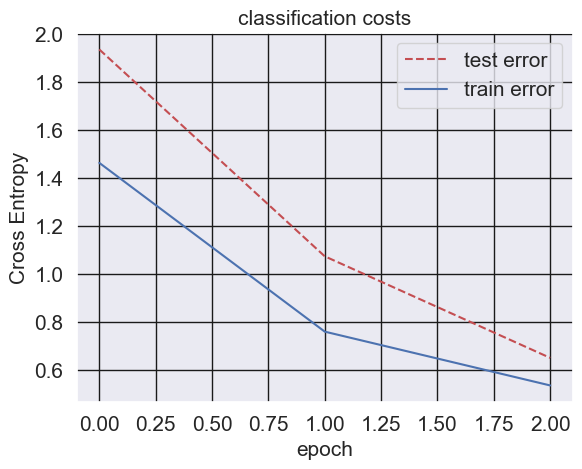

<Figure size 640x480 with 0 Axes>

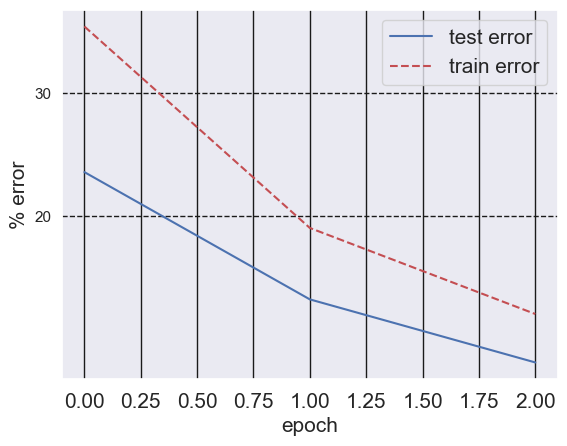

<Figure size 640x480 with 0 Axes>

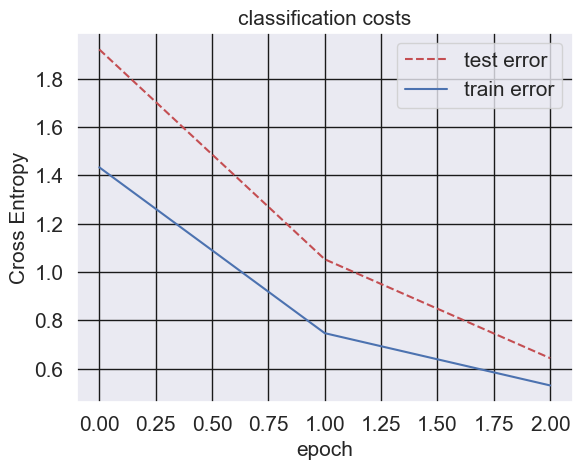

<Figure size 640x480 with 0 Axes>

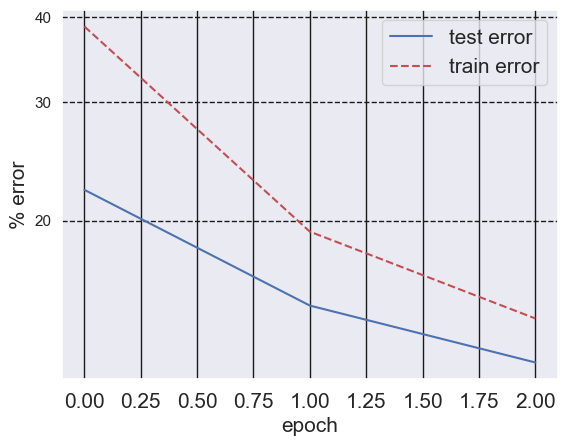

<Figure size 640x480 with 0 Axes>

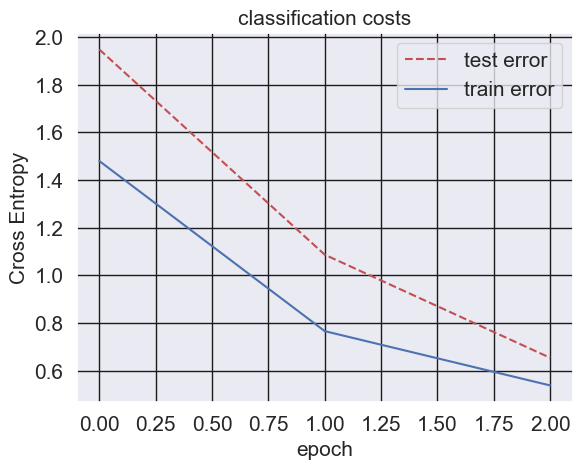

<Figure size 640x480 with 0 Axes>

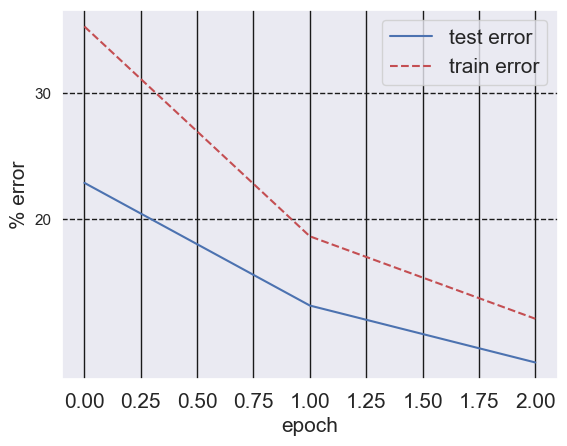

<Figure size 640x480 with 0 Axes>

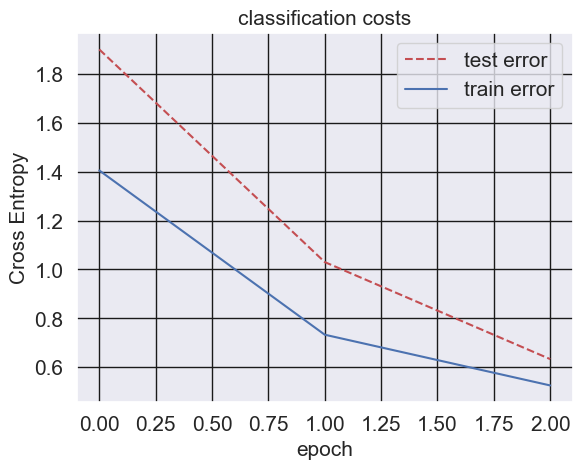

<Figure size 640x480 with 0 Axes>

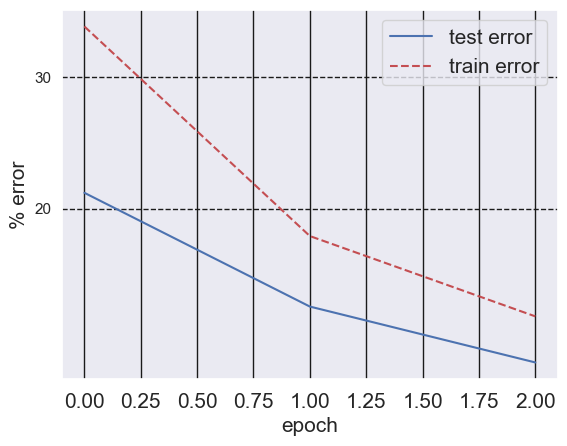

<Figure size 640x480 with 0 Axes>

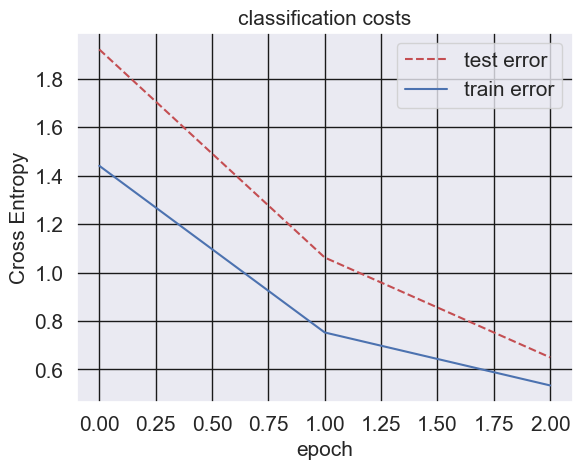

<Figure size 640x480 with 0 Axes>

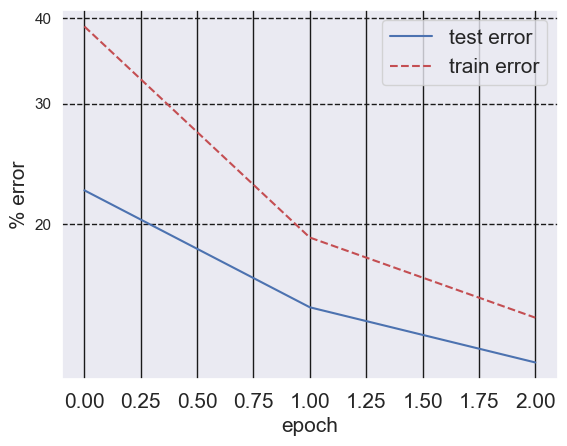

<Figure size 640x480 with 0 Axes>

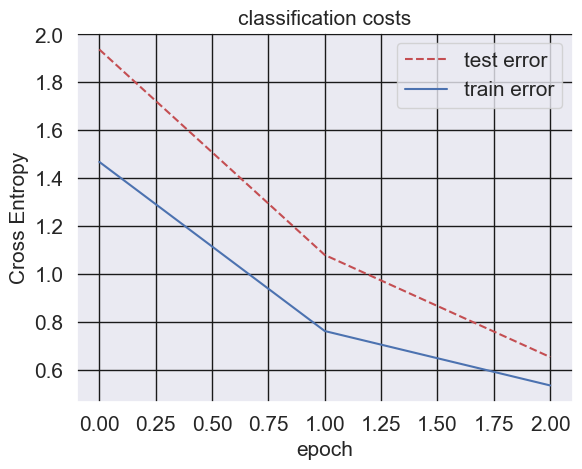

<Figure size 640x480 with 0 Axes>

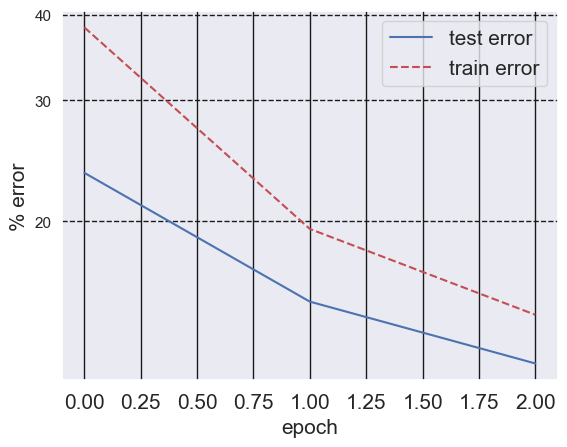

<Figure size 640x480 with 0 Axes>

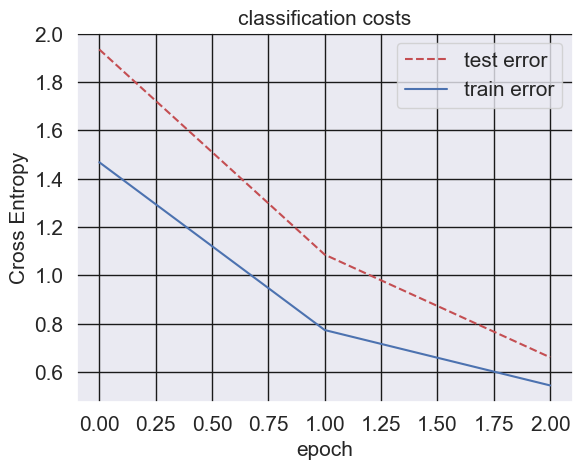

<Figure size 640x480 with 0 Axes>

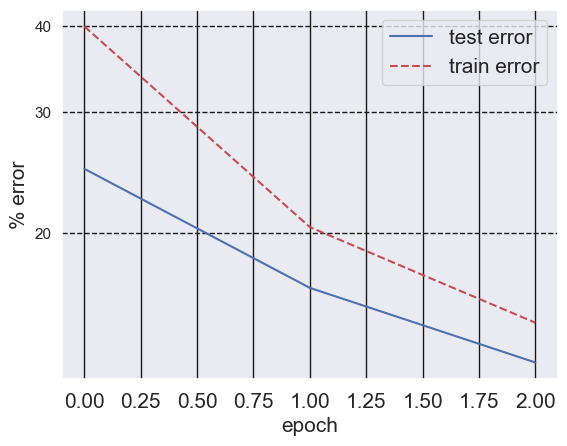

<Figure size 640x480 with 0 Axes>

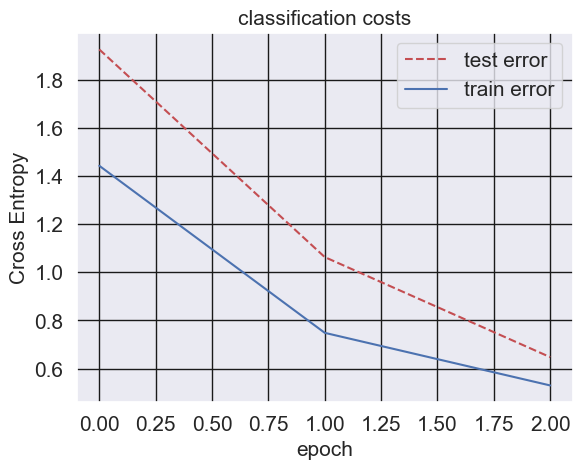

<Figure size 640x480 with 0 Axes>

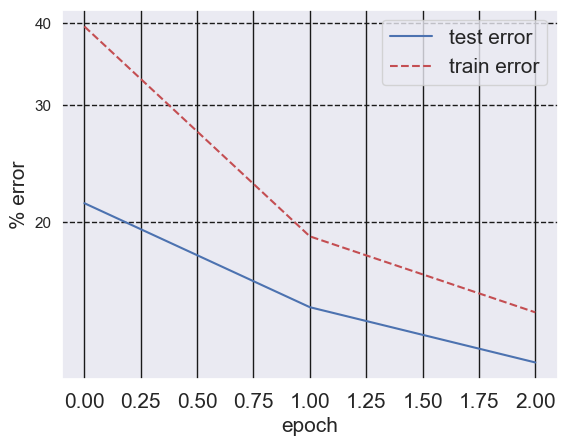

<Figure size 640x480 with 0 Axes>

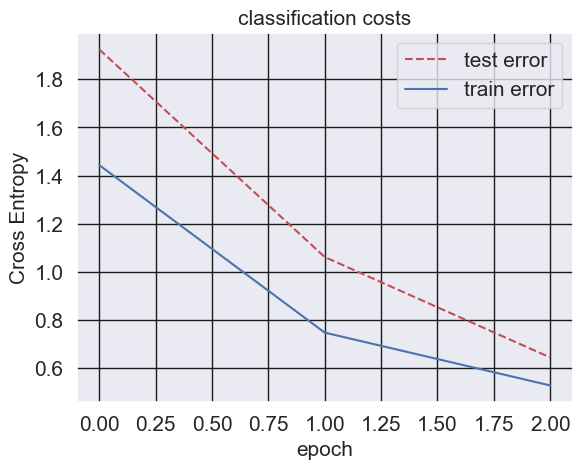

<Figure size 640x480 with 0 Axes>

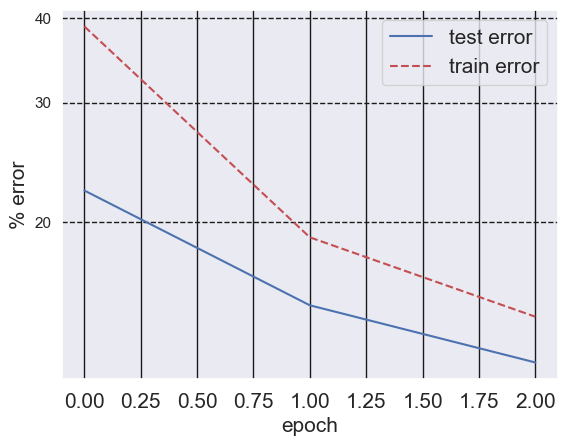

<Figure size 640x480 with 0 Axes>

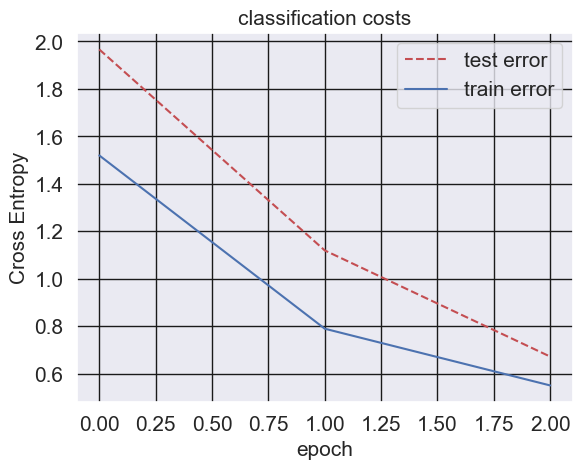

<Figure size 640x480 with 0 Axes>

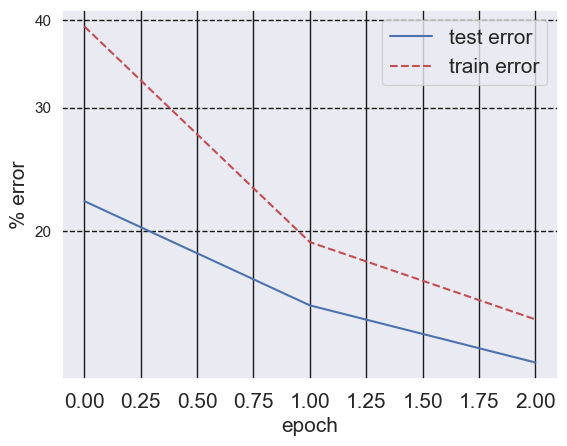

<Figure size 640x480 with 0 Axes>

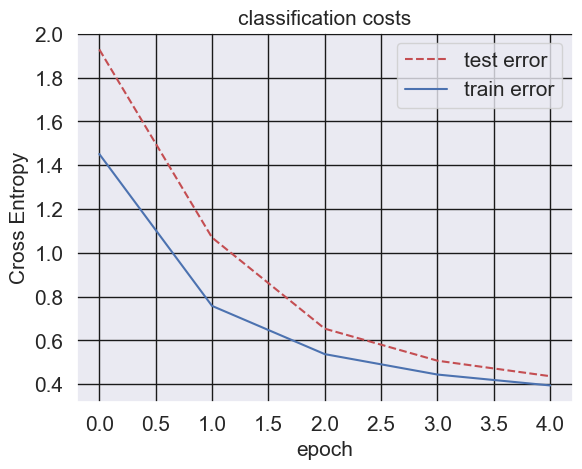

<Figure size 640x480 with 0 Axes>

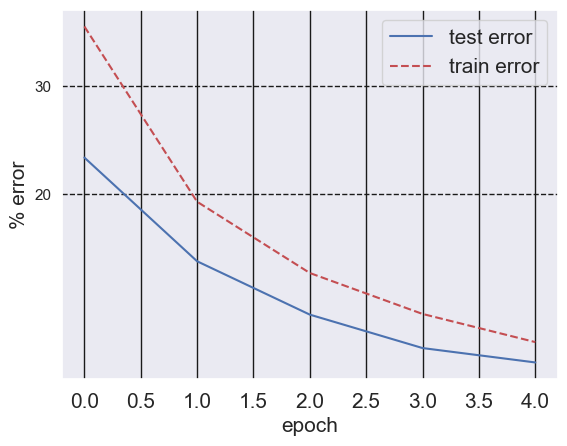

<Figure size 640x480 with 0 Axes>

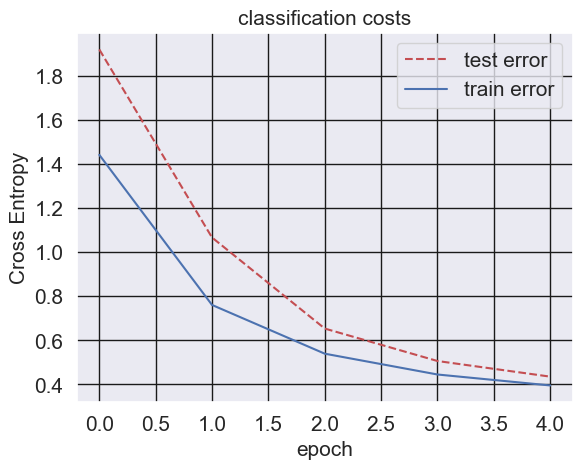

<Figure size 640x480 with 0 Axes>

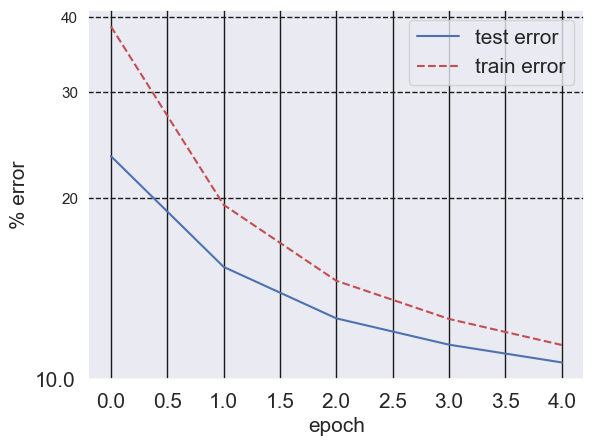

<Figure size 640x480 with 0 Axes>

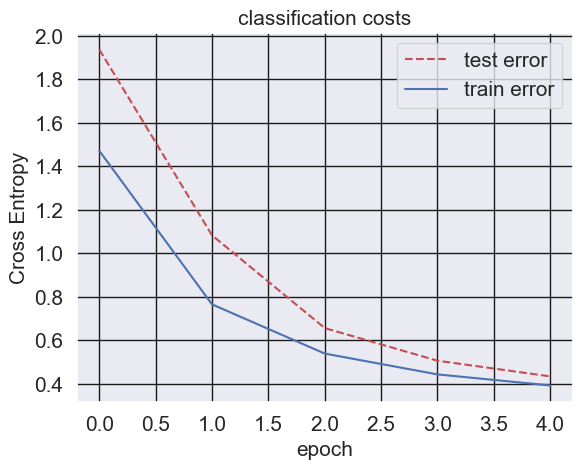

<Figure size 640x480 with 0 Axes>

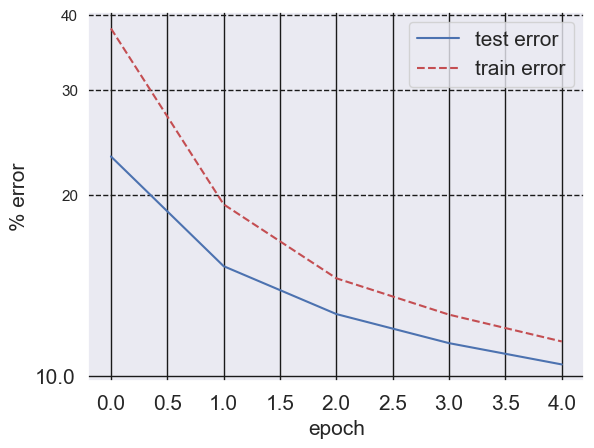

<Figure size 640x480 with 0 Axes>

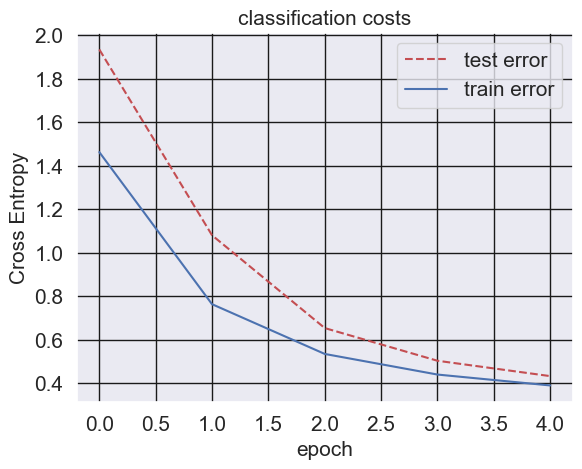

<Figure size 640x480 with 0 Axes>

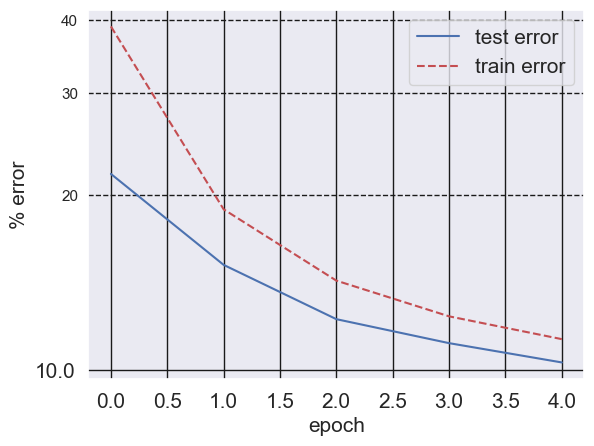

<Figure size 640x480 with 0 Axes>

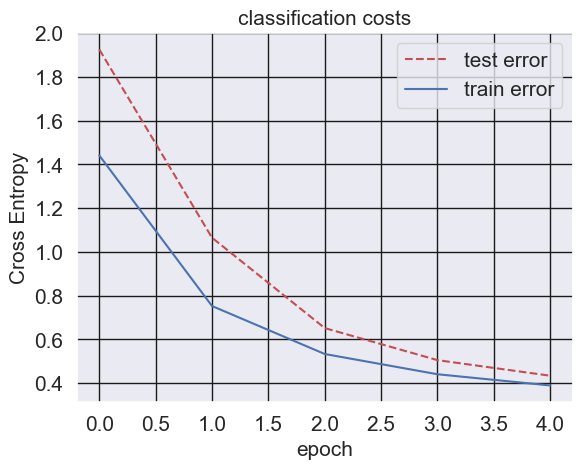

<Figure size 640x480 with 0 Axes>

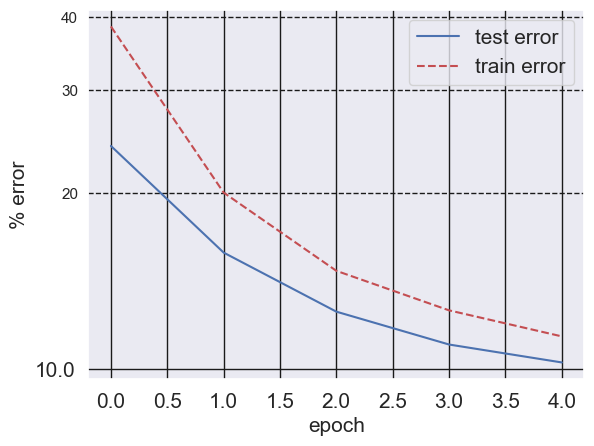

<Figure size 640x480 with 0 Axes>

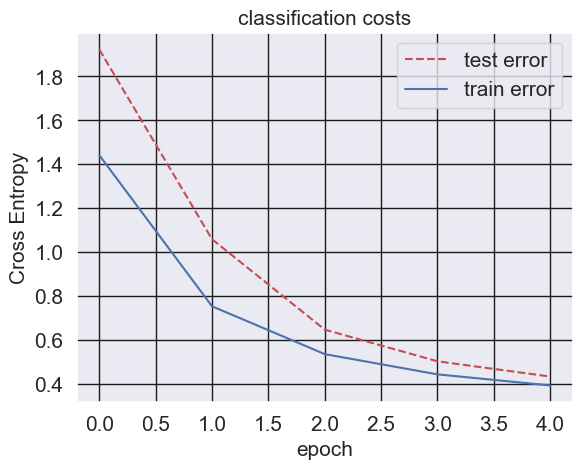

<Figure size 640x480 with 0 Axes>

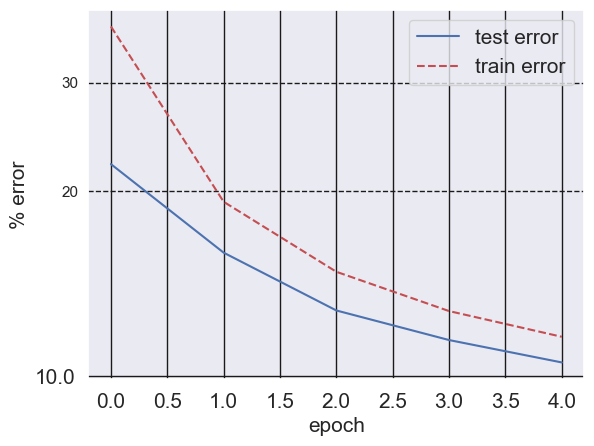

<Figure size 640x480 with 0 Axes>

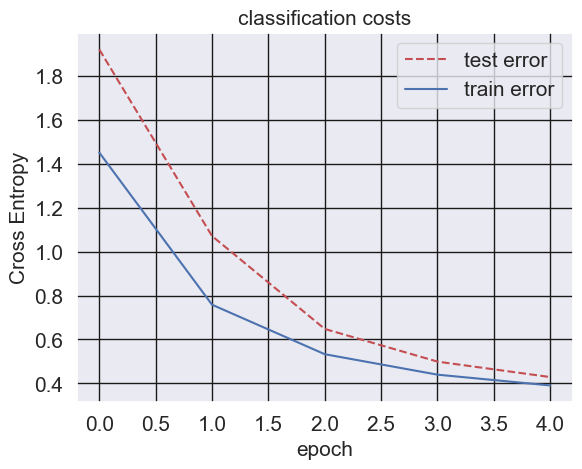

<Figure size 640x480 with 0 Axes>

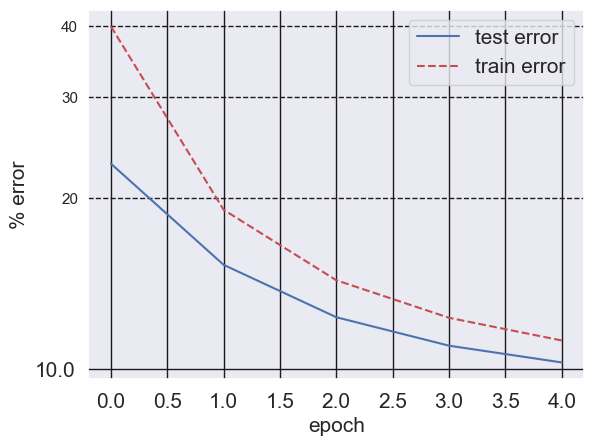

<Figure size 640x480 with 0 Axes>

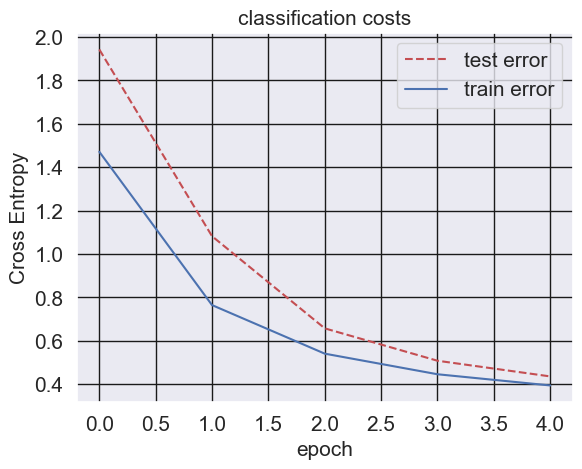

<Figure size 640x480 with 0 Axes>

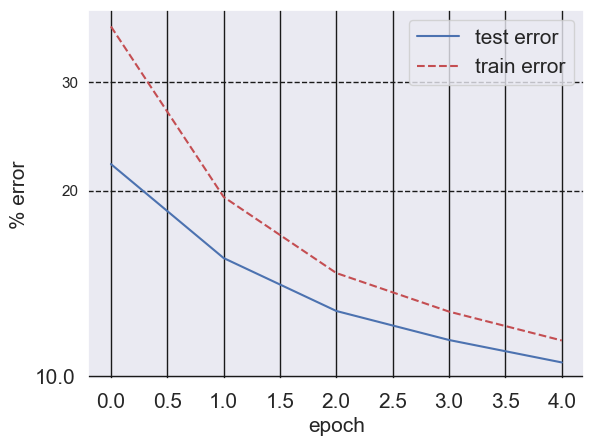

<Figure size 640x480 with 0 Axes>

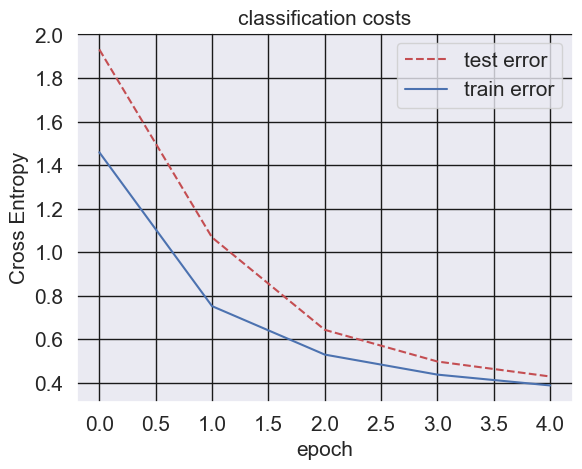

<Figure size 640x480 with 0 Axes>

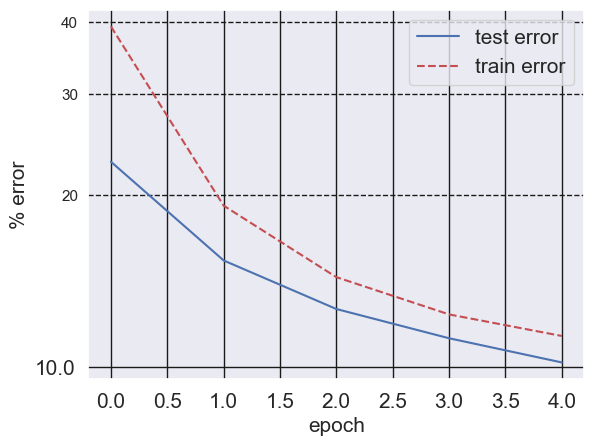

<Figure size 640x480 with 0 Axes>

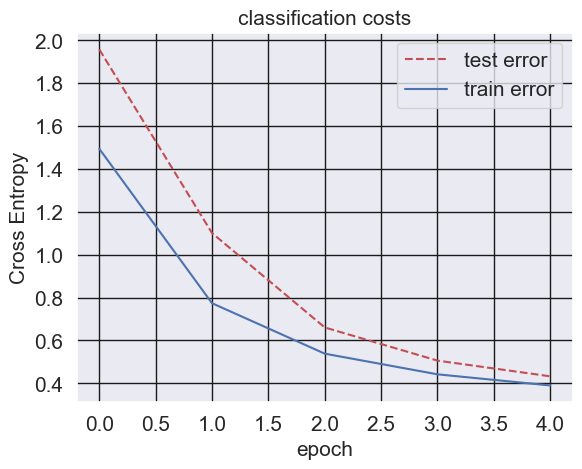

<Figure size 640x480 with 0 Axes>

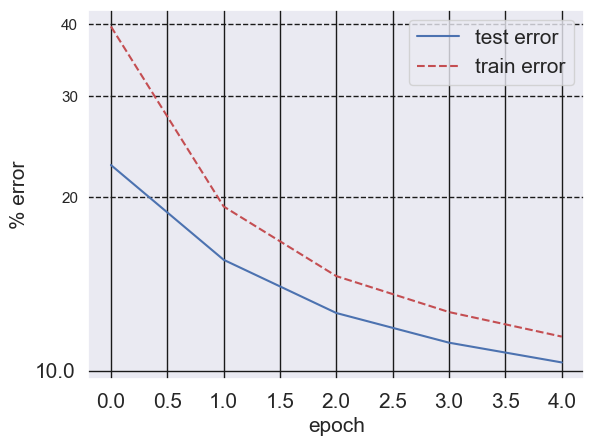

<Figure size 640x480 with 0 Axes>

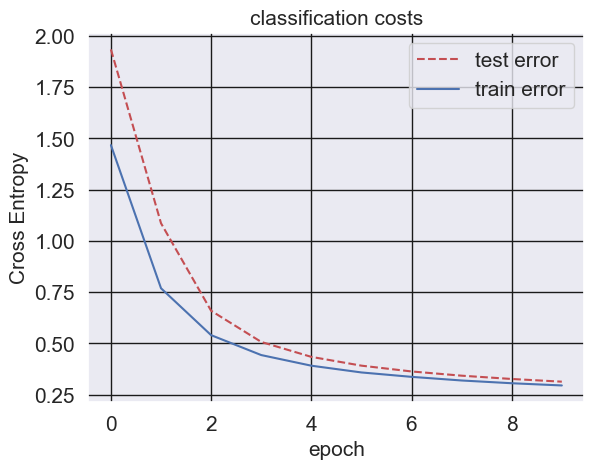

<Figure size 640x480 with 0 Axes>

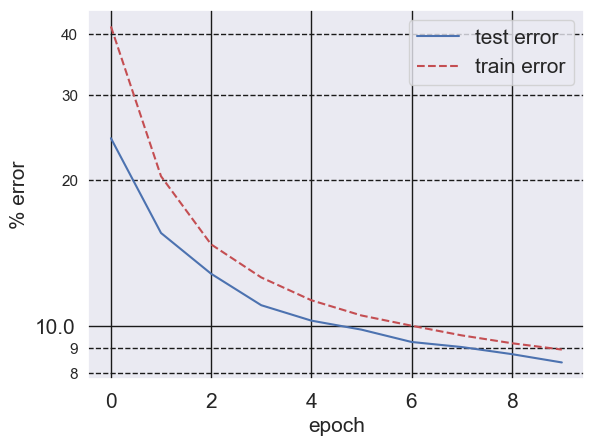

<Figure size 640x480 with 0 Axes>

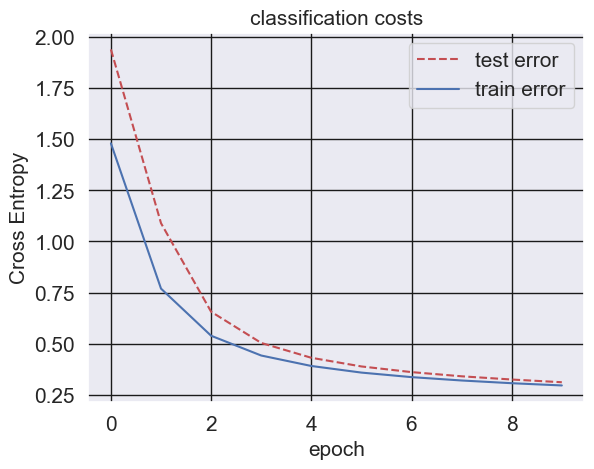

<Figure size 640x480 with 0 Axes>

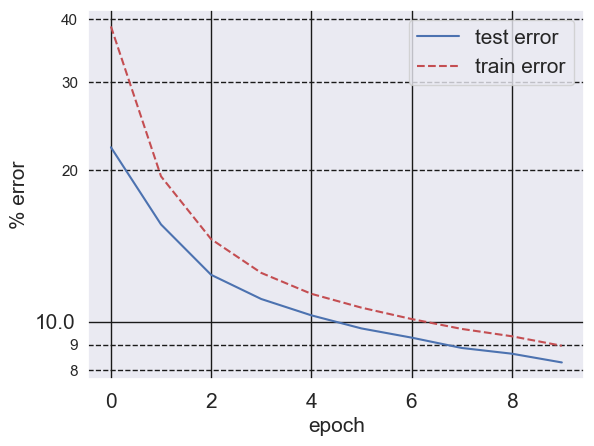

<Figure size 640x480 with 0 Axes>

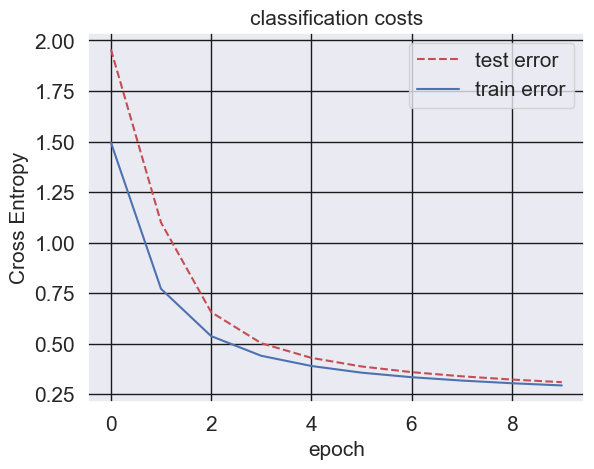

<Figure size 640x480 with 0 Axes>

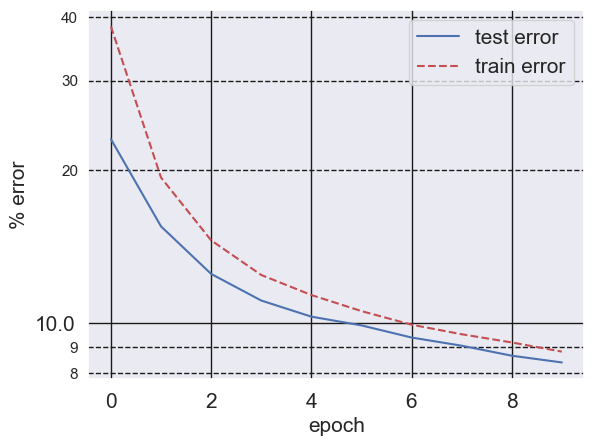

<Figure size 640x480 with 0 Axes>

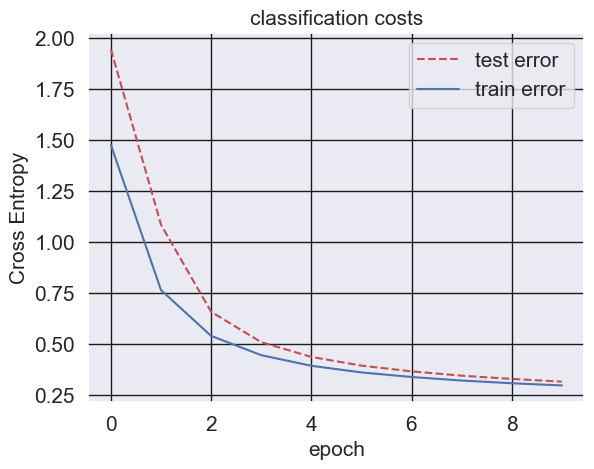

<Figure size 640x480 with 0 Axes>

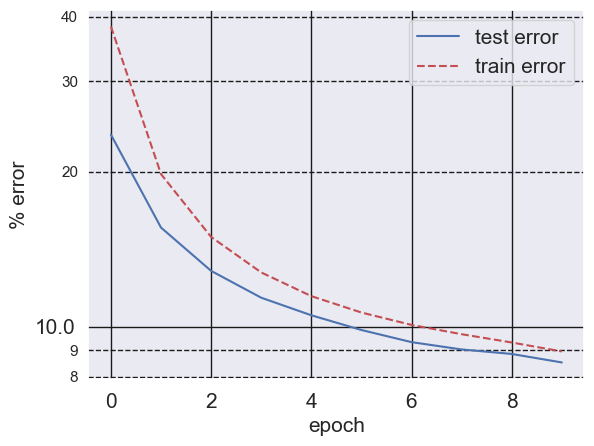

<Figure size 640x480 with 0 Axes>

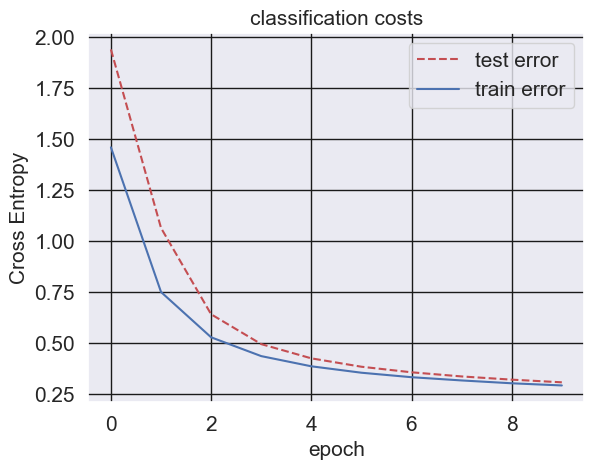

<Figure size 640x480 with 0 Axes>

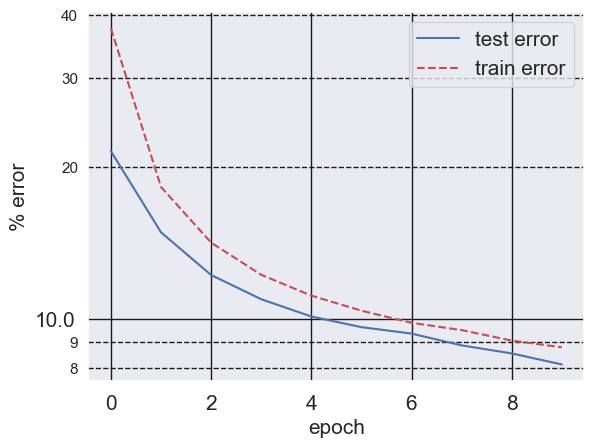

<Figure size 640x480 with 0 Axes>

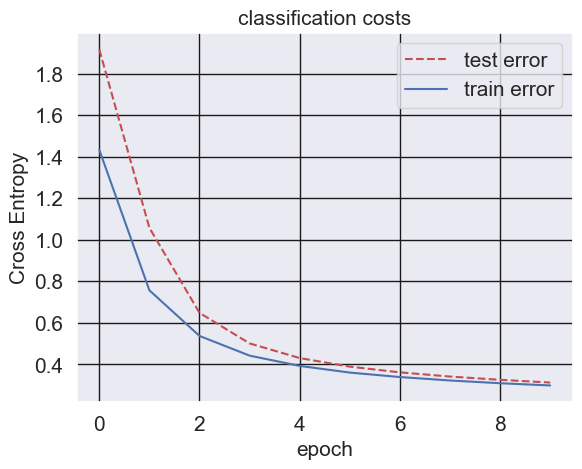

<Figure size 640x480 with 0 Axes>

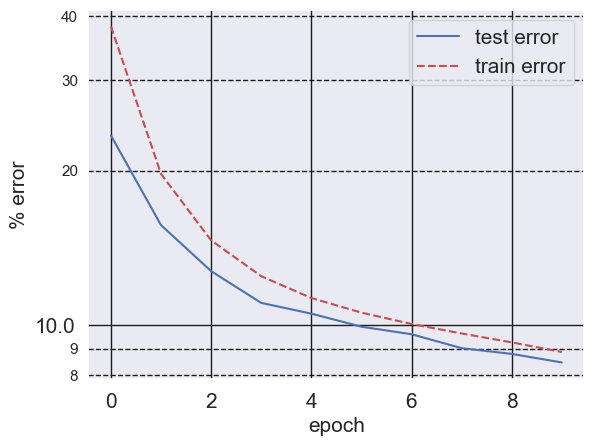

<Figure size 640x480 with 0 Axes>

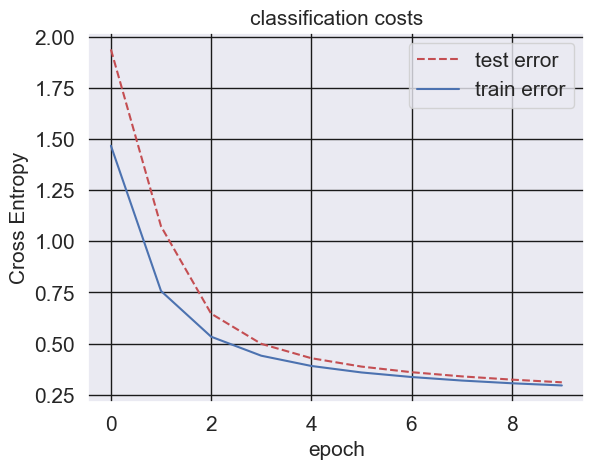

<Figure size 640x480 with 0 Axes>

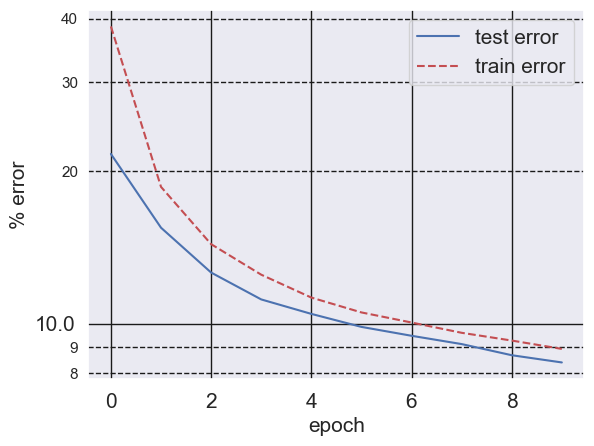

<Figure size 640x480 with 0 Axes>

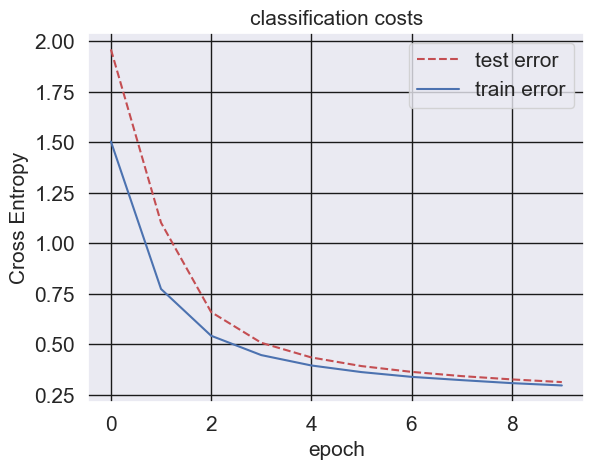

<Figure size 640x480 with 0 Axes>

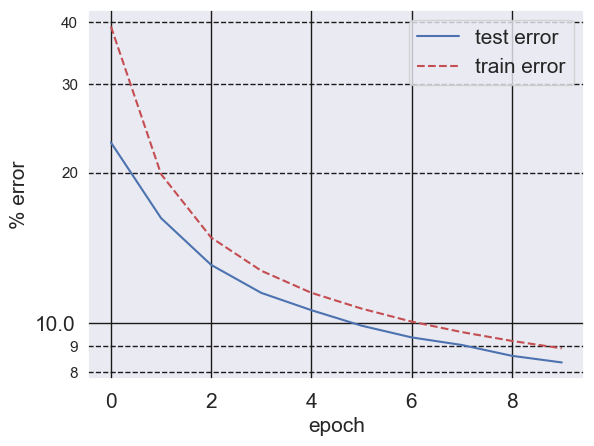

<Figure size 640x480 with 0 Axes>

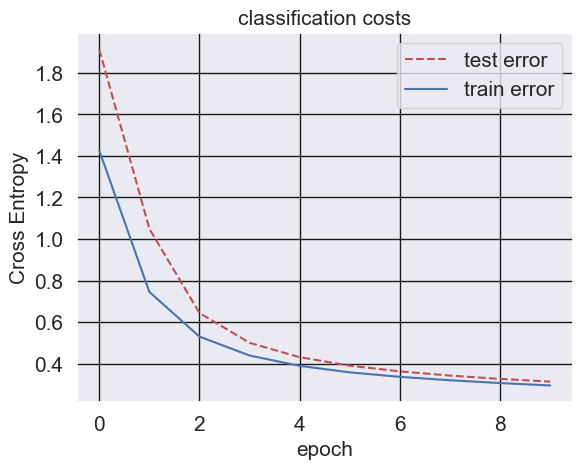

<Figure size 640x480 with 0 Axes>

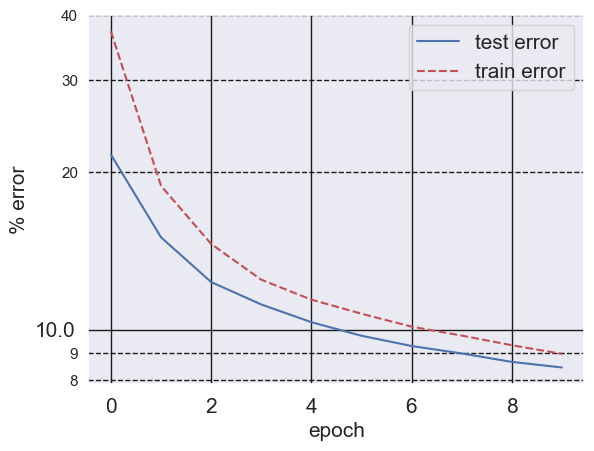

<Figure size 640x480 with 0 Axes>

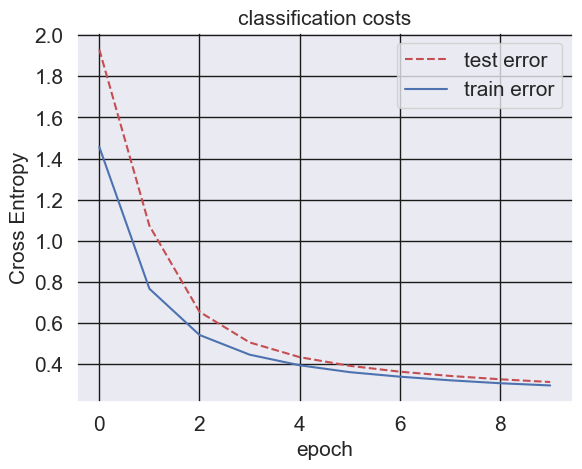

<Figure size 640x480 with 0 Axes>

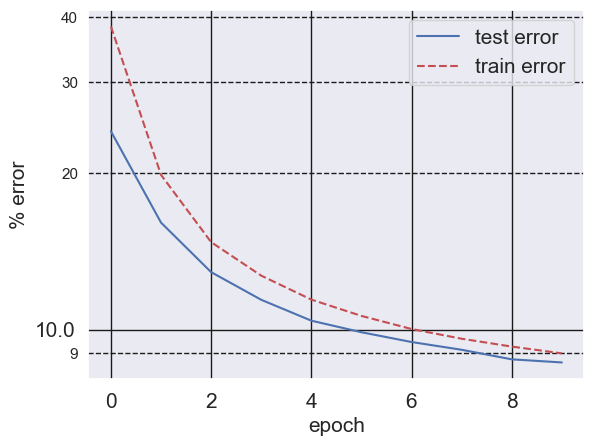

<Figure size 640x480 with 0 Axes>

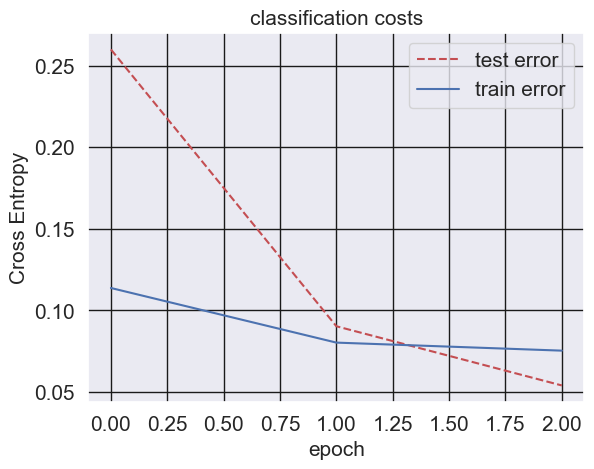

<Figure size 640x480 with 0 Axes>

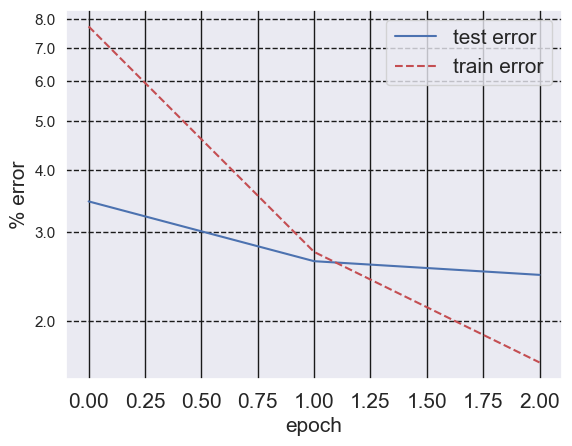

<Figure size 640x480 with 0 Axes>

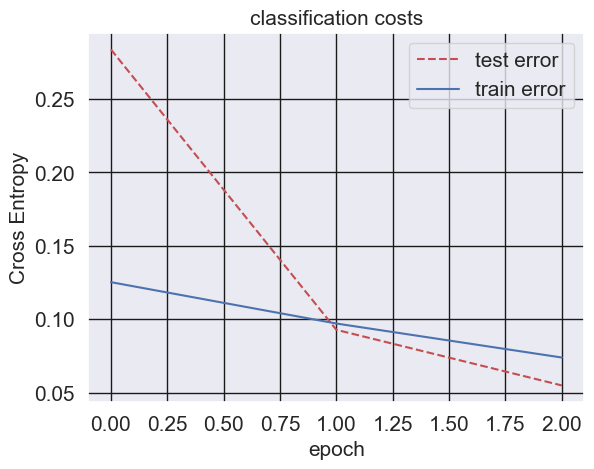

<Figure size 640x480 with 0 Axes>

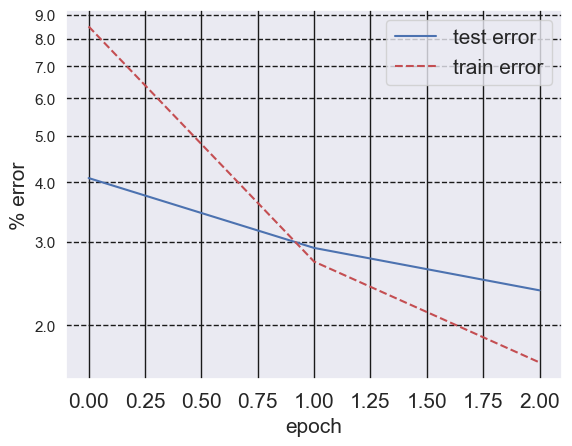

<Figure size 640x480 with 0 Axes>

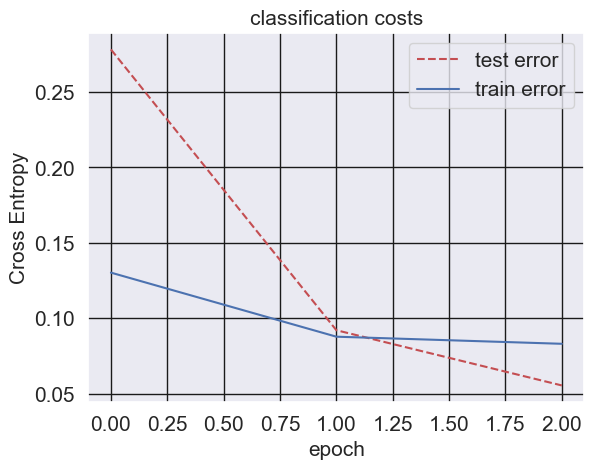

<Figure size 640x480 with 0 Axes>

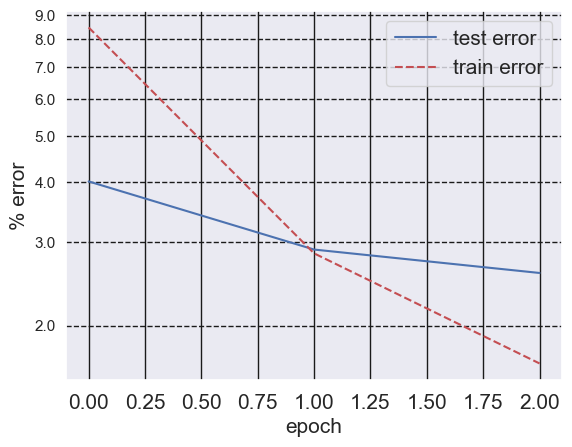

<Figure size 640x480 with 0 Axes>

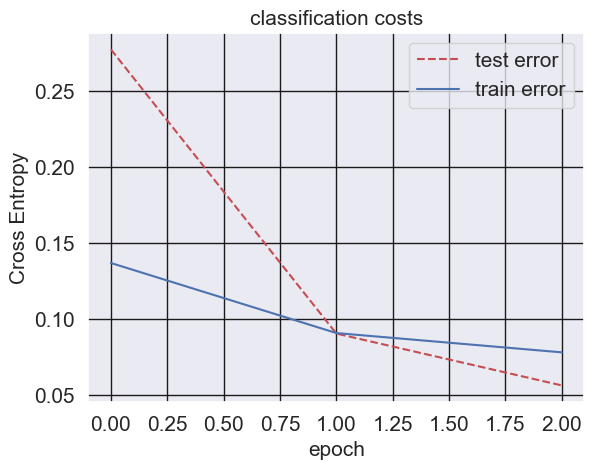

<Figure size 640x480 with 0 Axes>

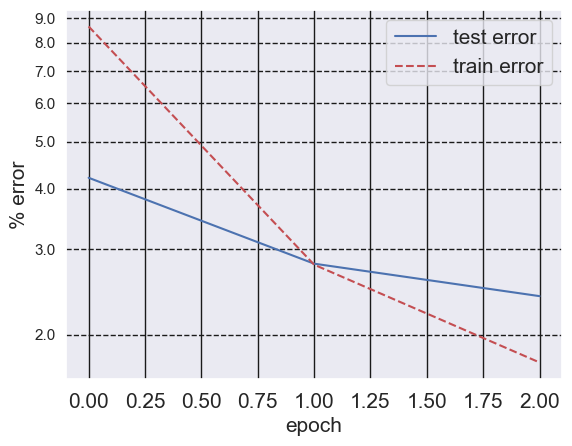

<Figure size 640x480 with 0 Axes>

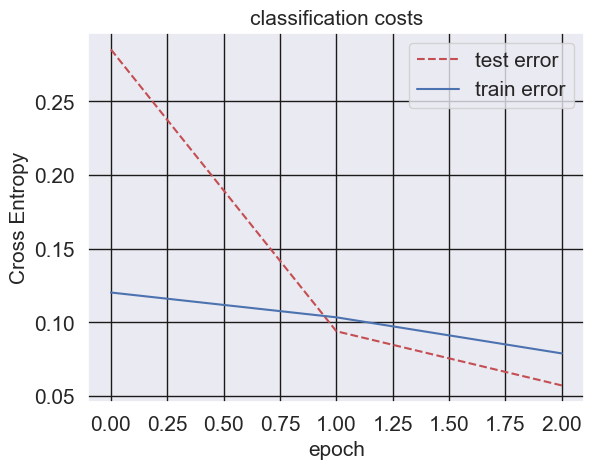

<Figure size 640x480 with 0 Axes>

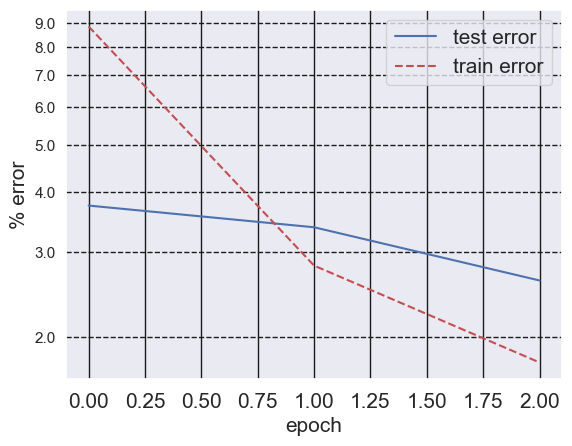

<Figure size 640x480 with 0 Axes>

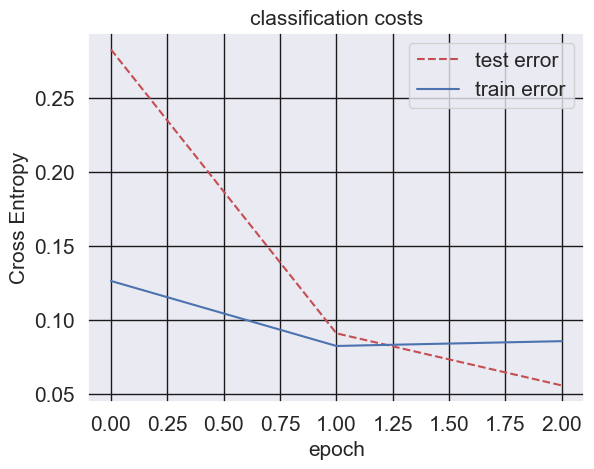

<Figure size 640x480 with 0 Axes>

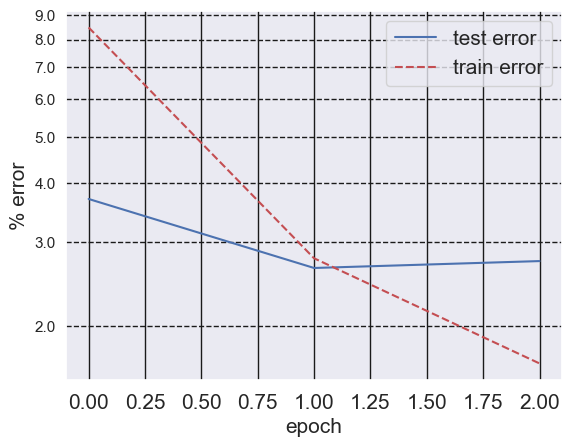

<Figure size 640x480 with 0 Axes>

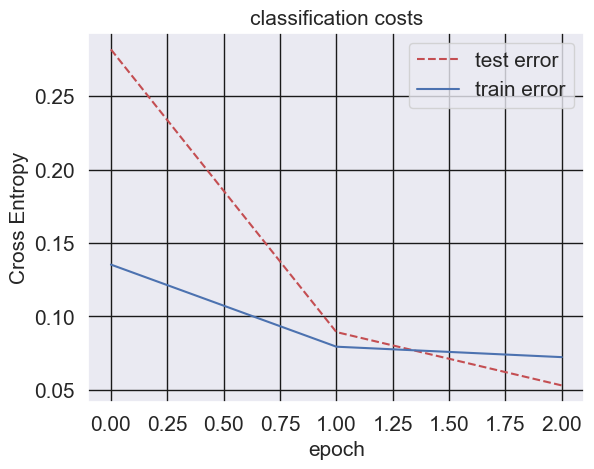

<Figure size 640x480 with 0 Axes>

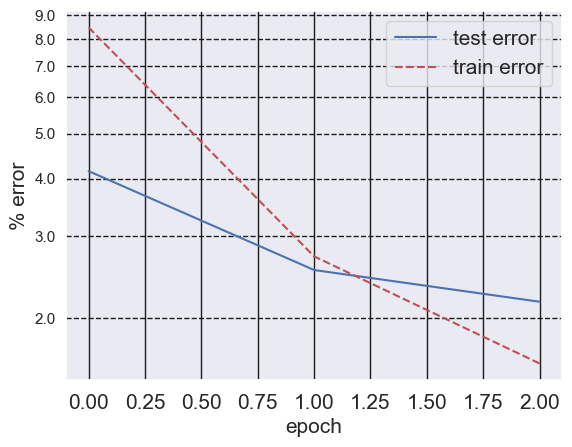

<Figure size 640x480 with 0 Axes>

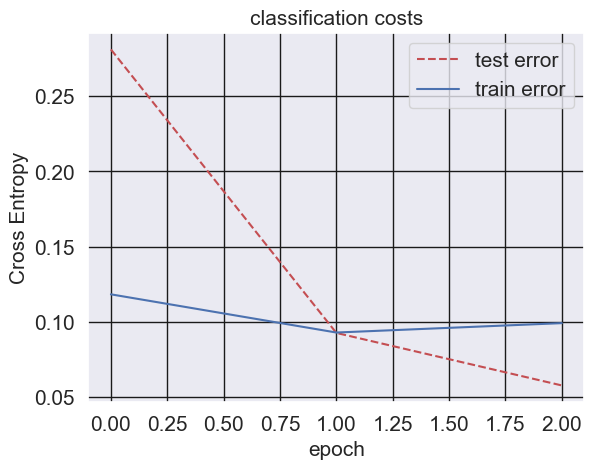

<Figure size 640x480 with 0 Axes>

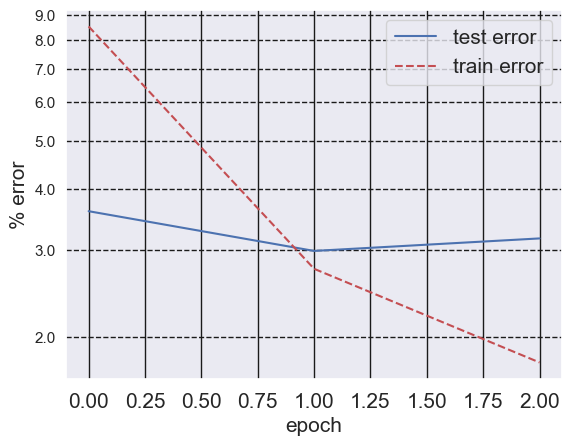

<Figure size 640x480 with 0 Axes>

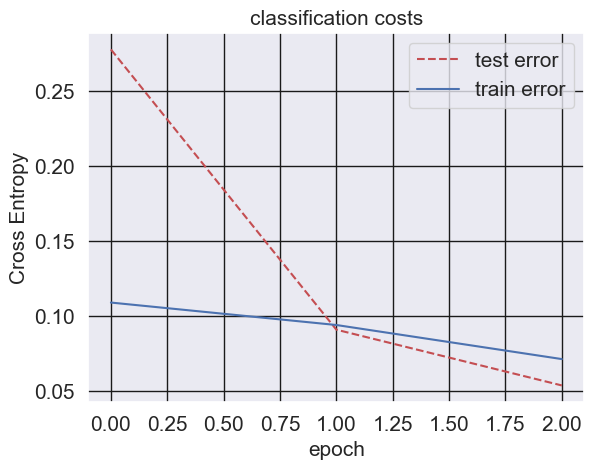

<Figure size 640x480 with 0 Axes>

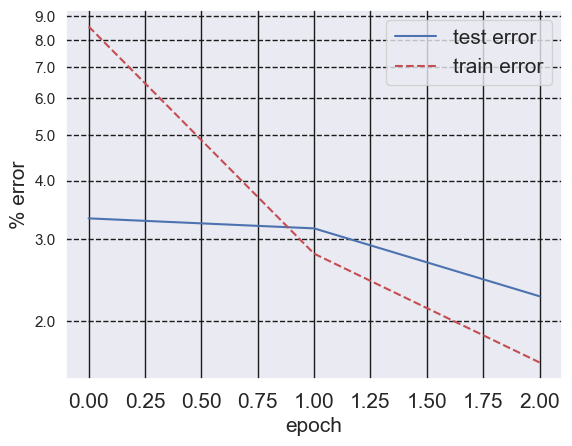

<Figure size 640x480 with 0 Axes>

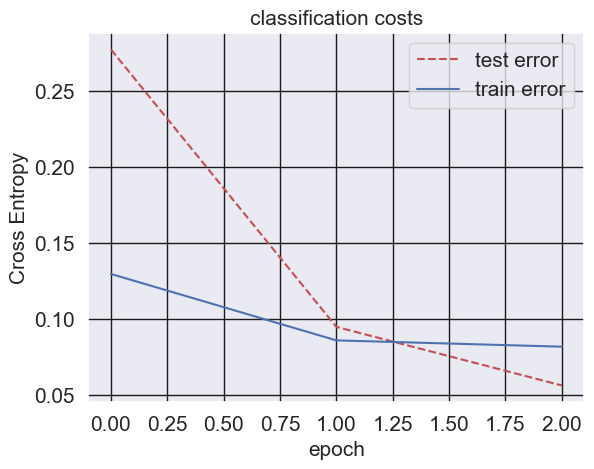

<Figure size 640x480 with 0 Axes>

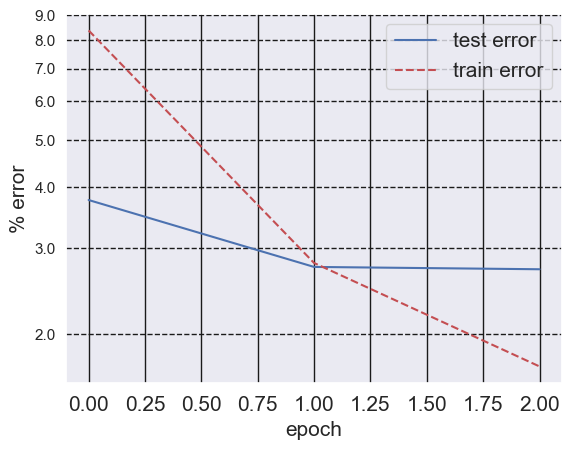

<Figure size 640x480 with 0 Axes>

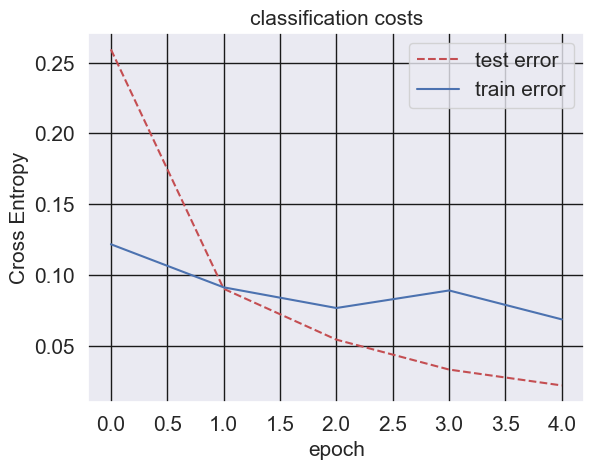

<Figure size 640x480 with 0 Axes>

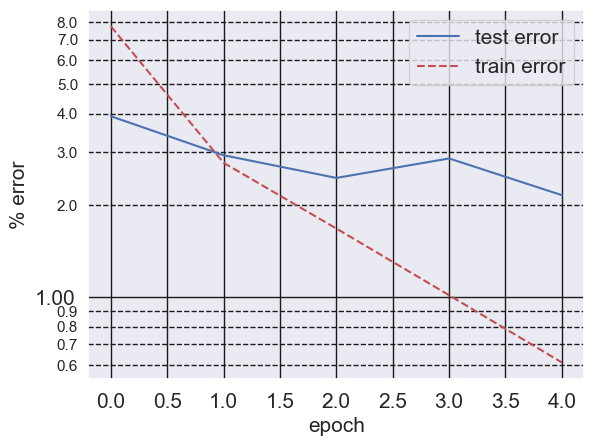

<Figure size 640x480 with 0 Axes>

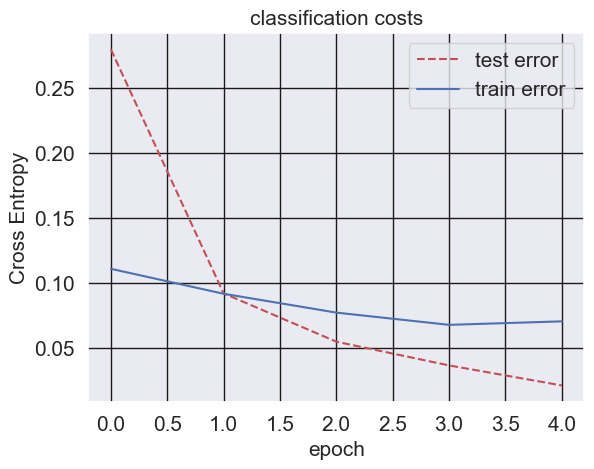

<Figure size 640x480 with 0 Axes>

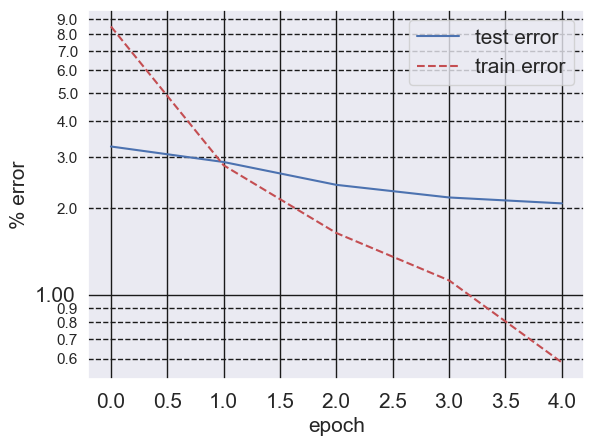

<Figure size 640x480 with 0 Axes>

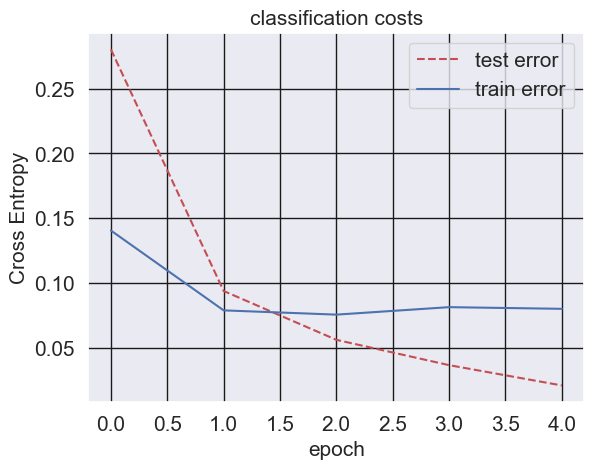

<Figure size 640x480 with 0 Axes>

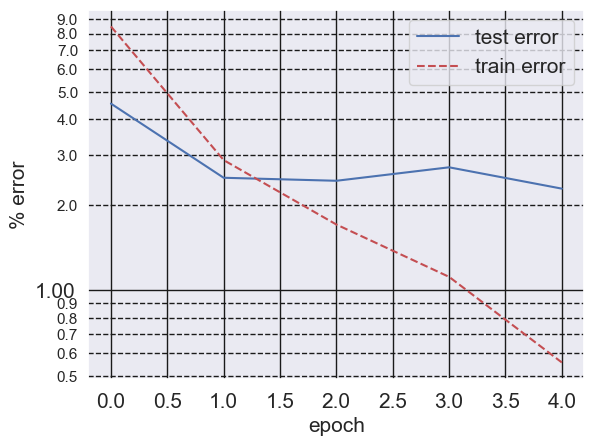

<Figure size 640x480 with 0 Axes>

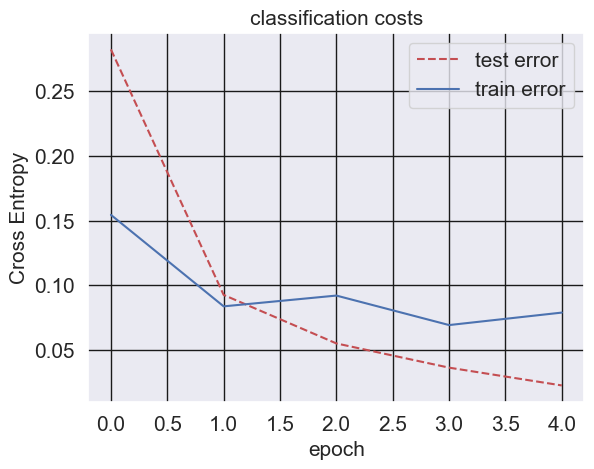

<Figure size 640x480 with 0 Axes>

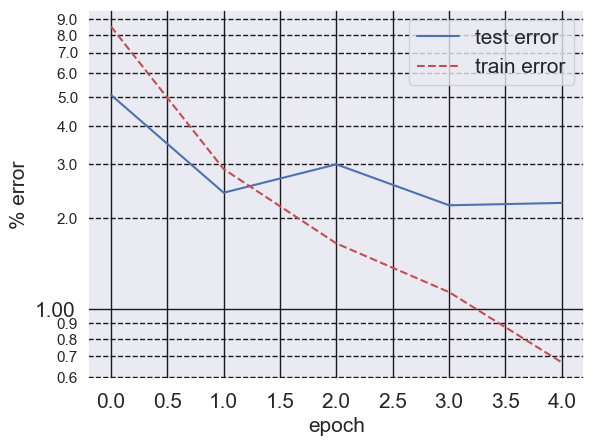

<Figure size 640x480 with 0 Axes>

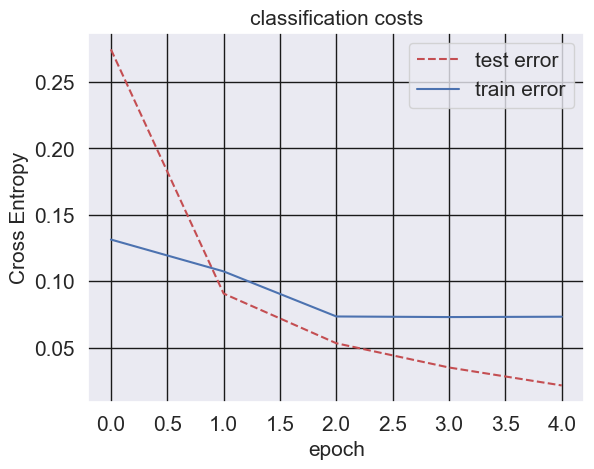

<Figure size 640x480 with 0 Axes>

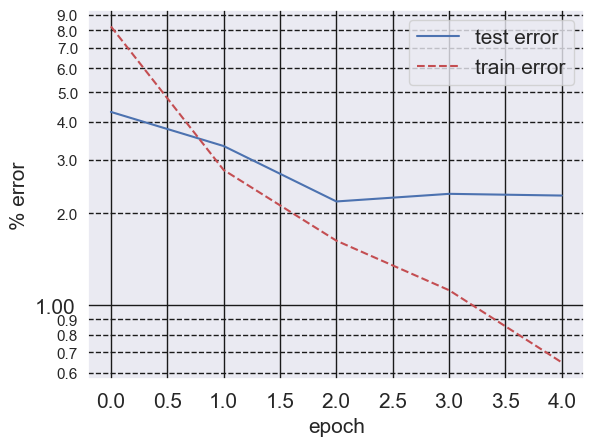

<Figure size 640x480 with 0 Axes>

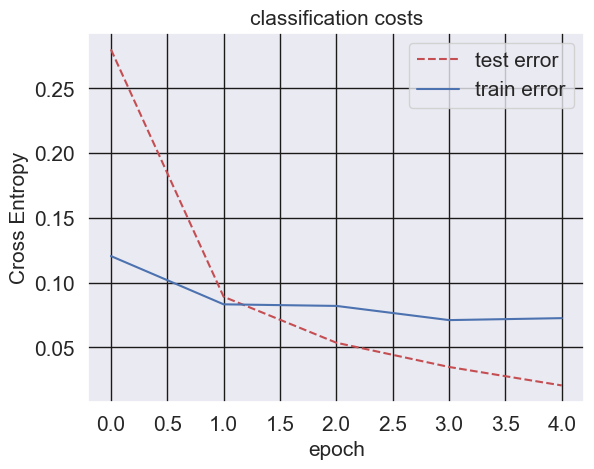

<Figure size 640x480 with 0 Axes>

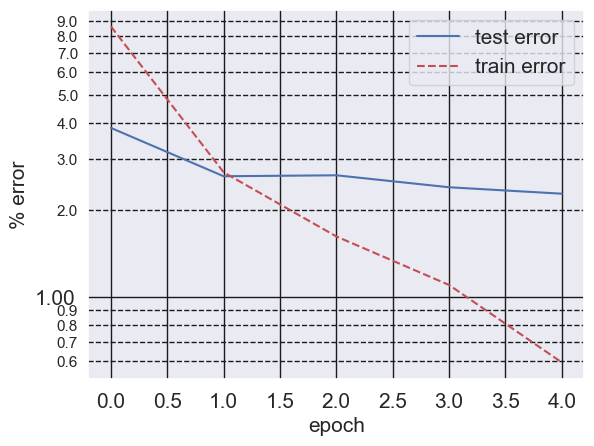

<Figure size 640x480 with 0 Axes>

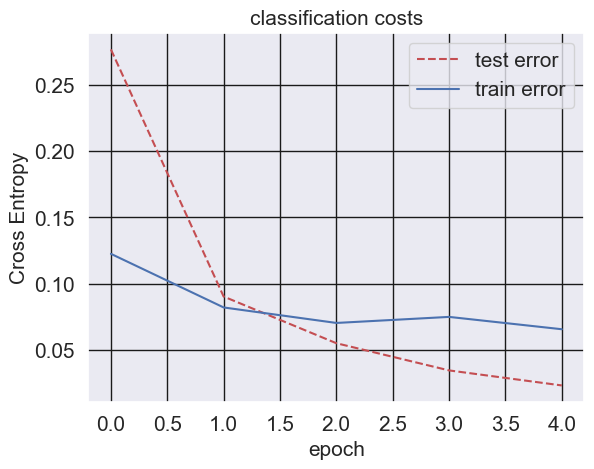

<Figure size 640x480 with 0 Axes>

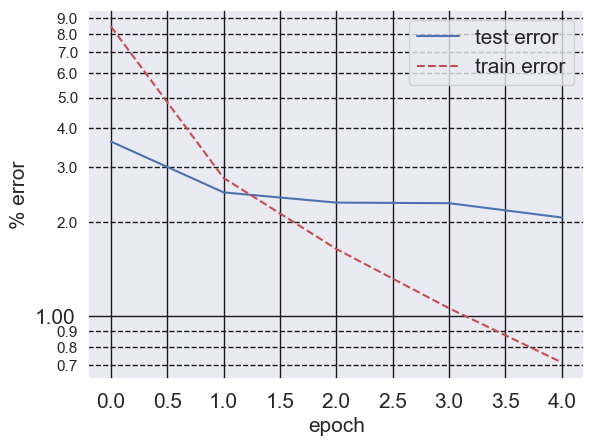

<Figure size 640x480 with 0 Axes>

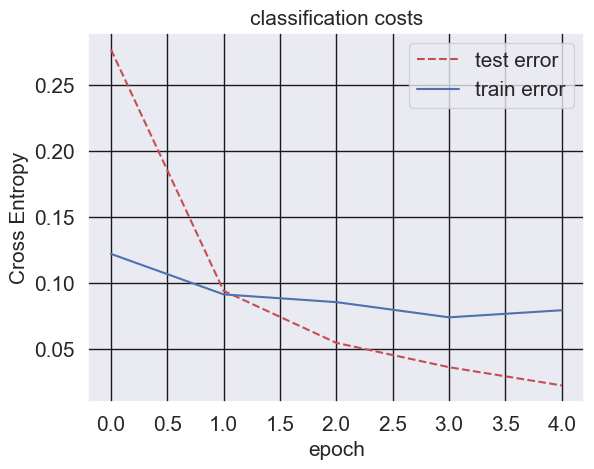

<Figure size 640x480 with 0 Axes>

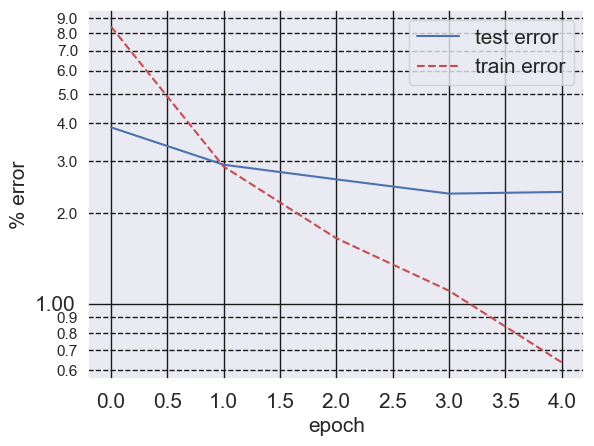

<Figure size 640x480 with 0 Axes>

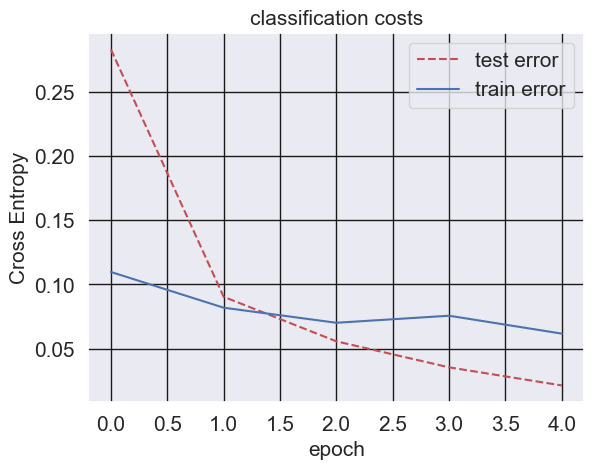

<Figure size 640x480 with 0 Axes>

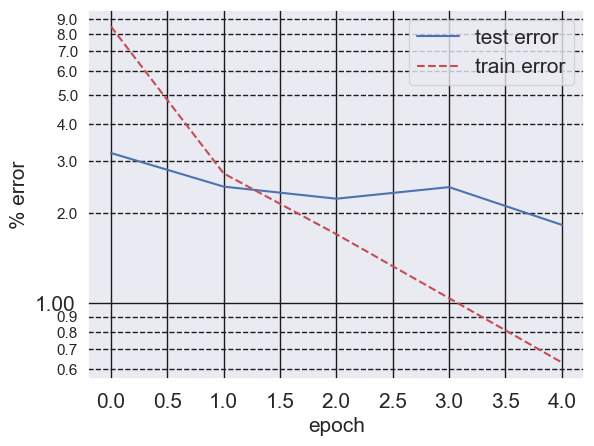

<Figure size 640x480 with 0 Axes>

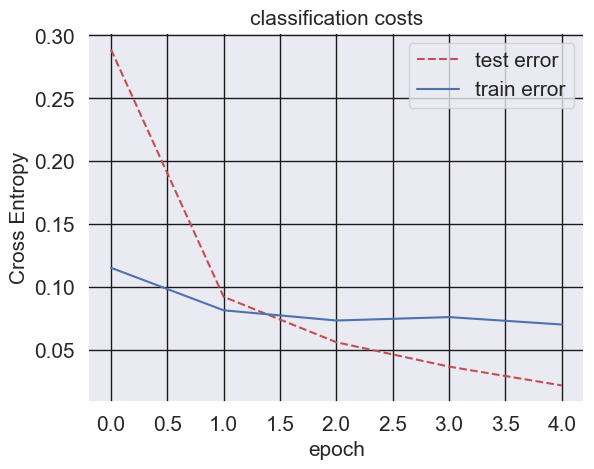

<Figure size 640x480 with 0 Axes>

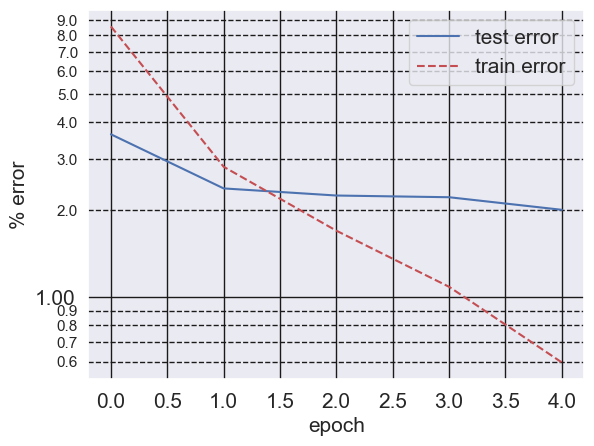

<Figure size 640x480 with 0 Axes>

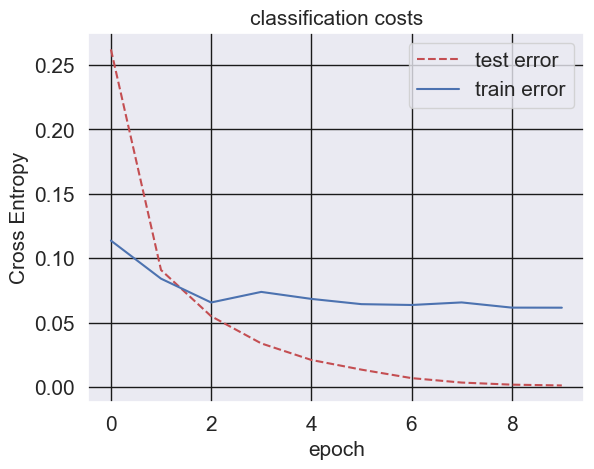

<Figure size 640x480 with 0 Axes>

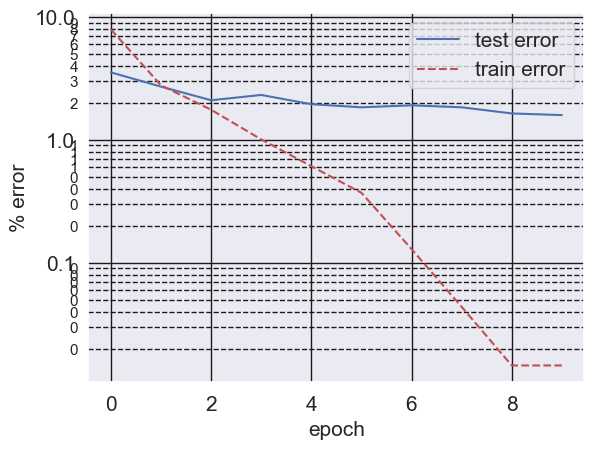

<Figure size 640x480 with 0 Axes>

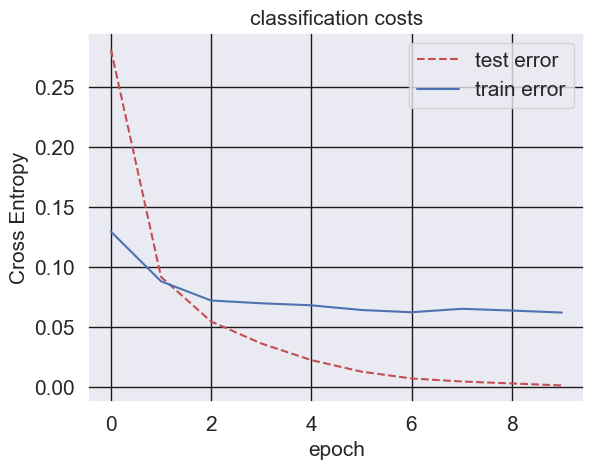

<Figure size 640x480 with 0 Axes>

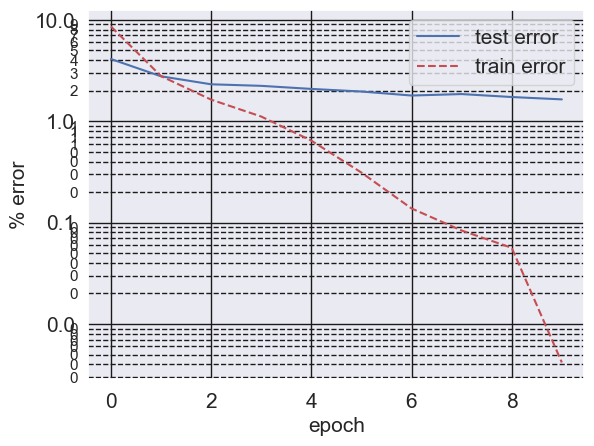

<Figure size 640x480 with 0 Axes>

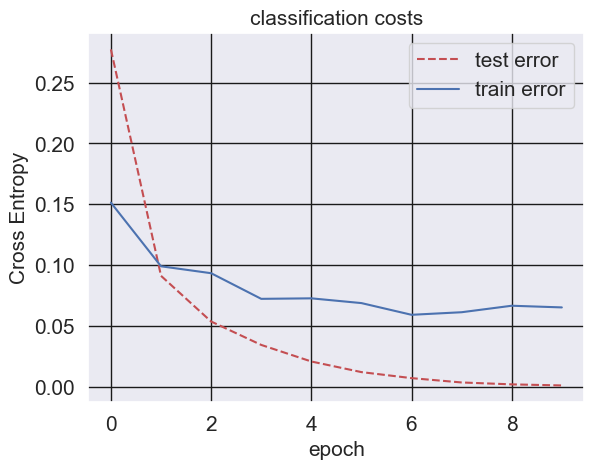

<Figure size 640x480 with 0 Axes>

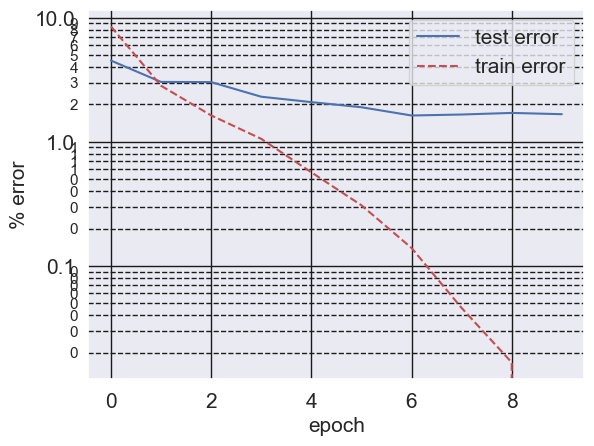

<Figure size 640x480 with 0 Axes>

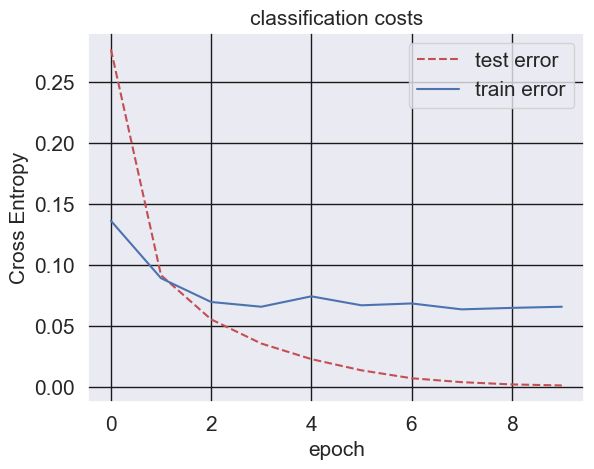

<Figure size 640x480 with 0 Axes>

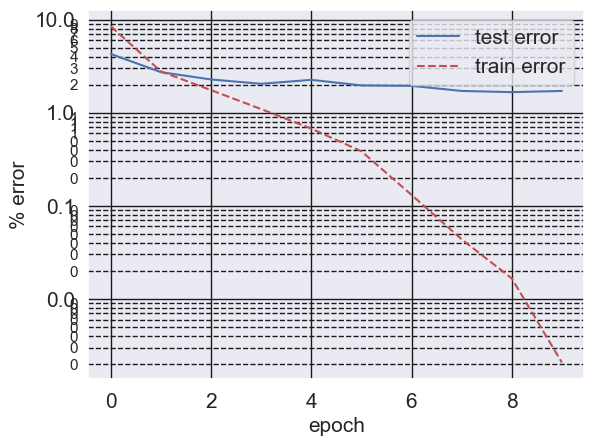

<Figure size 640x480 with 0 Axes>

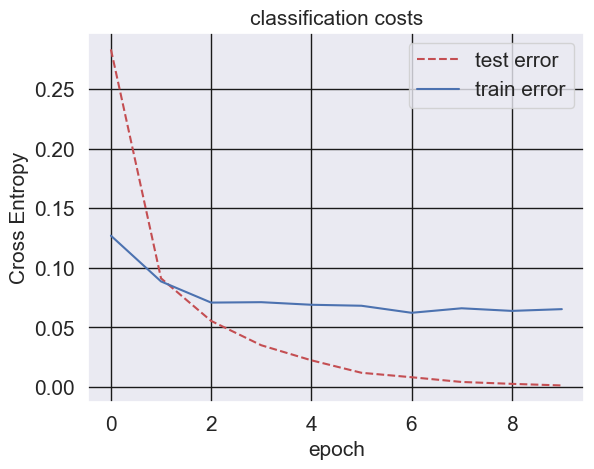

<Figure size 640x480 with 0 Axes>

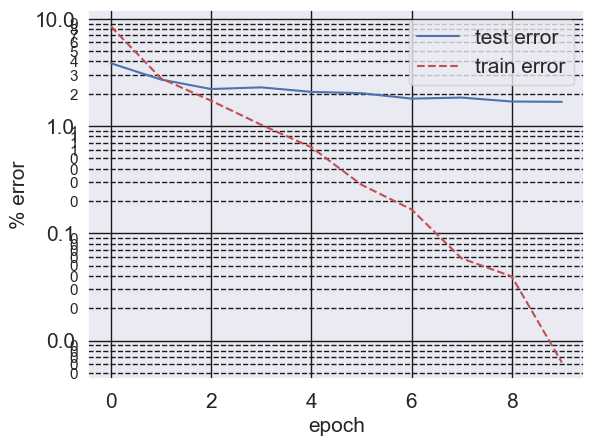

<Figure size 640x480 with 0 Axes>

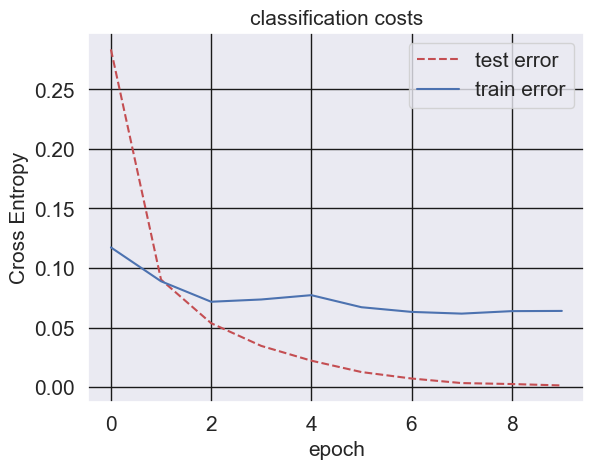

<Figure size 640x480 with 0 Axes>

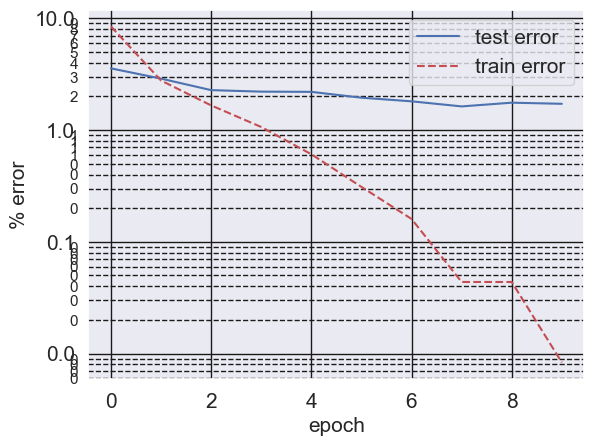

<Figure size 640x480 with 0 Axes>

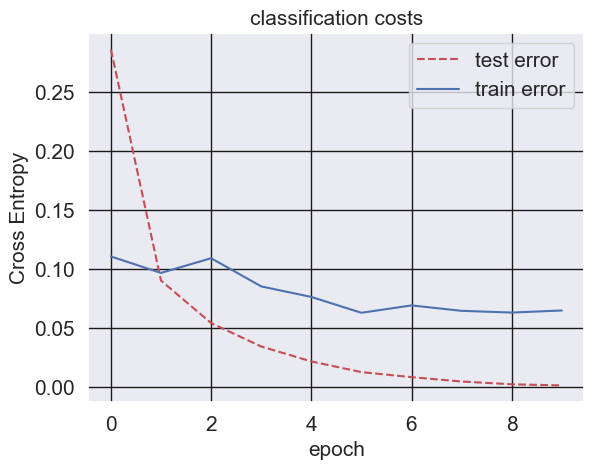

<Figure size 640x480 with 0 Axes>

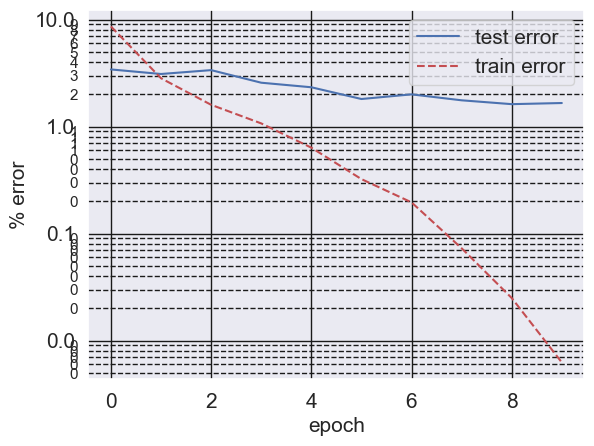

<Figure size 640x480 with 0 Axes>

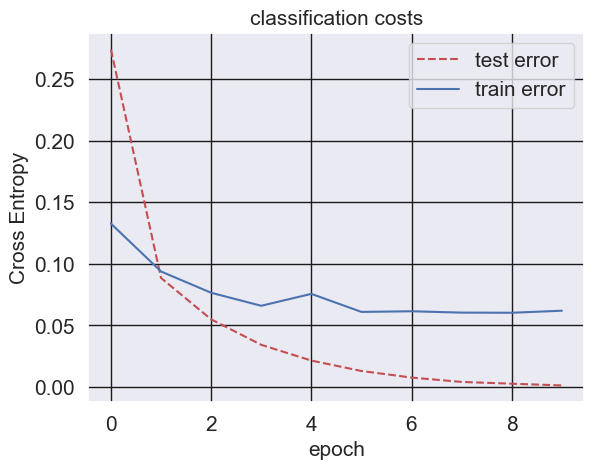

<Figure size 640x480 with 0 Axes>

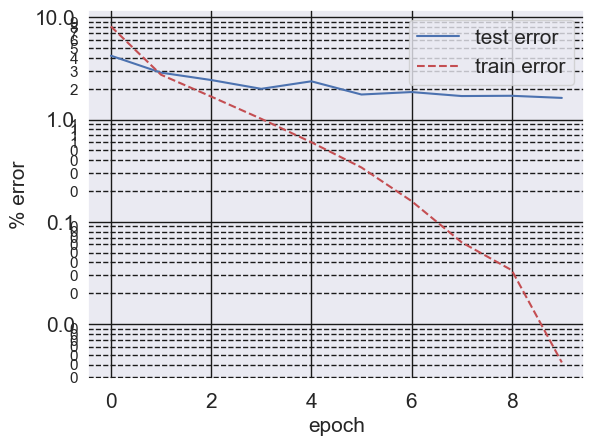

<Figure size 640x480 with 0 Axes>

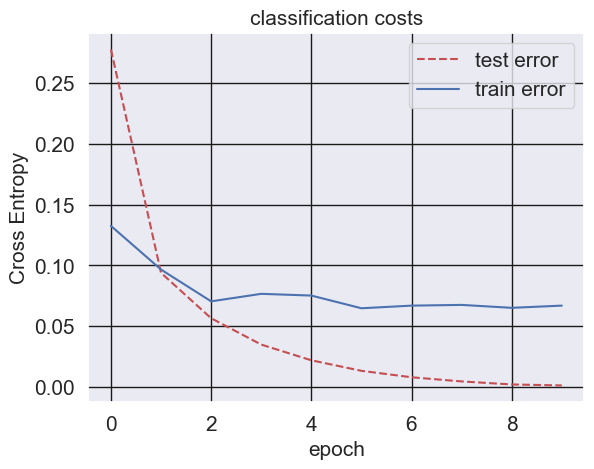

<Figure size 640x480 with 0 Axes>

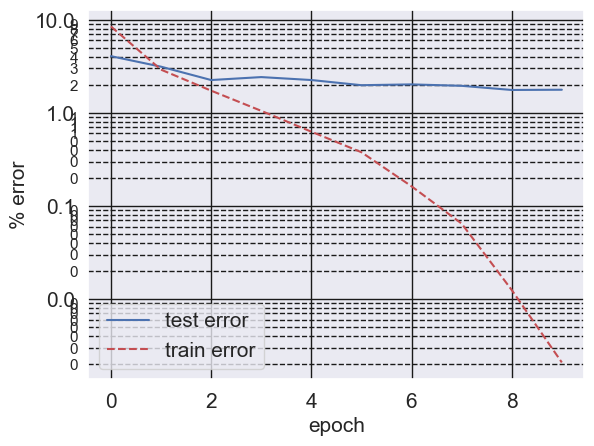

<Figure size 640x480 with 0 Axes>

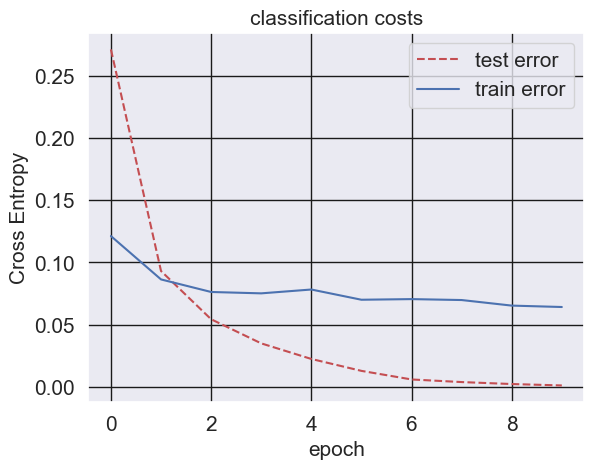

<Figure size 640x480 with 0 Axes>

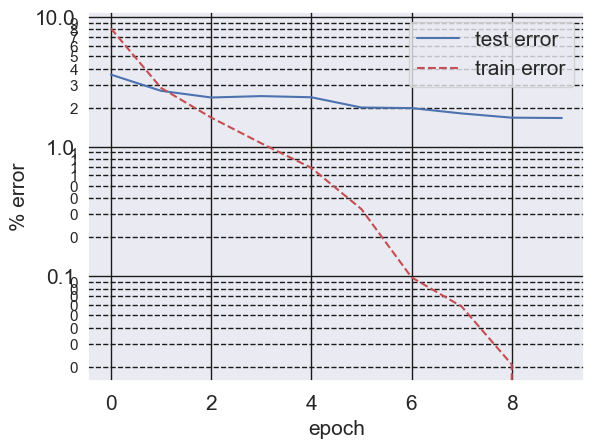

<Figure size 640x480 with 0 Axes>

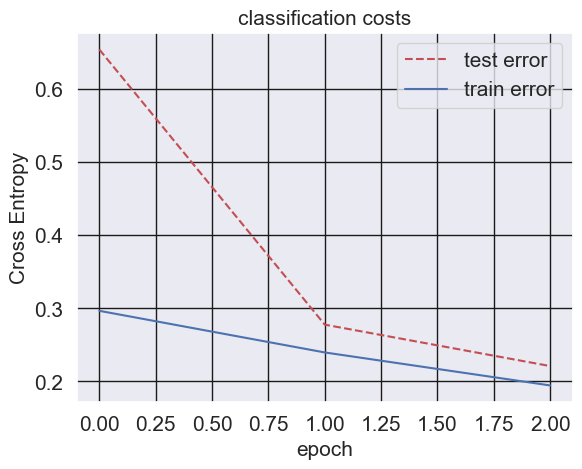

<Figure size 640x480 with 0 Axes>

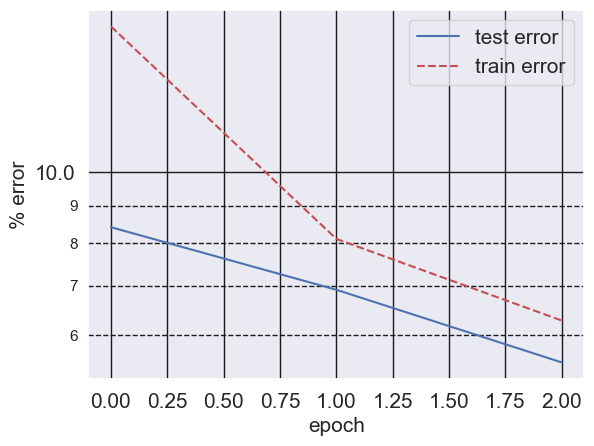

<Figure size 640x480 with 0 Axes>

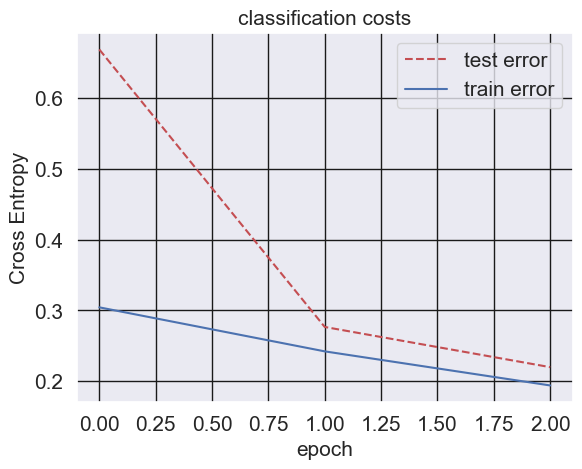

<Figure size 640x480 with 0 Axes>

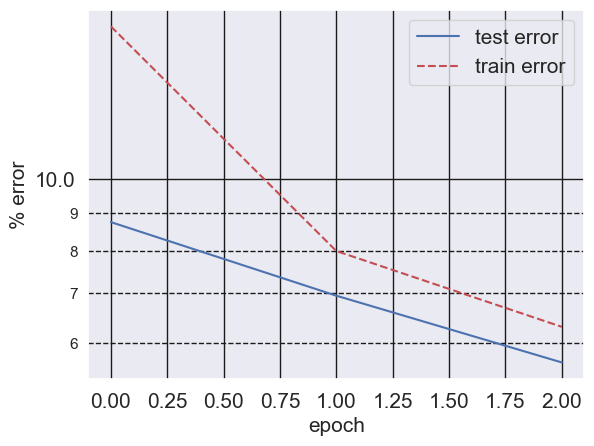

<Figure size 640x480 with 0 Axes>

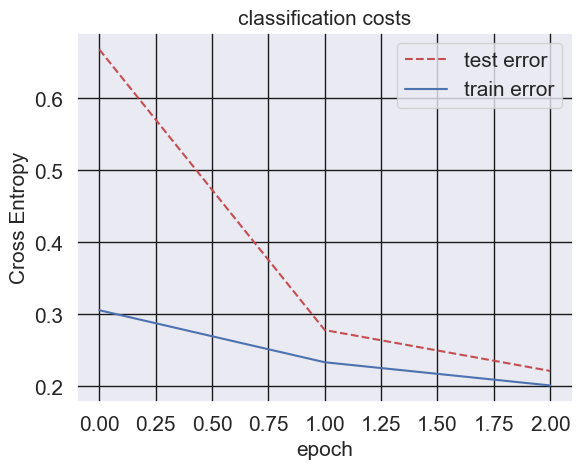

<Figure size 640x480 with 0 Axes>

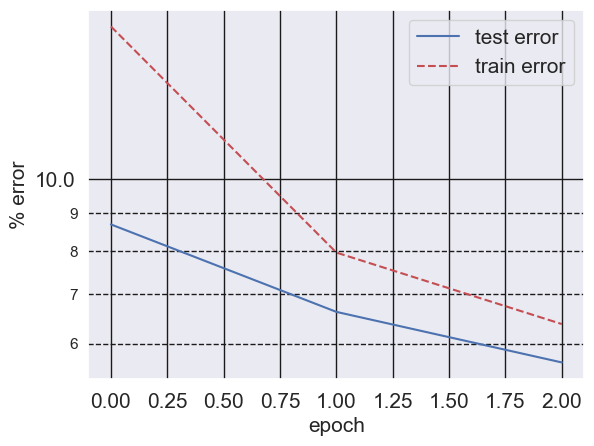

<Figure size 640x480 with 0 Axes>

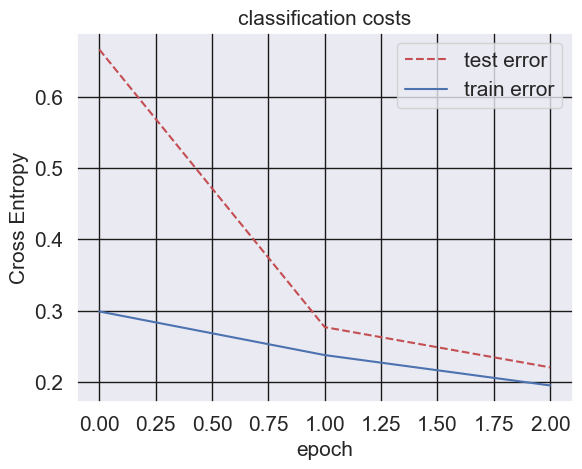

<Figure size 640x480 with 0 Axes>

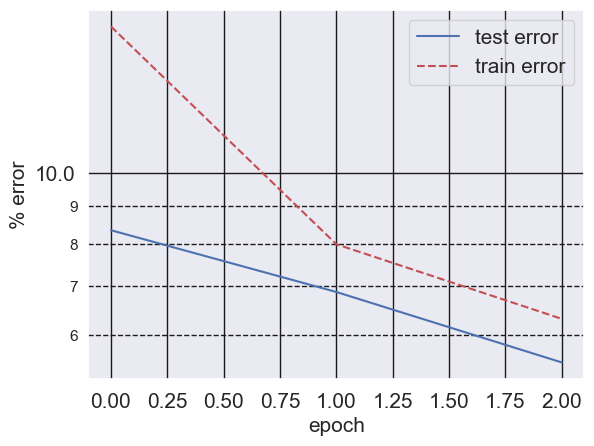

<Figure size 640x480 with 0 Axes>

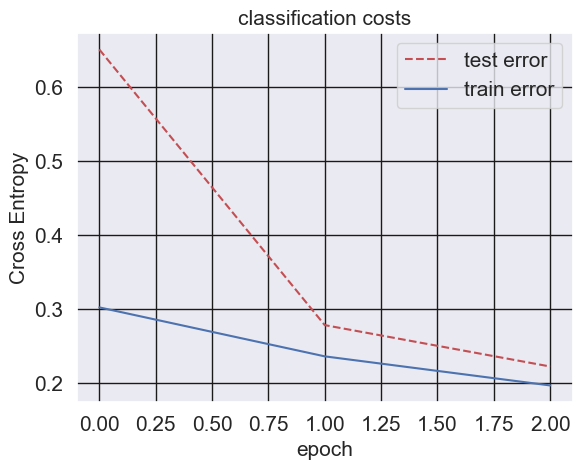

<Figure size 640x480 with 0 Axes>

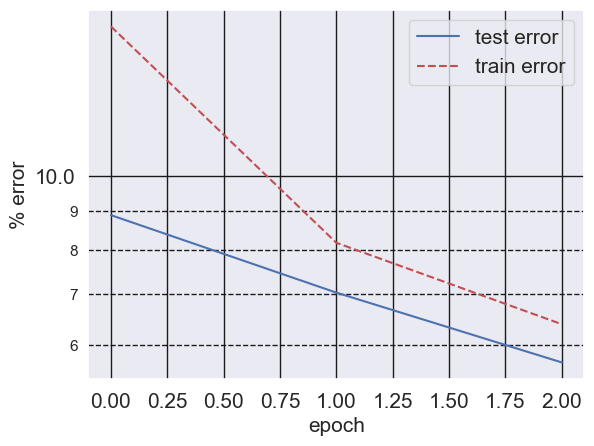

<Figure size 640x480 with 0 Axes>

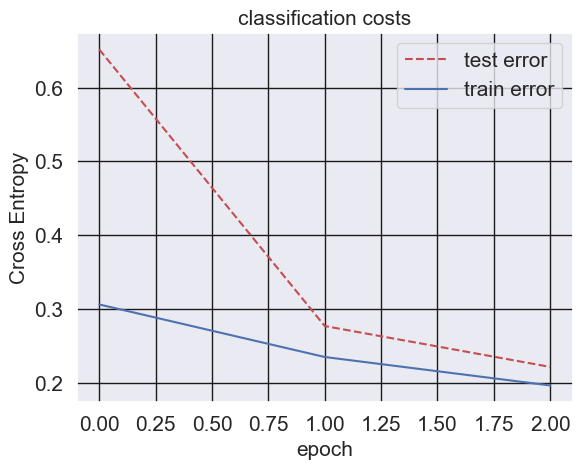

<Figure size 640x480 with 0 Axes>

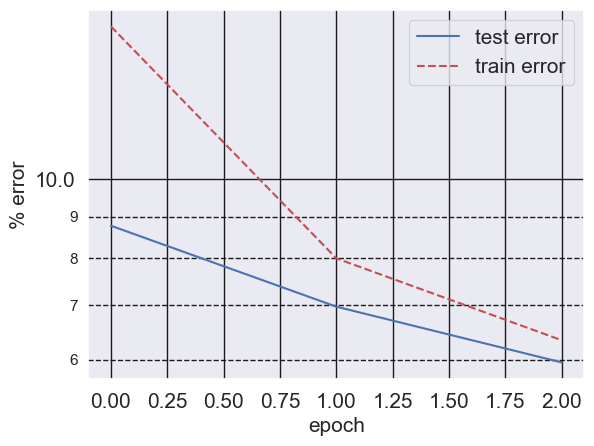

<Figure size 640x480 with 0 Axes>

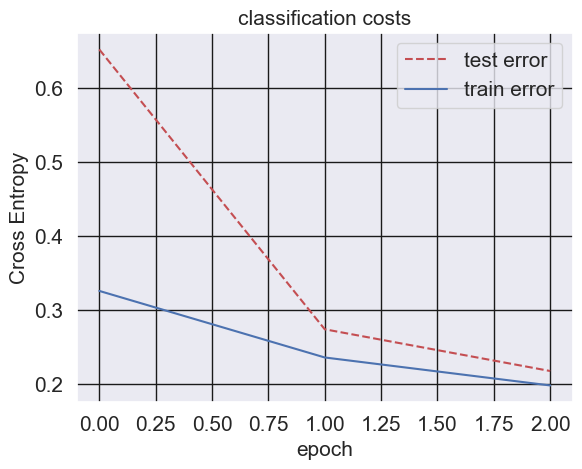

<Figure size 640x480 with 0 Axes>

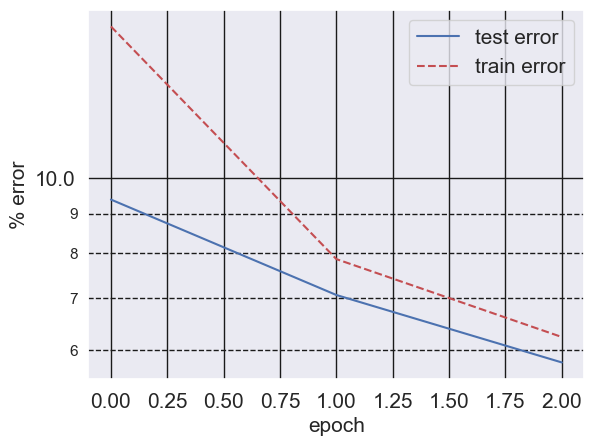

<Figure size 640x480 with 0 Axes>

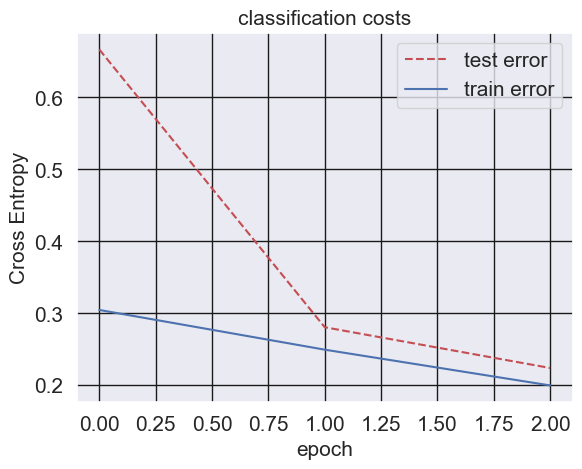

<Figure size 640x480 with 0 Axes>

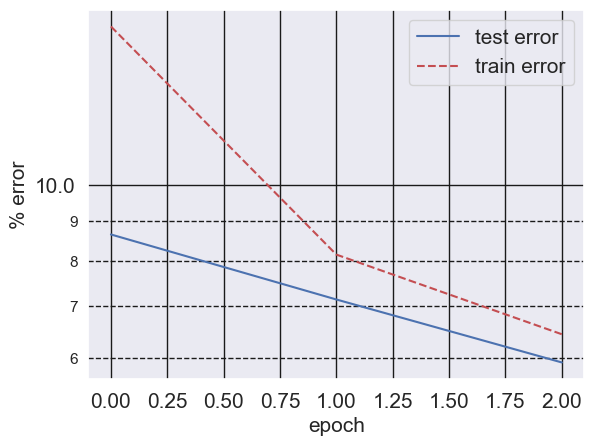

<Figure size 640x480 with 0 Axes>

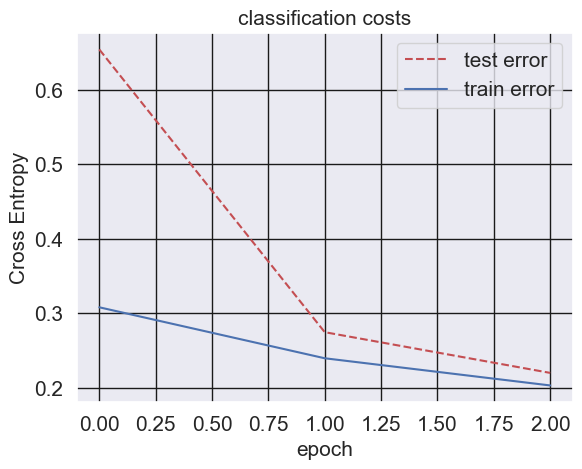

<Figure size 640x480 with 0 Axes>

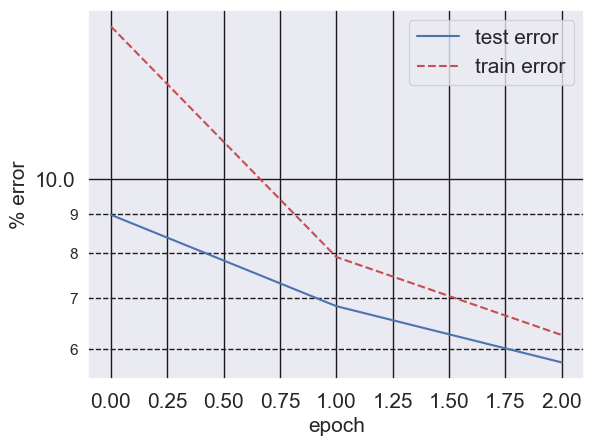

<Figure size 640x480 with 0 Axes>

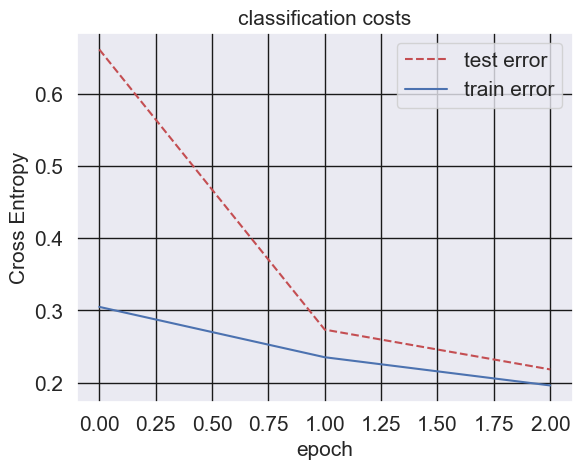

<Figure size 640x480 with 0 Axes>

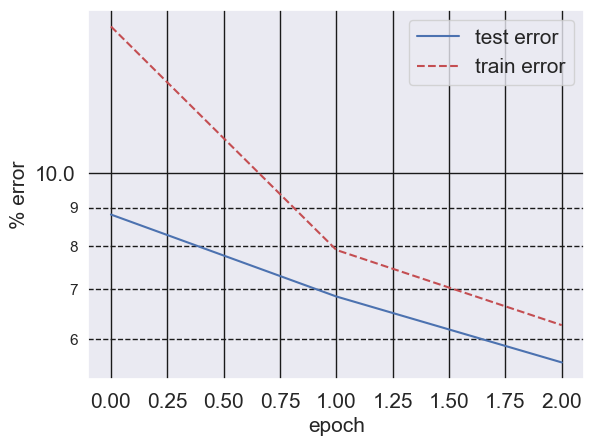

<Figure size 640x480 with 0 Axes>

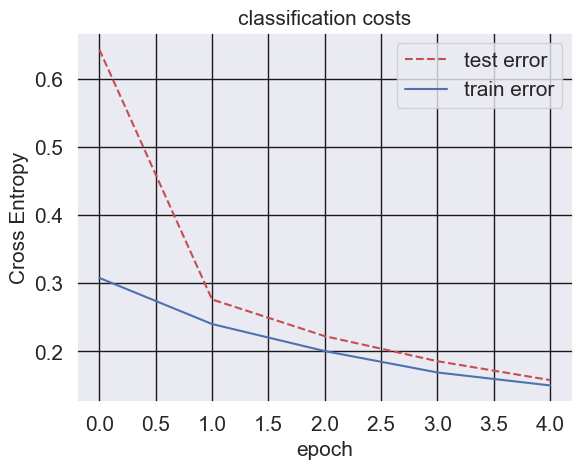

<Figure size 640x480 with 0 Axes>

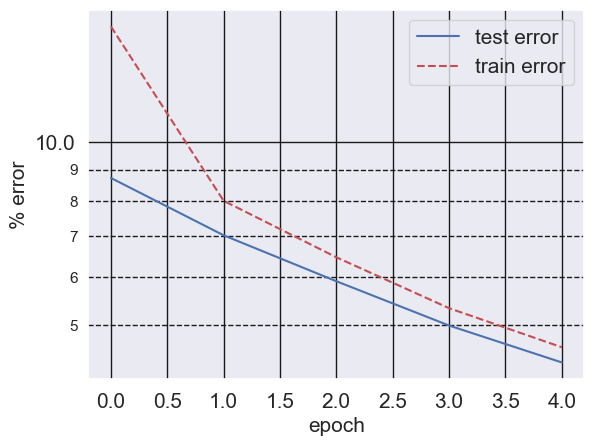

<Figure size 640x480 with 0 Axes>

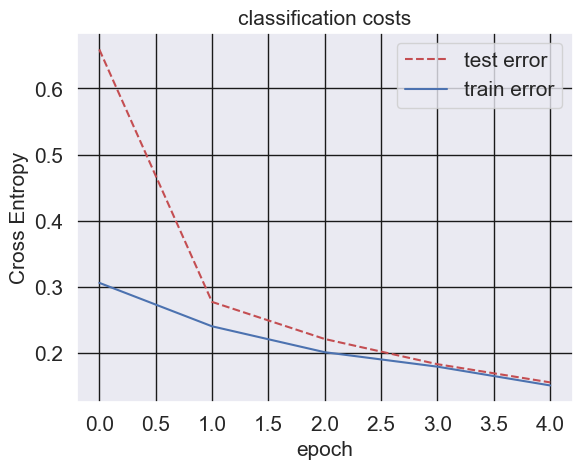

<Figure size 640x480 with 0 Axes>

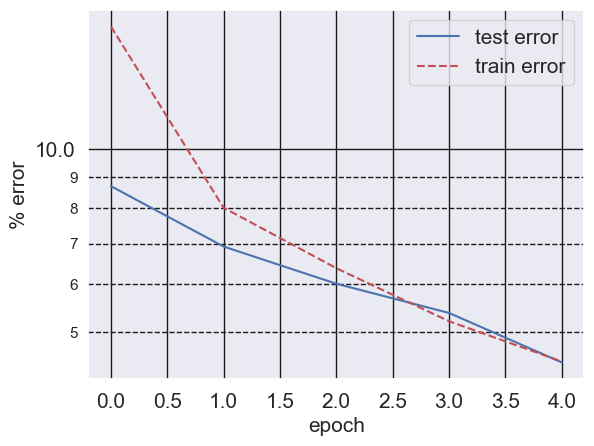

<Figure size 640x480 with 0 Axes>

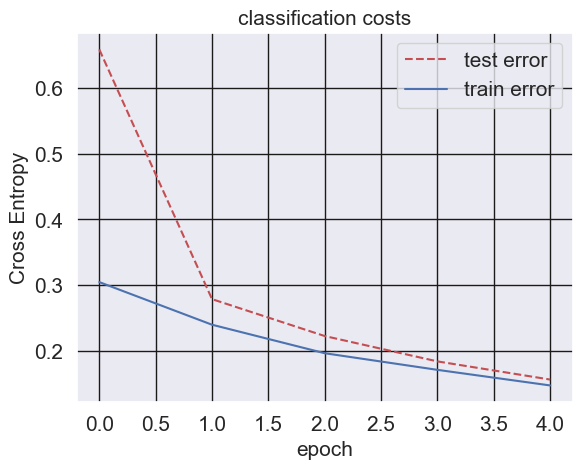

<Figure size 640x480 with 0 Axes>

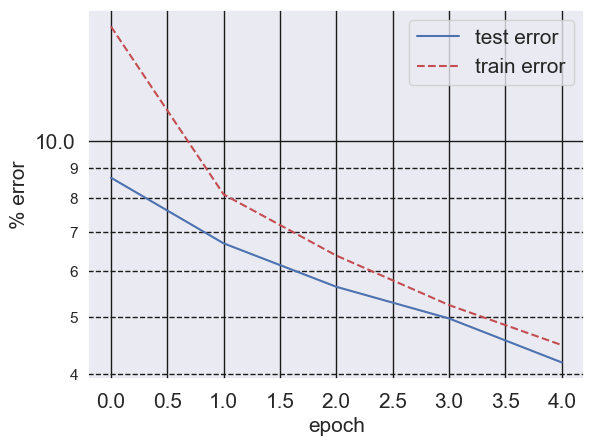

<Figure size 640x480 with 0 Axes>

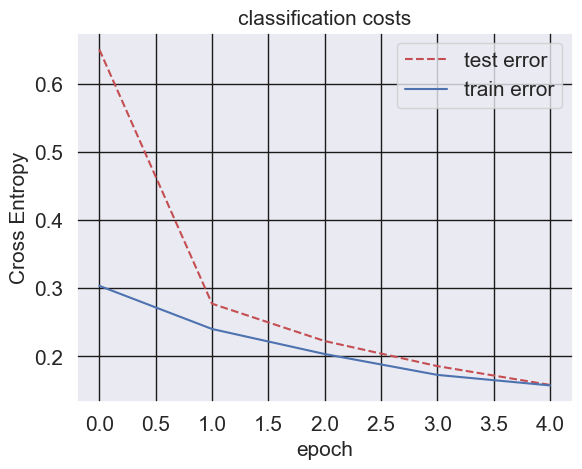

<Figure size 640x480 with 0 Axes>

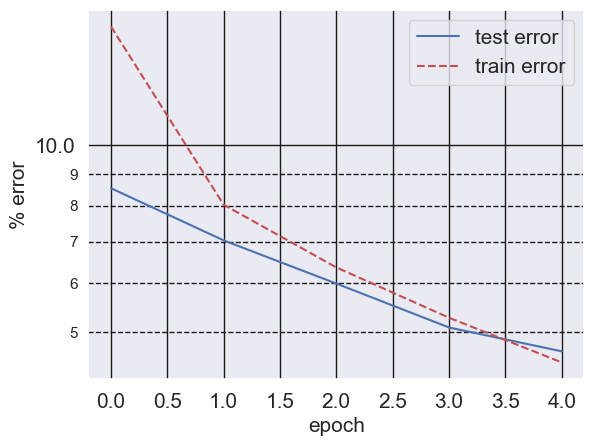

<Figure size 640x480 with 0 Axes>

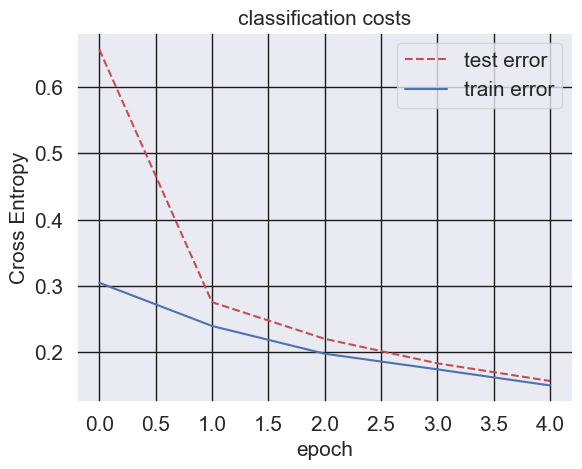

<Figure size 640x480 with 0 Axes>

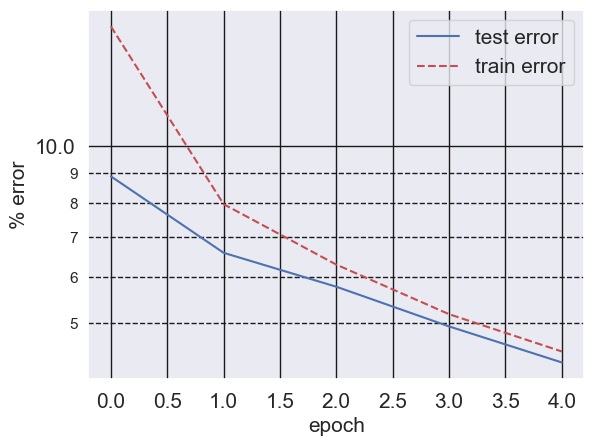

<Figure size 640x480 with 0 Axes>

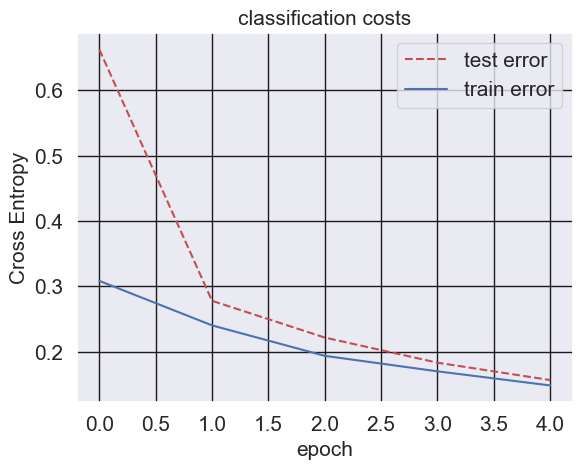

<Figure size 640x480 with 0 Axes>

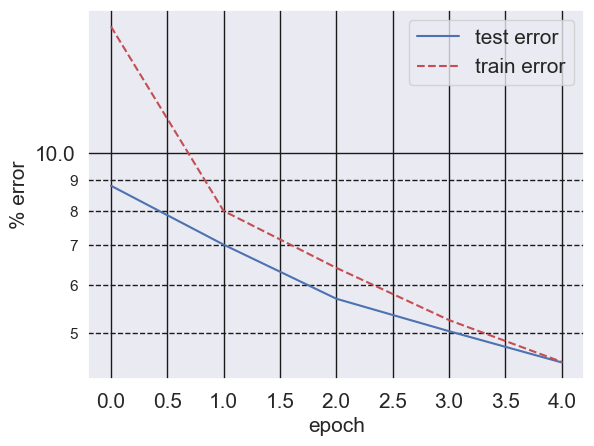

<Figure size 640x480 with 0 Axes>

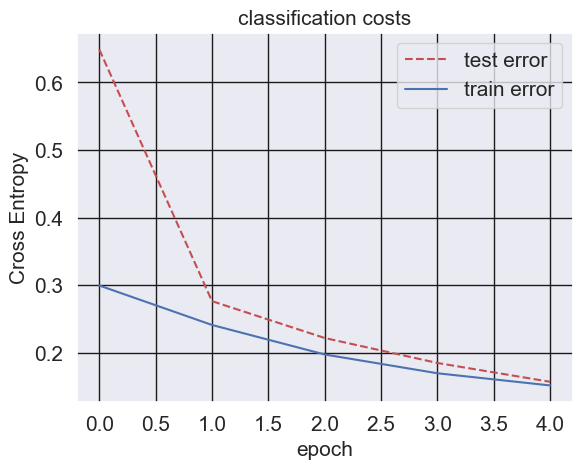

<Figure size 640x480 with 0 Axes>

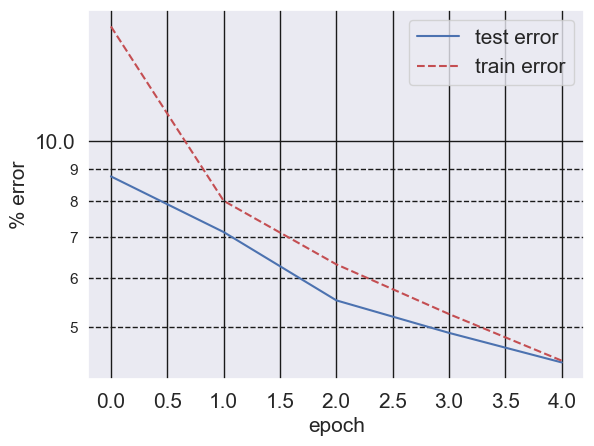

<Figure size 640x480 with 0 Axes>

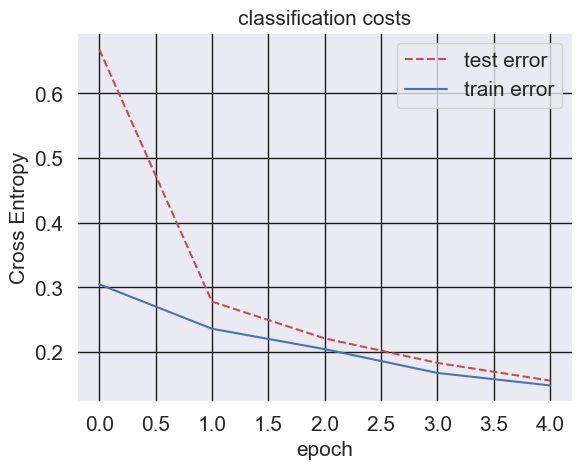

<Figure size 640x480 with 0 Axes>

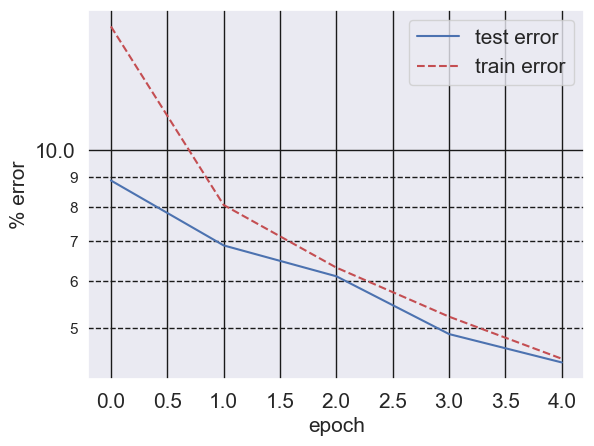

<Figure size 640x480 with 0 Axes>

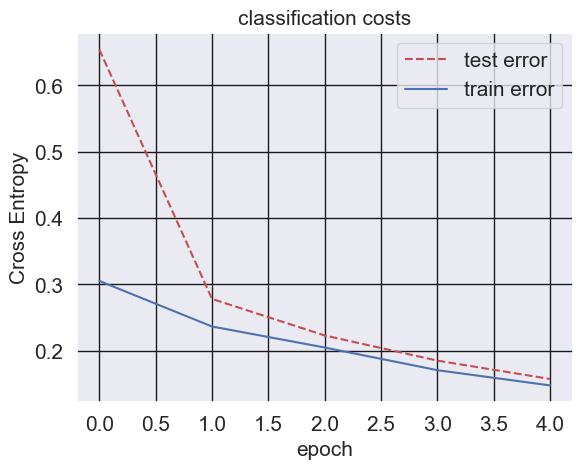

<Figure size 640x480 with 0 Axes>

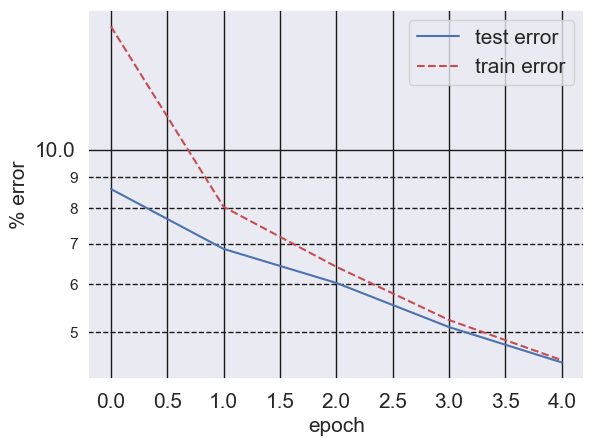

<Figure size 640x480 with 0 Axes>

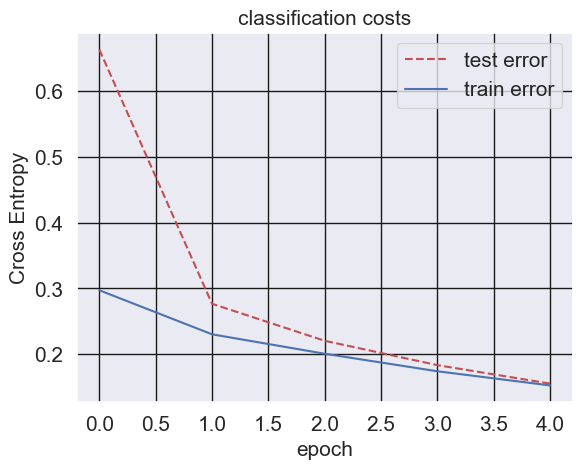

<Figure size 640x480 with 0 Axes>

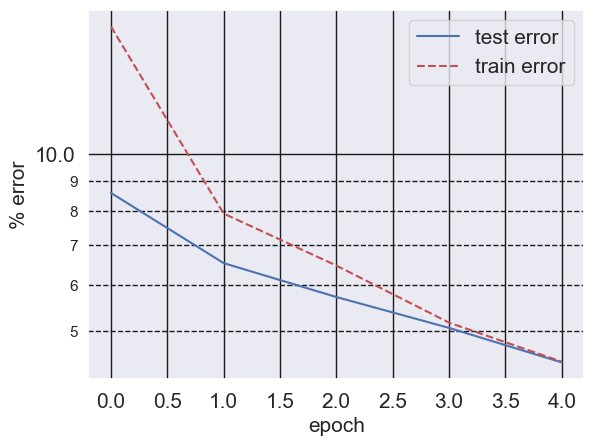

<Figure size 640x480 with 0 Axes>

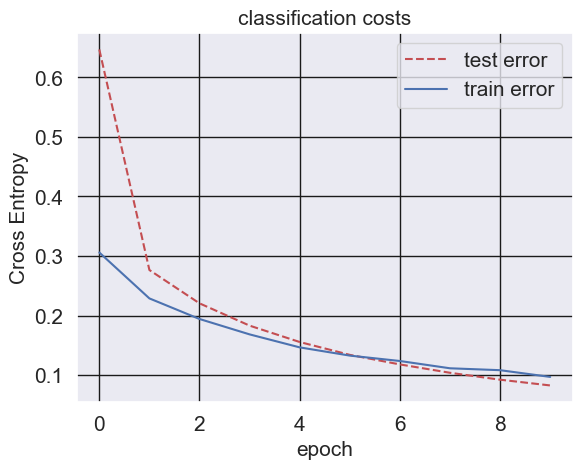

<Figure size 640x480 with 0 Axes>

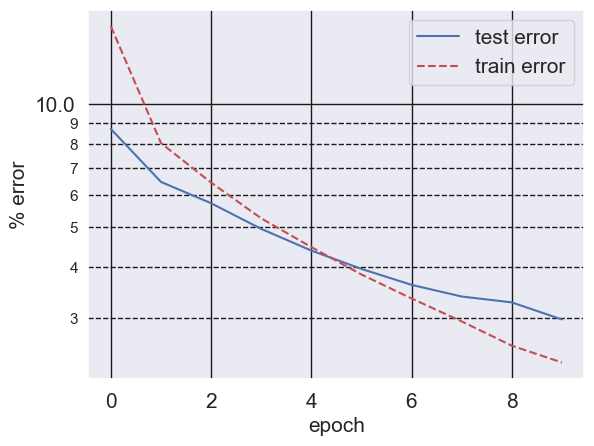

<Figure size 640x480 with 0 Axes>

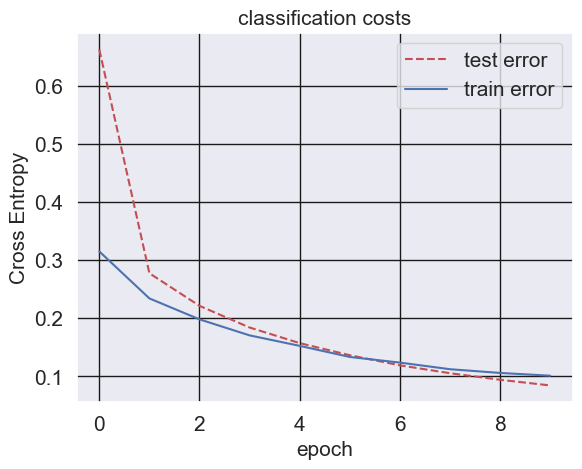

<Figure size 640x480 with 0 Axes>

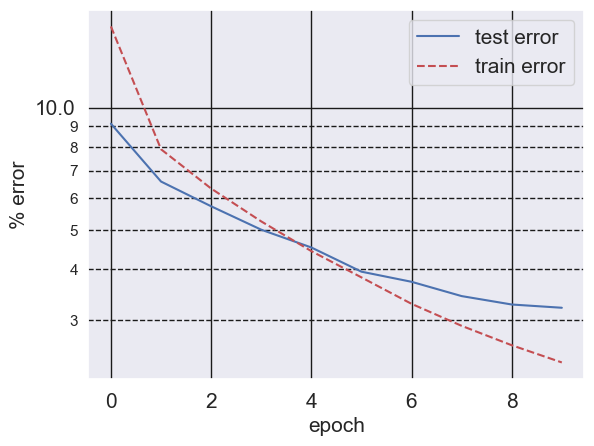

<Figure size 640x480 with 0 Axes>

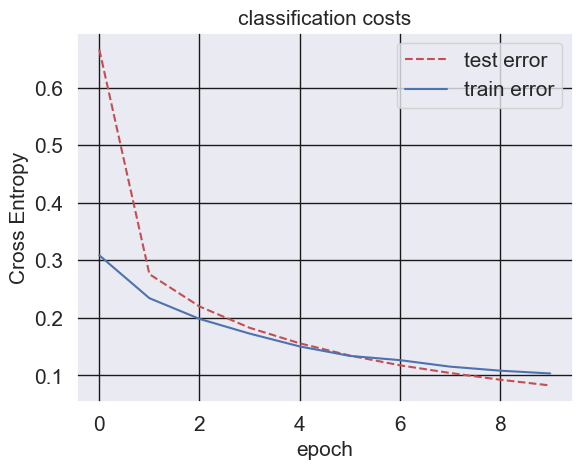

<Figure size 640x480 with 0 Axes>

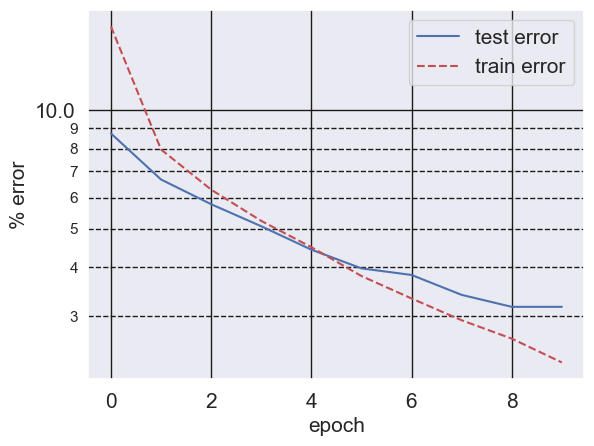

<Figure size 640x480 with 0 Axes>

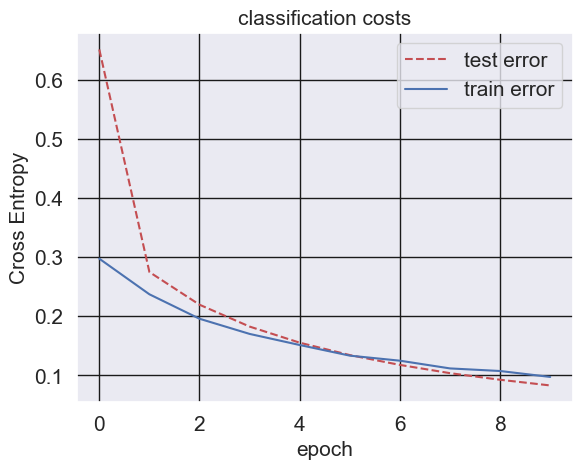

<Figure size 640x480 with 0 Axes>

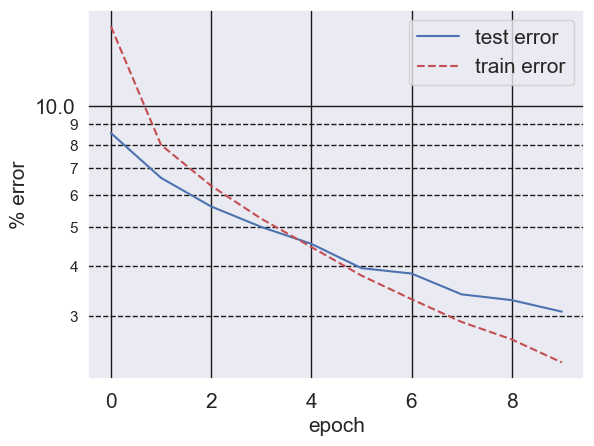

<Figure size 640x480 with 0 Axes>

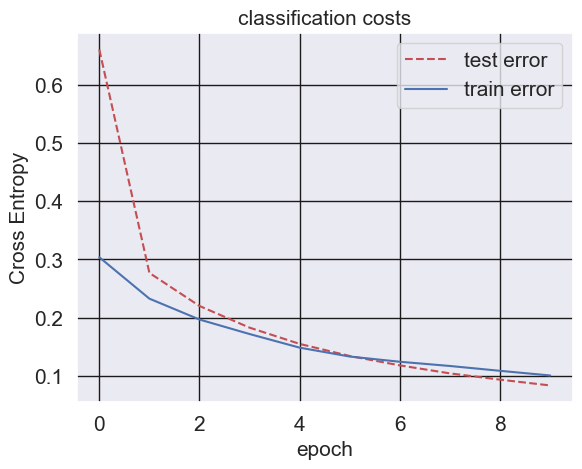

<Figure size 640x480 with 0 Axes>

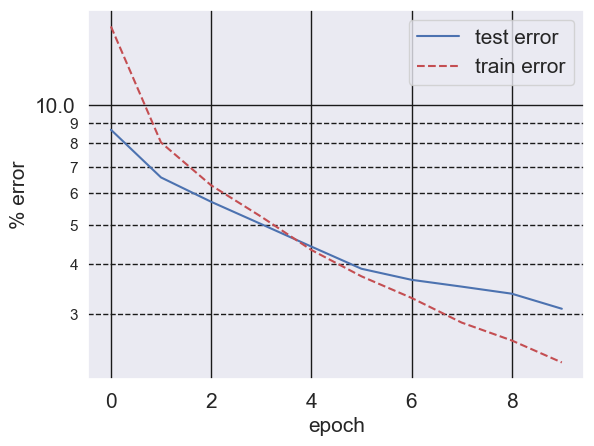

<Figure size 640x480 with 0 Axes>

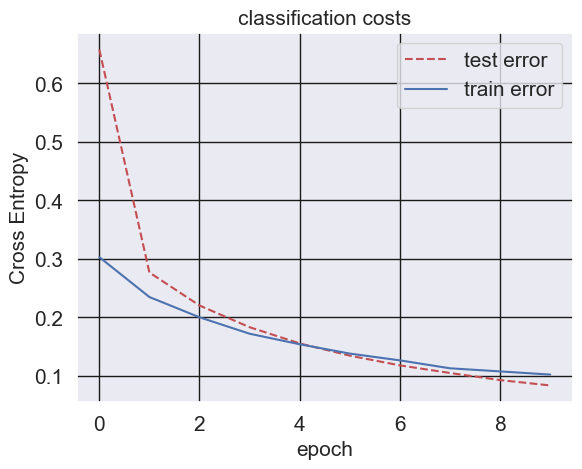

<Figure size 640x480 with 0 Axes>

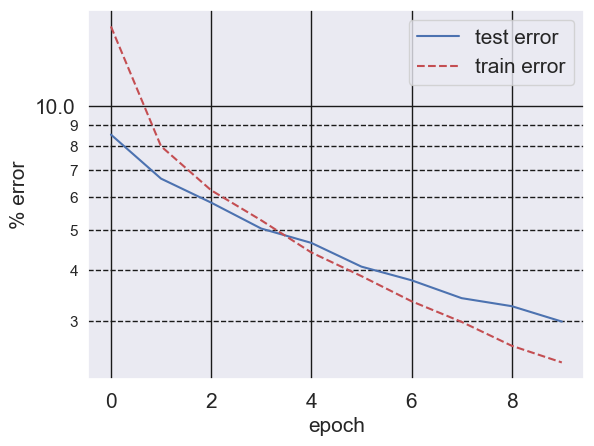

<Figure size 640x480 with 0 Axes>

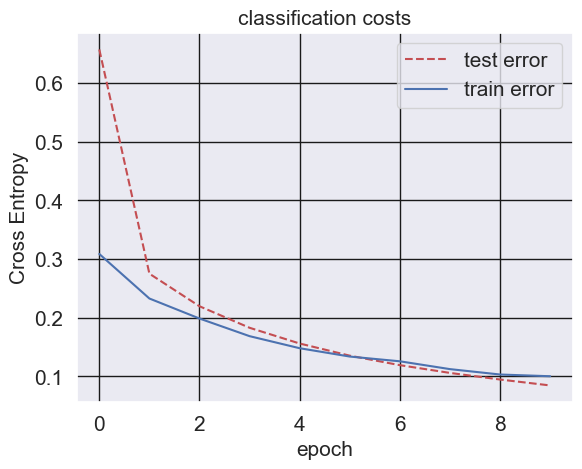

<Figure size 640x480 with 0 Axes>

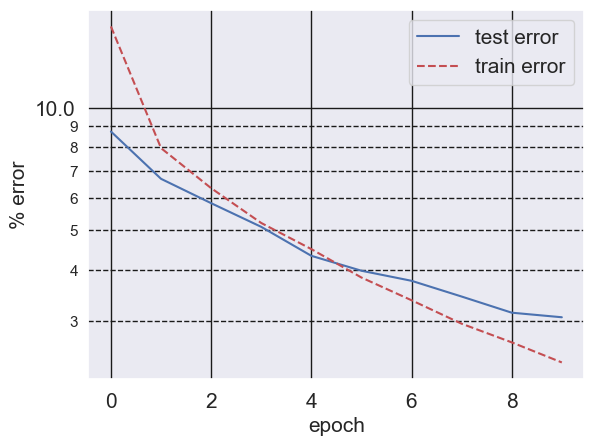

<Figure size 640x480 with 0 Axes>

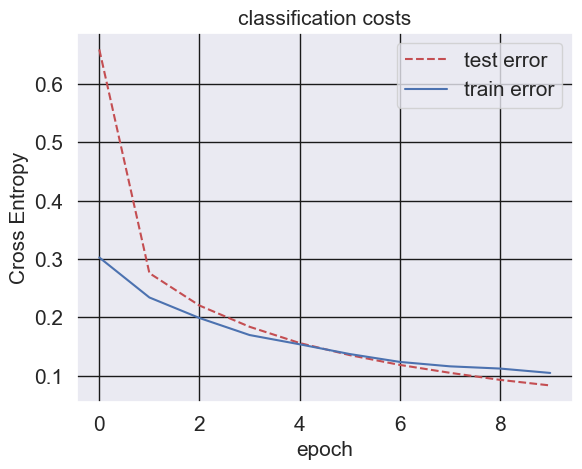

<Figure size 640x480 with 0 Axes>

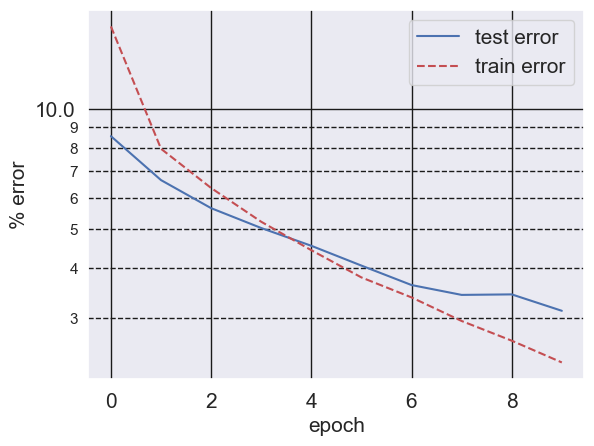

<Figure size 640x480 with 0 Axes>

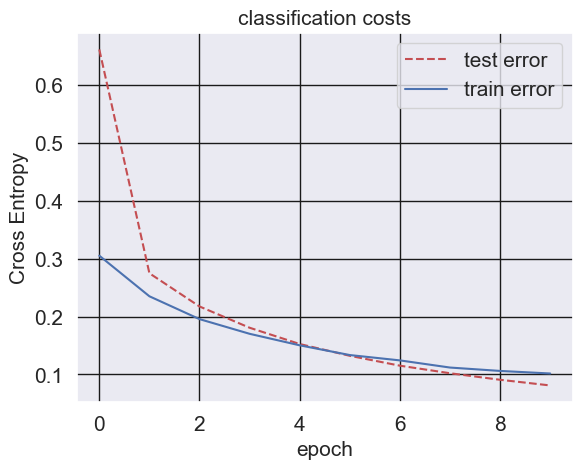

<Figure size 640x480 with 0 Axes>

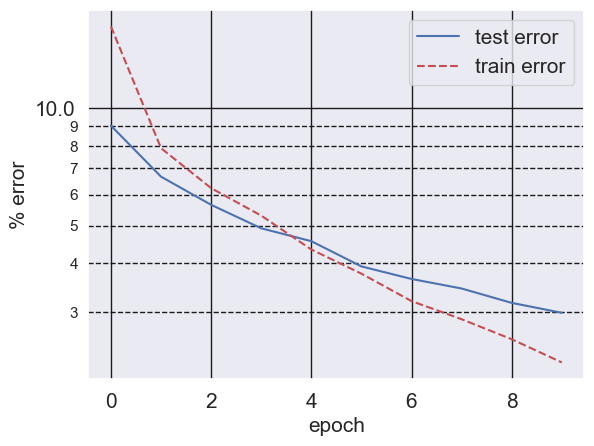

<Figure size 640x480 with 0 Axes>

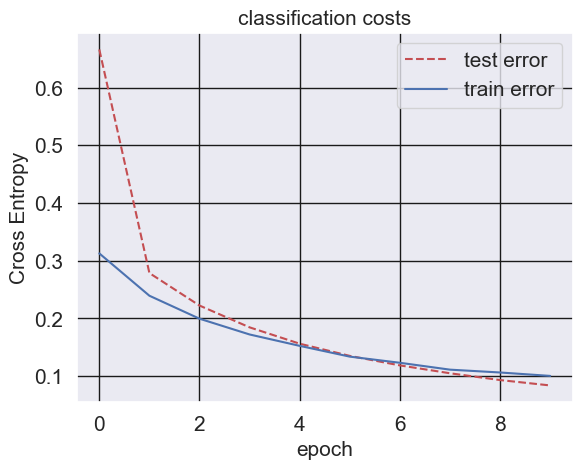

<Figure size 640x480 with 0 Axes>

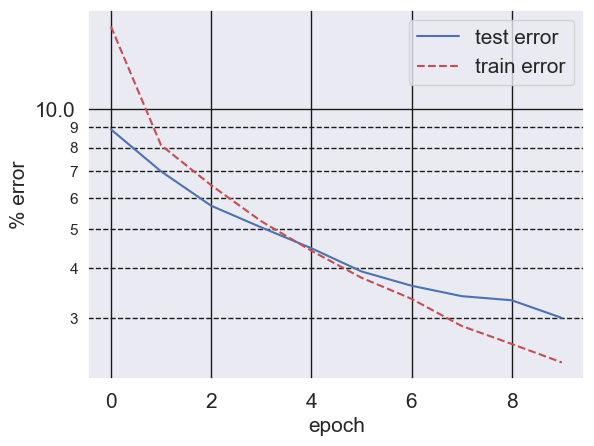

<Figure size 640x480 with 0 Axes>

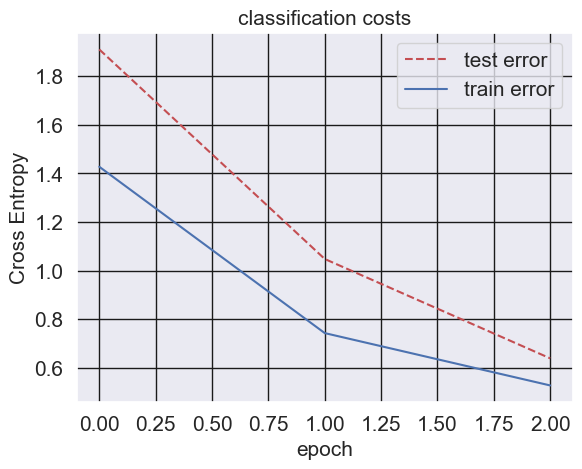

<Figure size 640x480 with 0 Axes>

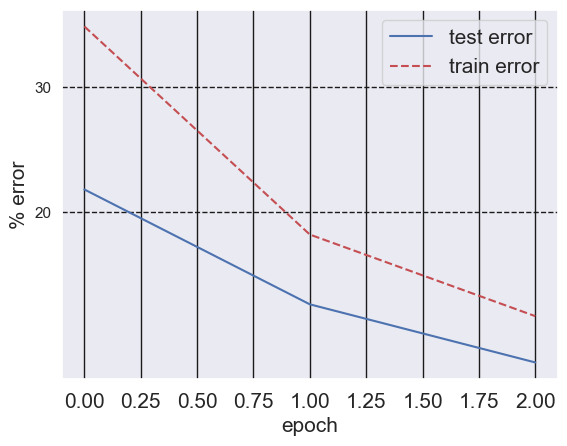

<Figure size 640x480 with 0 Axes>

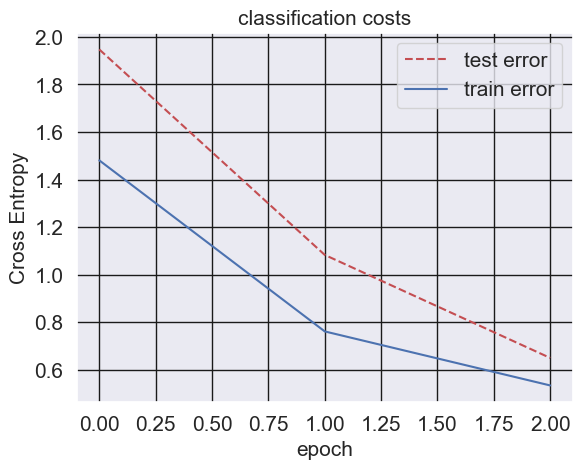

<Figure size 640x480 with 0 Axes>

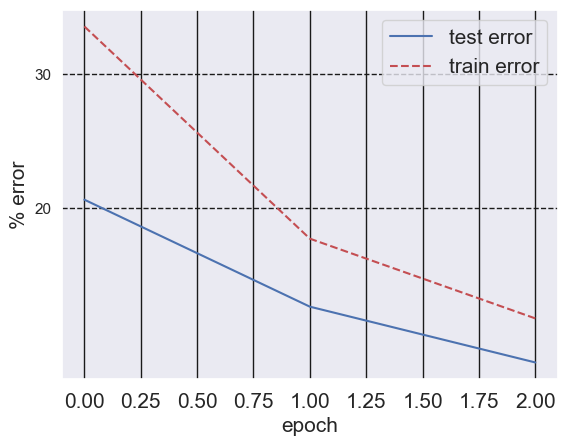

<Figure size 640x480 with 0 Axes>

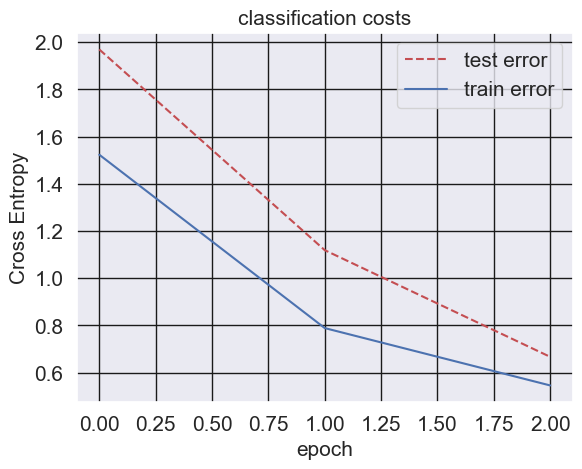

<Figure size 640x480 with 0 Axes>

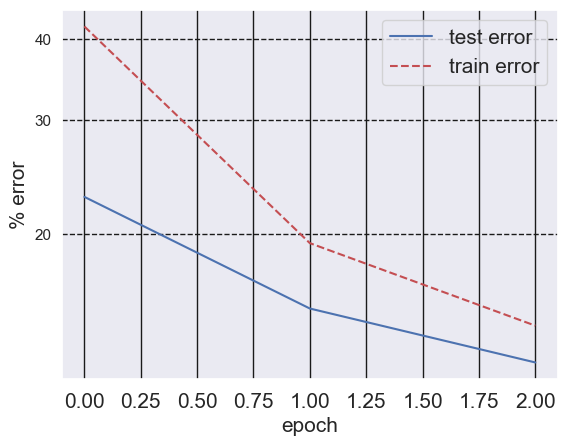

<Figure size 640x480 with 0 Axes>

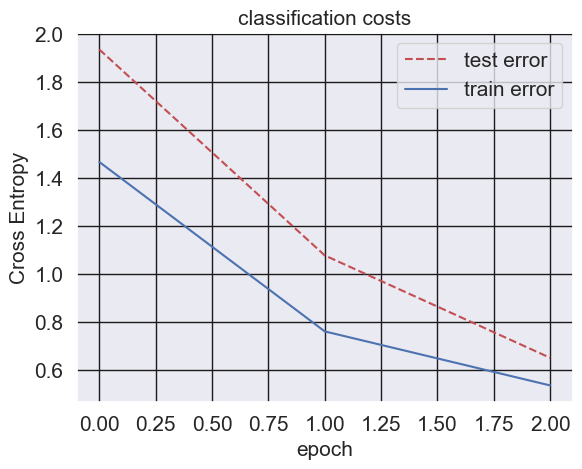

<Figure size 640x480 with 0 Axes>

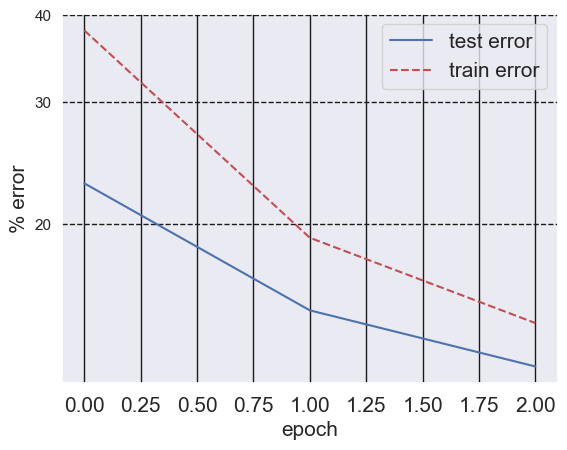

<Figure size 640x480 with 0 Axes>

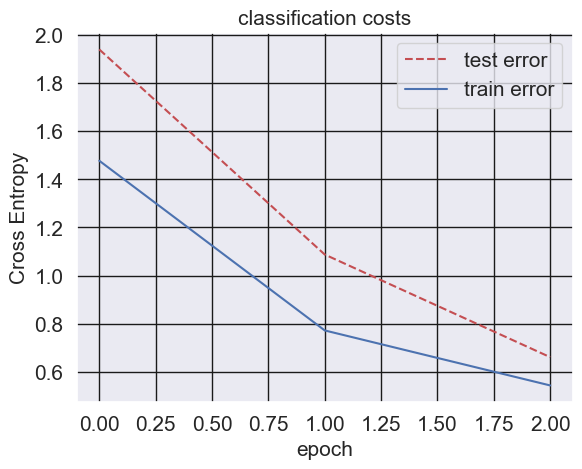

<Figure size 640x480 with 0 Axes>

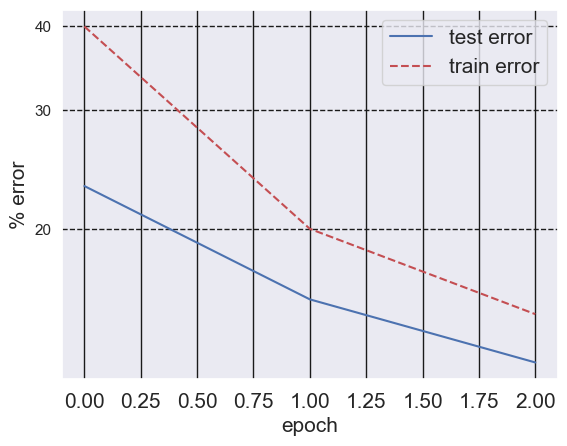

<Figure size 640x480 with 0 Axes>

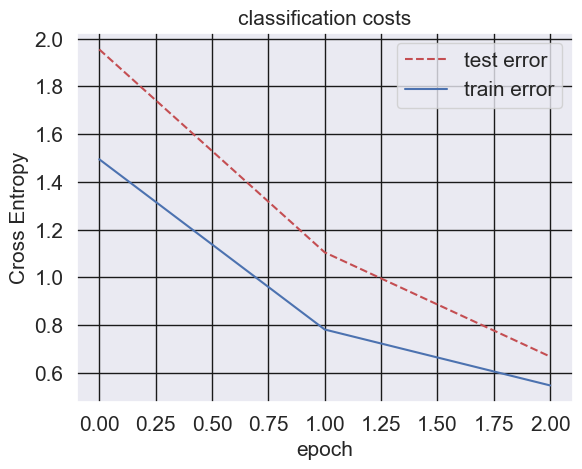

<Figure size 640x480 with 0 Axes>

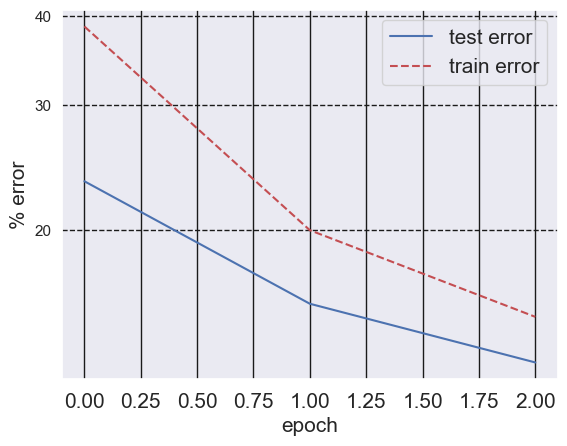

<Figure size 640x480 with 0 Axes>

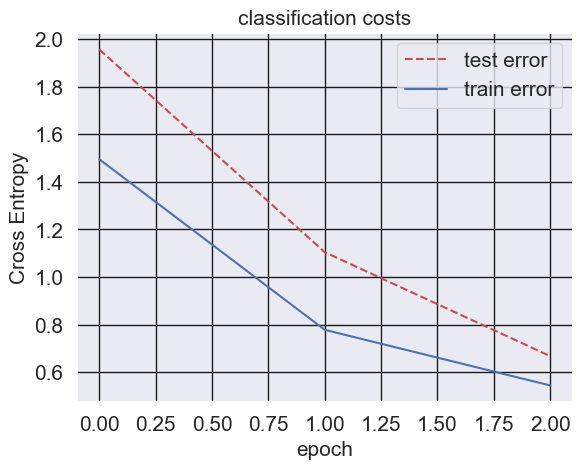

<Figure size 640x480 with 0 Axes>

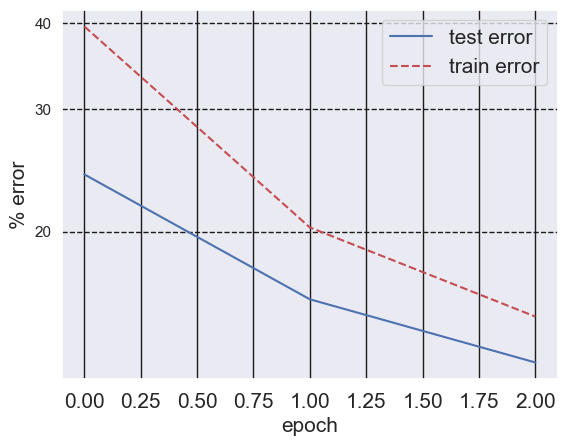

<Figure size 640x480 with 0 Axes>

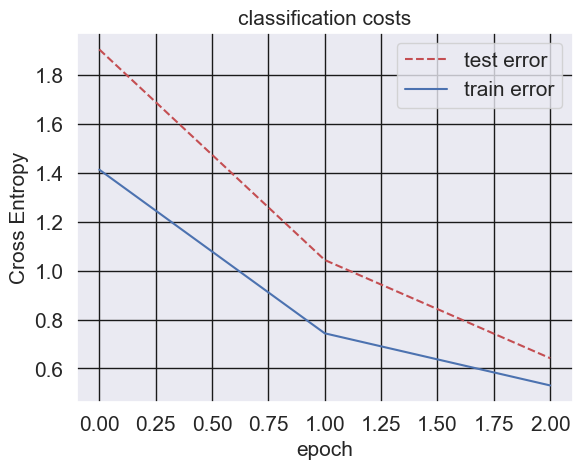

<Figure size 640x480 with 0 Axes>

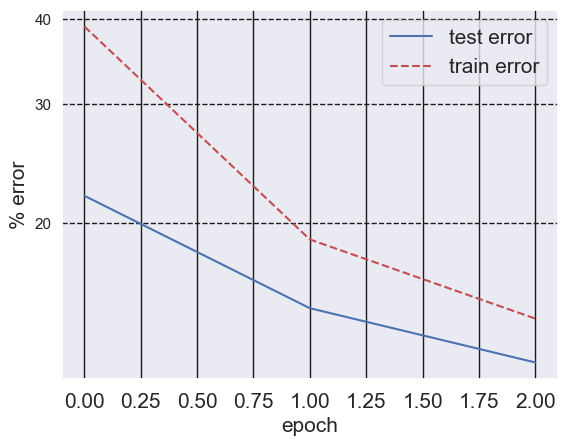

<Figure size 640x480 with 0 Axes>

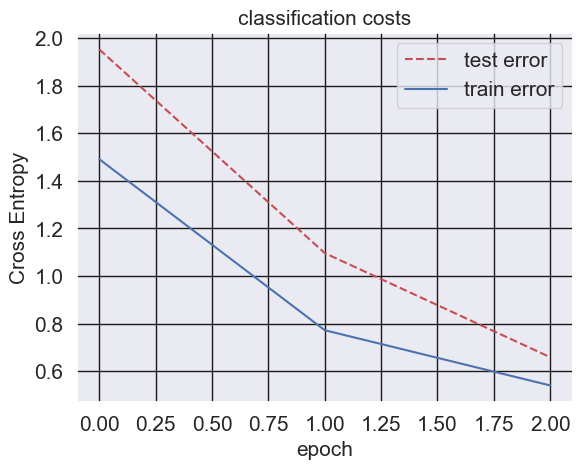

<Figure size 640x480 with 0 Axes>

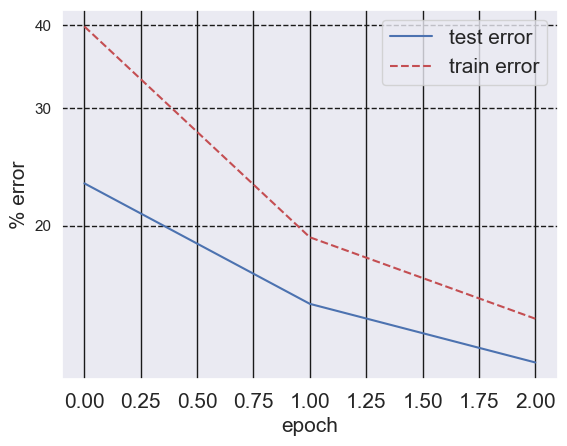

<Figure size 640x480 with 0 Axes>

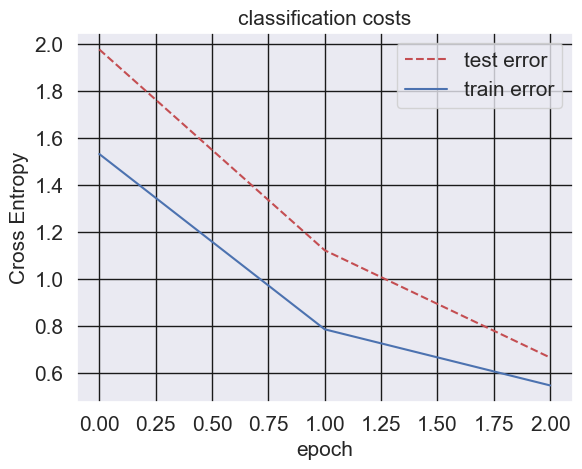

<Figure size 640x480 with 0 Axes>

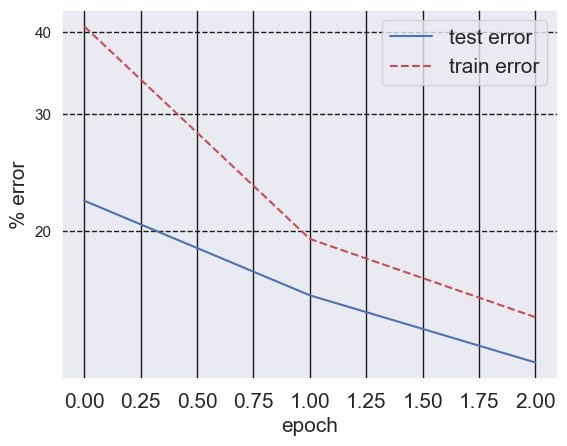

<Figure size 640x480 with 0 Axes>

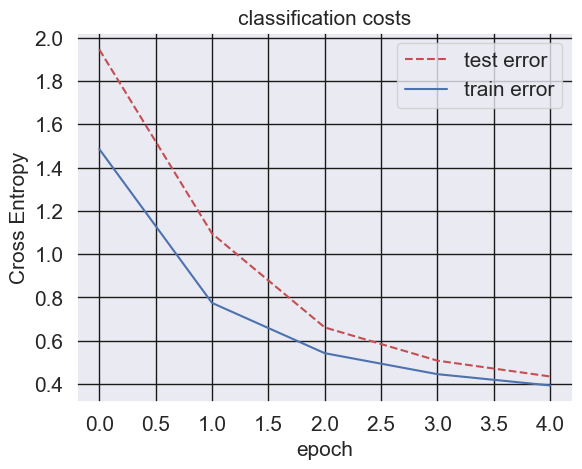

<Figure size 640x480 with 0 Axes>

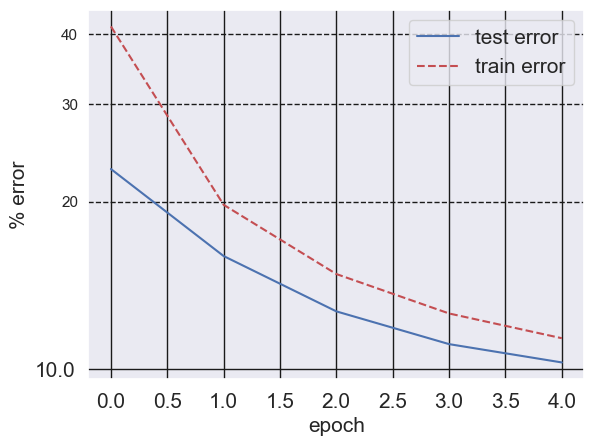

<Figure size 640x480 with 0 Axes>

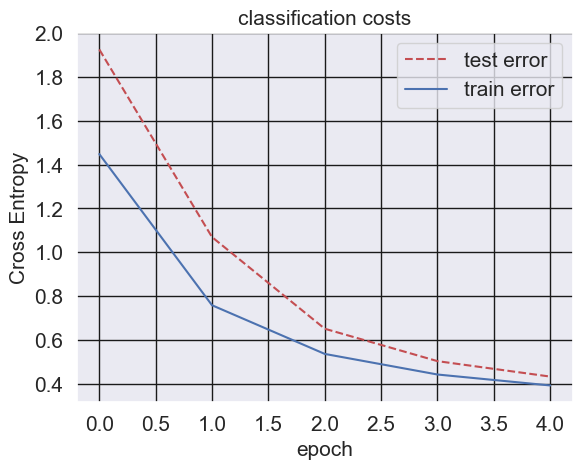

<Figure size 640x480 with 0 Axes>

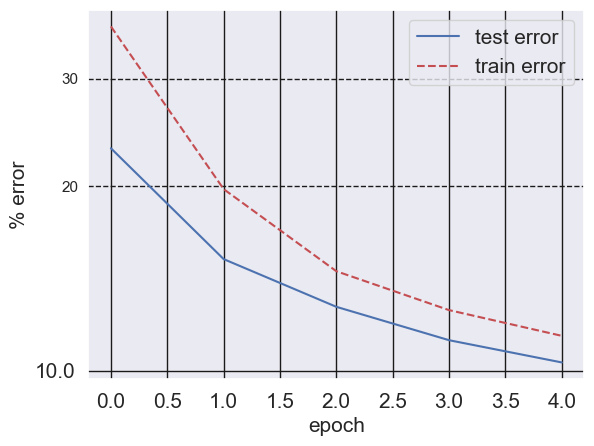

<Figure size 640x480 with 0 Axes>

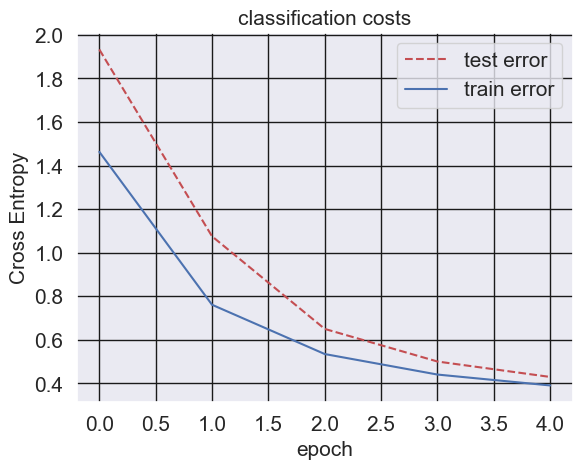

<Figure size 640x480 with 0 Axes>

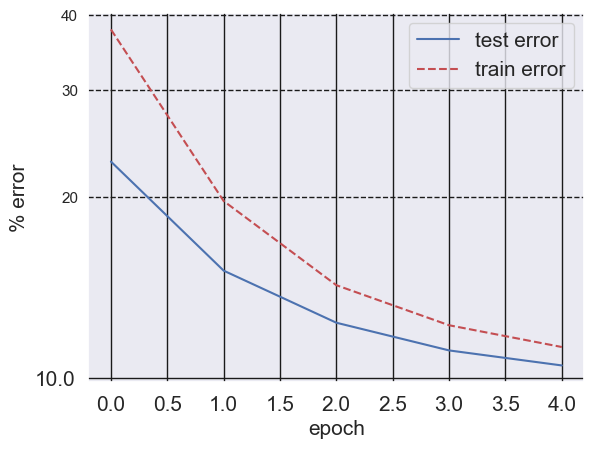

<Figure size 640x480 with 0 Axes>

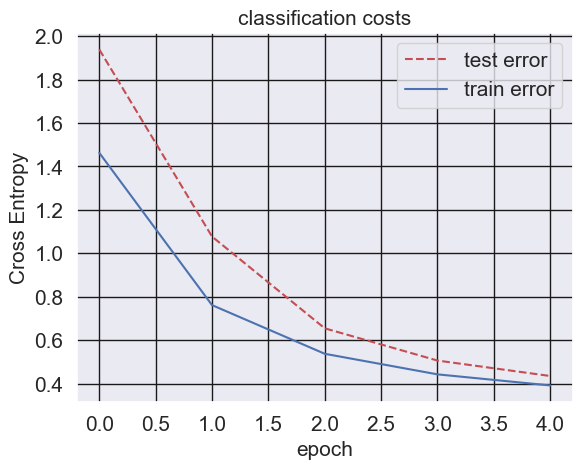

<Figure size 640x480 with 0 Axes>

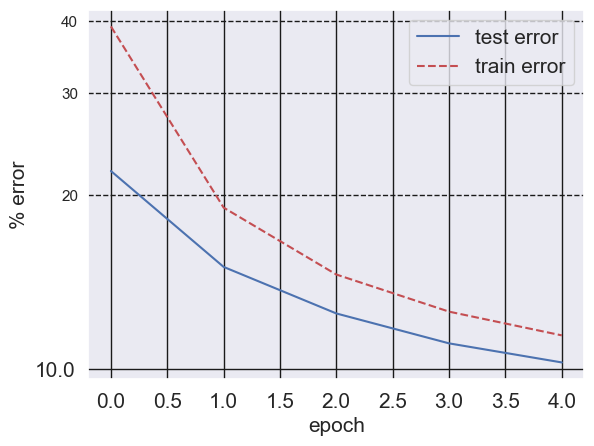

<Figure size 640x480 with 0 Axes>

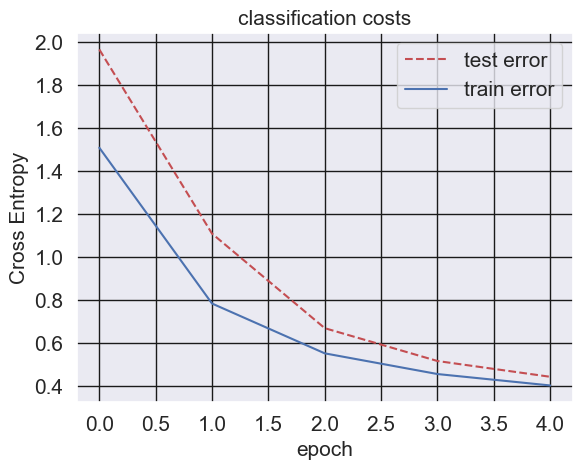

<Figure size 640x480 with 0 Axes>

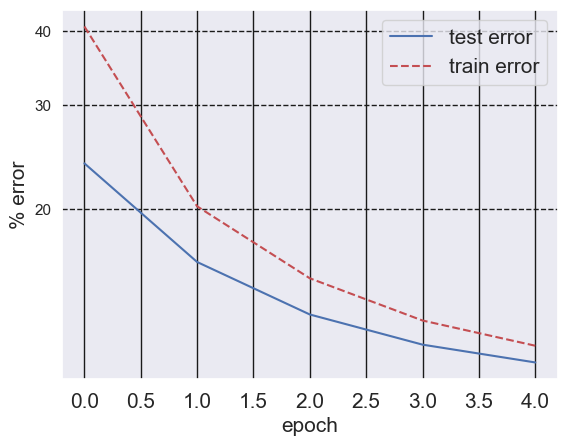

<Figure size 640x480 with 0 Axes>

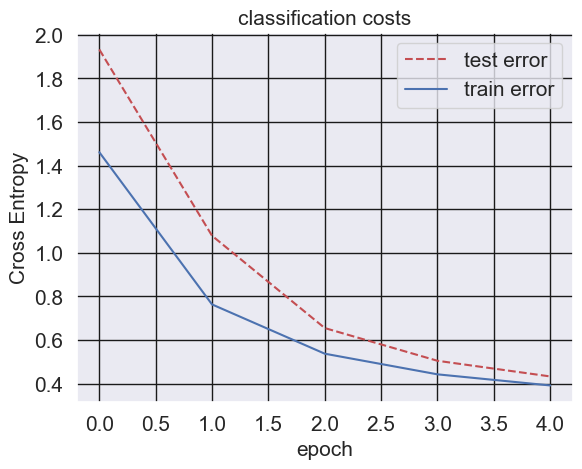

<Figure size 640x480 with 0 Axes>

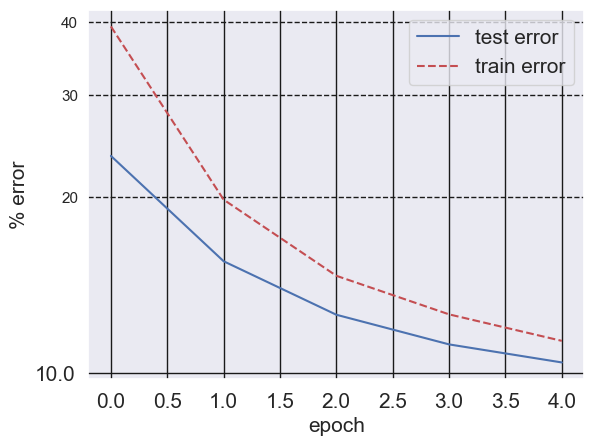

<Figure size 640x480 with 0 Axes>

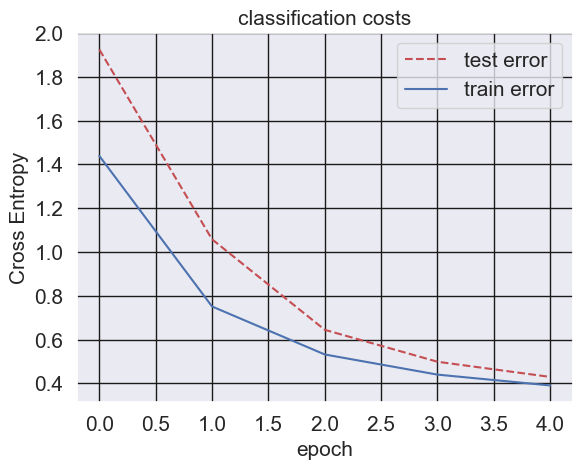

<Figure size 640x480 with 0 Axes>

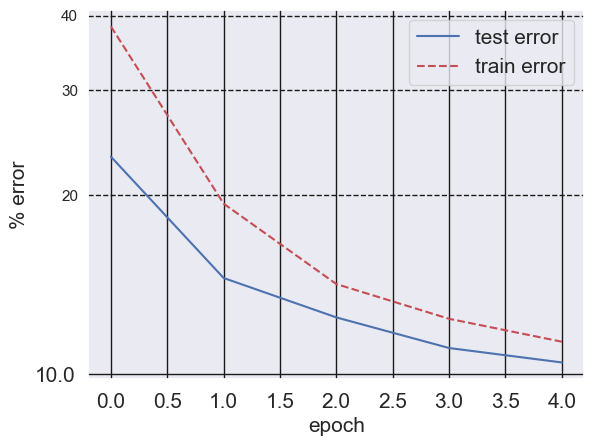

<Figure size 640x480 with 0 Axes>

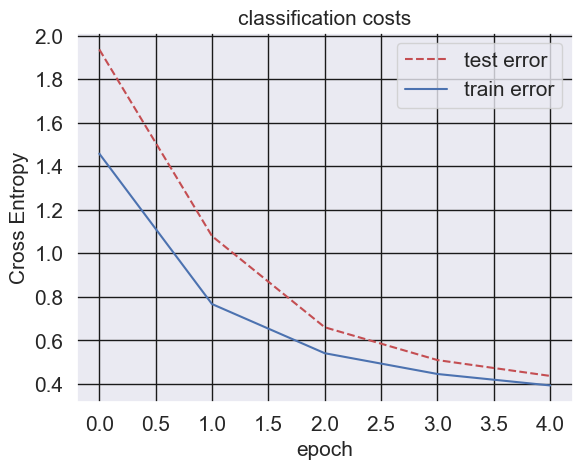

<Figure size 640x480 with 0 Axes>

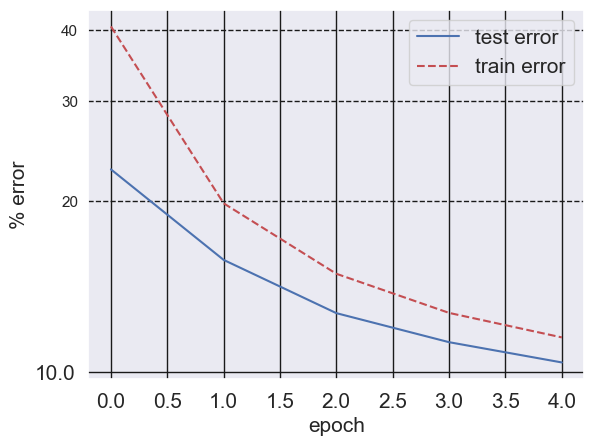

<Figure size 640x480 with 0 Axes>

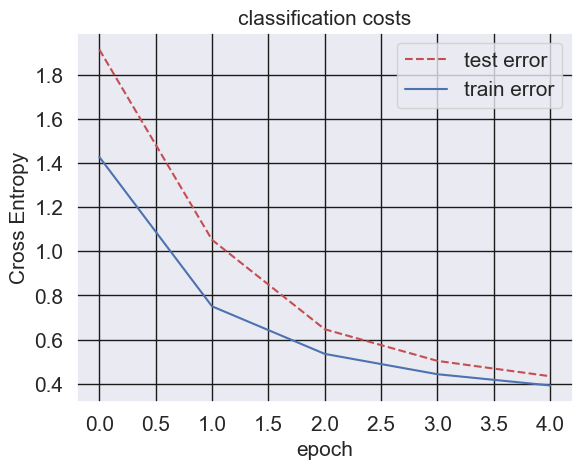

<Figure size 640x480 with 0 Axes>

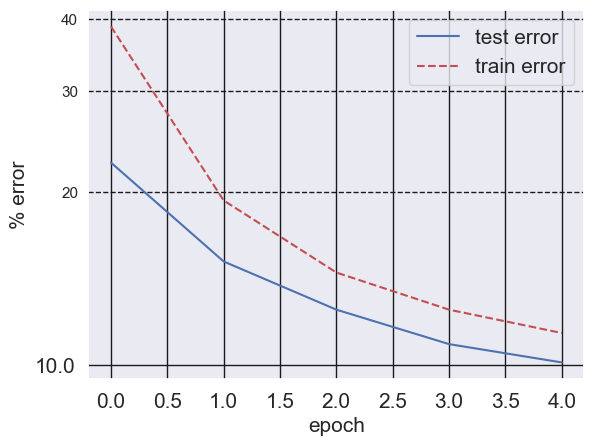

<Figure size 640x480 with 0 Axes>

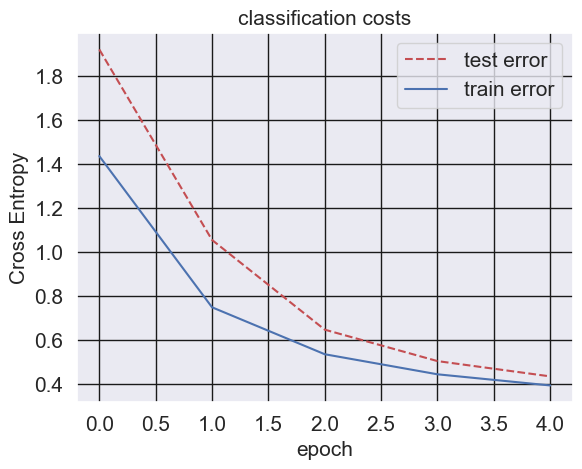

<Figure size 640x480 with 0 Axes>

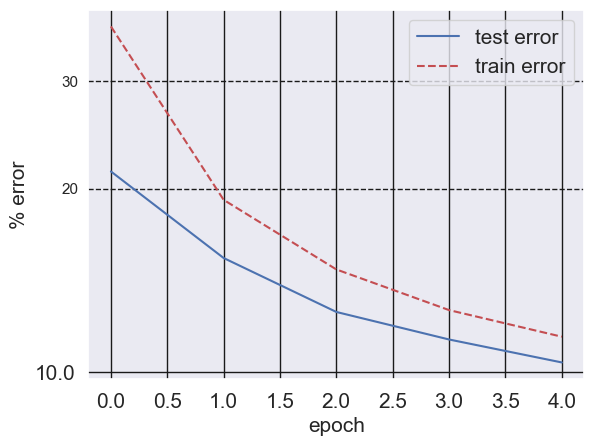

<Figure size 640x480 with 0 Axes>

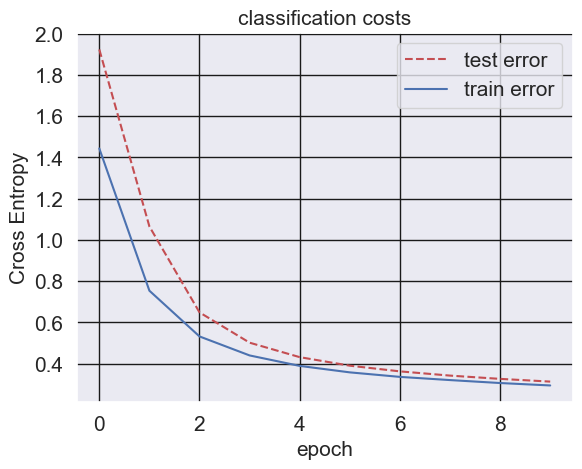

<Figure size 640x480 with 0 Axes>

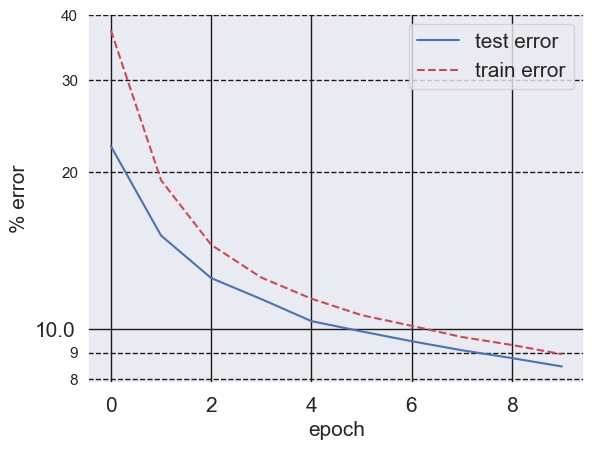

<Figure size 640x480 with 0 Axes>

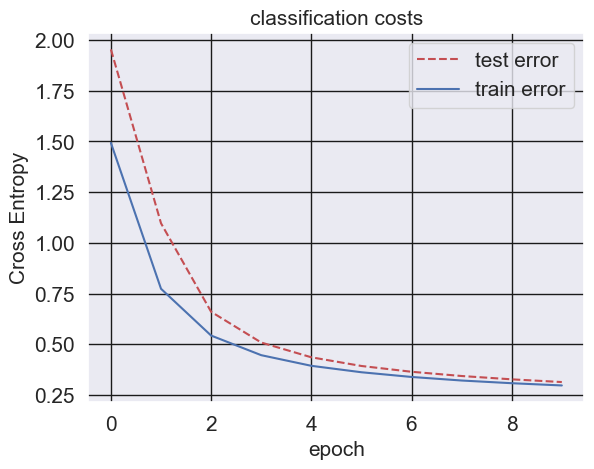

<Figure size 640x480 with 0 Axes>

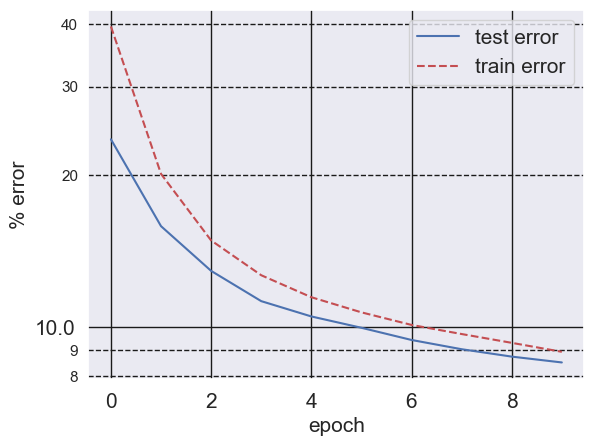

<Figure size 640x480 with 0 Axes>

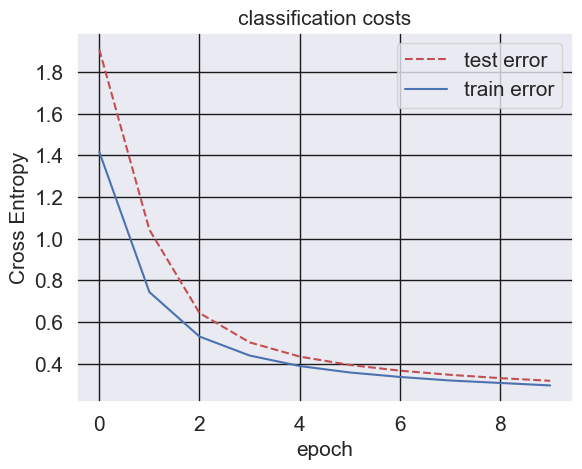

<Figure size 640x480 with 0 Axes>

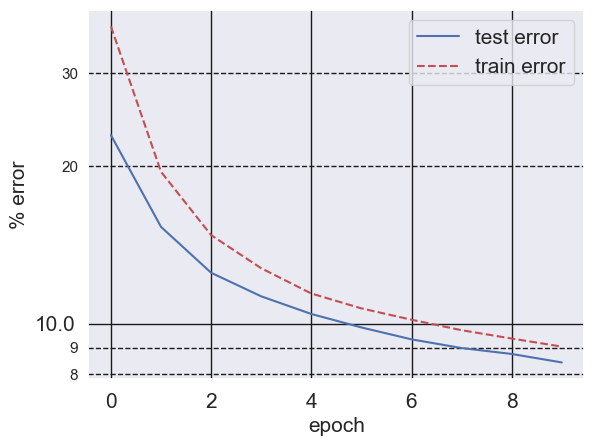

<Figure size 640x480 with 0 Axes>

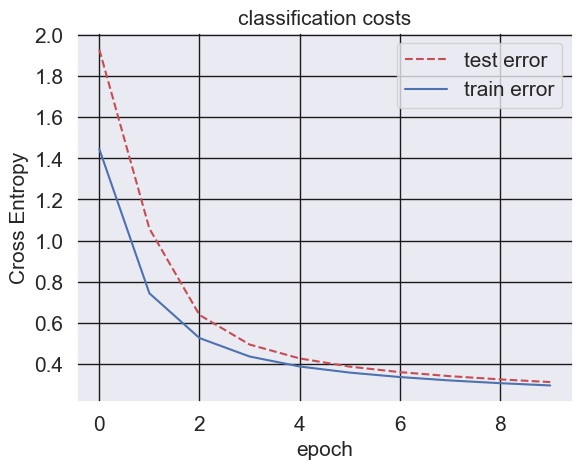

<Figure size 640x480 with 0 Axes>

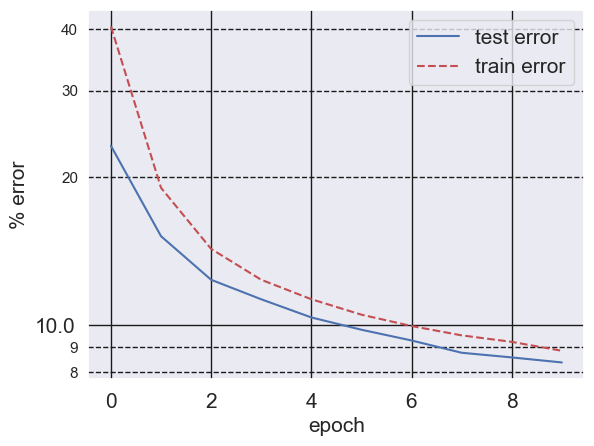

<Figure size 640x480 with 0 Axes>

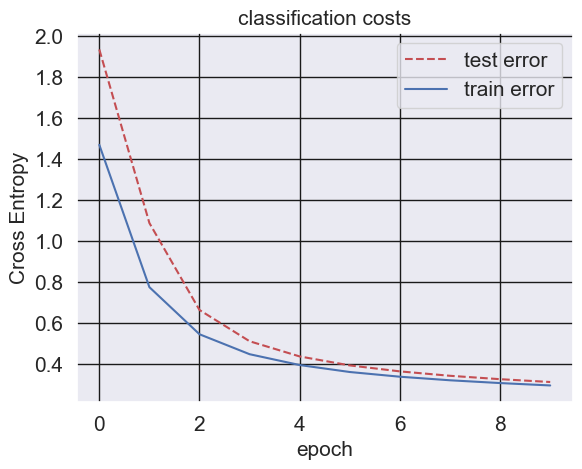

<Figure size 640x480 with 0 Axes>

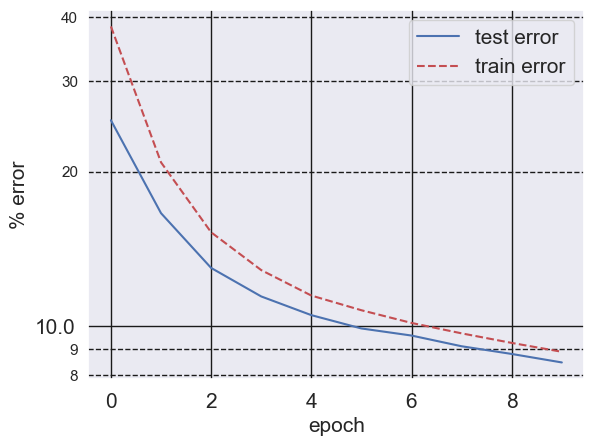

<Figure size 640x480 with 0 Axes>

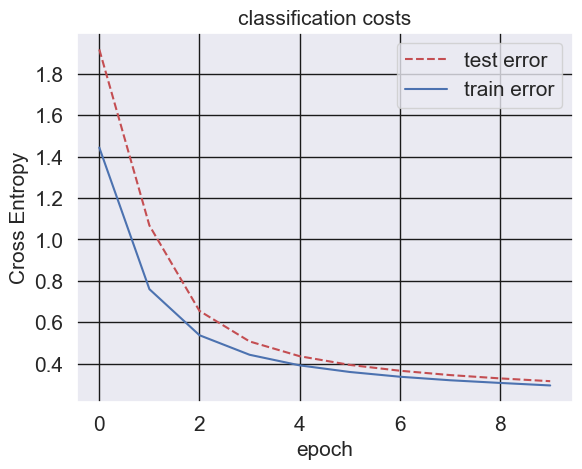

<Figure size 640x480 with 0 Axes>

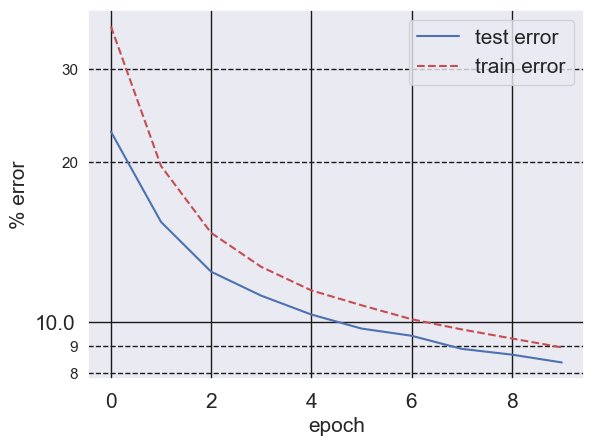

<Figure size 640x480 with 0 Axes>

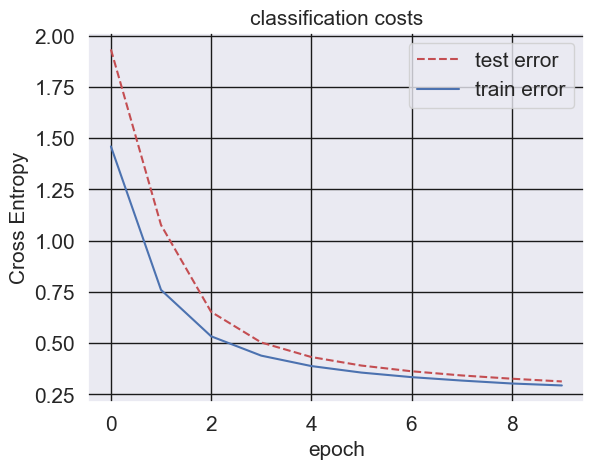

<Figure size 640x480 with 0 Axes>

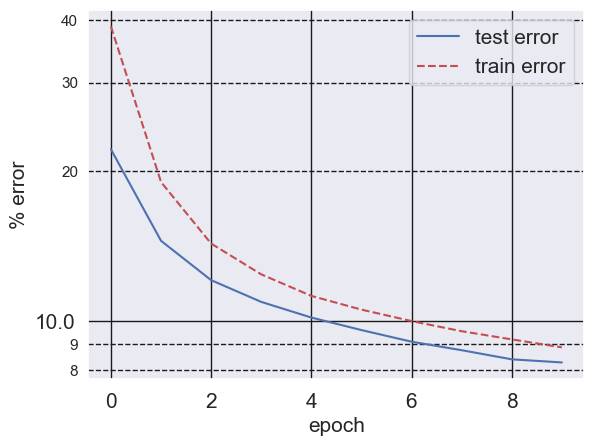

<Figure size 640x480 with 0 Axes>

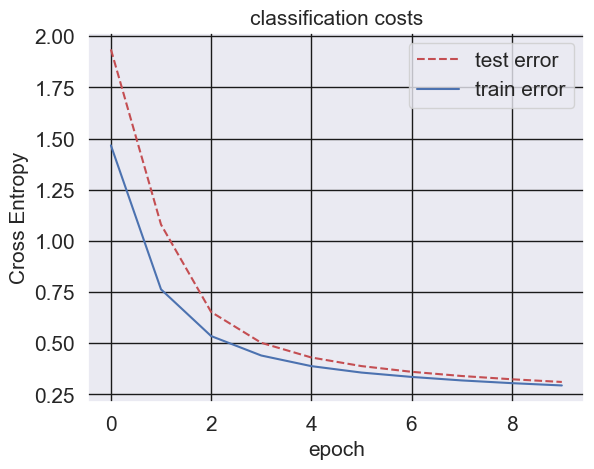

<Figure size 640x480 with 0 Axes>

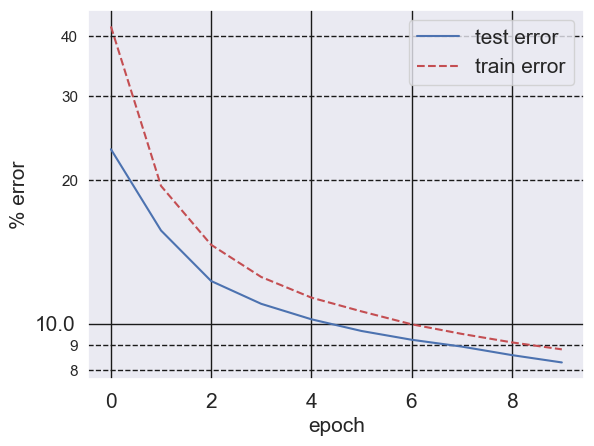

<Figure size 640x480 with 0 Axes>

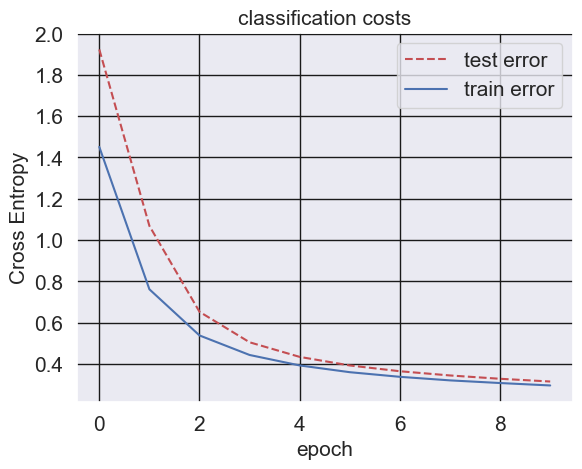

<Figure size 640x480 with 0 Axes>

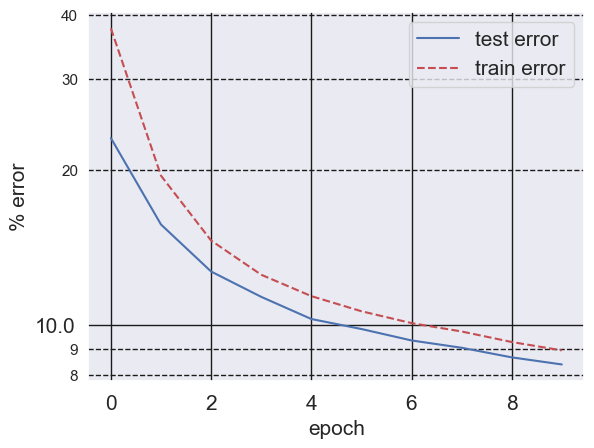

<Figure size 640x480 with 0 Axes>

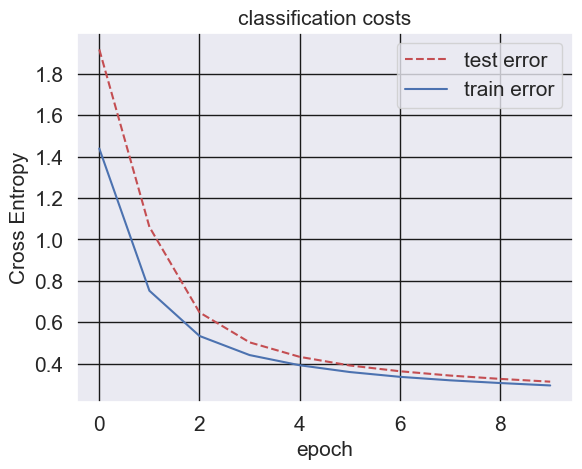

<Figure size 640x480 with 0 Axes>

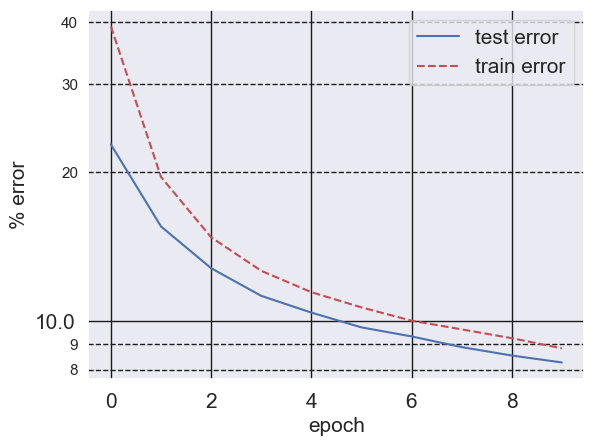

In [17]:
wandb.agent(project = "ensemble_sweep_test_final_g",sweep_id = "vsoz1ssd", function=main, count=12)

#### 

## inference with sampling on test set (performed inside the wandb main function)

In [ ]:
batch_size = 200

if use_cuda:
    valloader = torch.utils.data.DataLoader(valset, batch_size=batch_size, shuffle=False, pin_memory=True, num_workers=4)

else:
    valloader = torch.utils.data.DataLoader(valset, batch_size=batch_size, shuffle=False, pin_memory=False,
                                            num_workers=4)
test_cost = 0  # Note that these are per sample
test_err = 0
nb_samples = 0
test_predictions = np.zeros((10000, 10))

# Nsamples = 90

net.set_mode_train(False)

for j, (x, y) in enumerate(valloader):
    cost, err, probs = net.sample_eval(x, y, weight_set_samples, logits=False) # , logits=True

    test_cost += cost
    test_err += err.cpu().numpy()
    test_predictions[nb_samples:nb_samples+len(x), :] = probs.numpy()
    nb_samples += len(x)

# test_cost /= nb_samples
test_err /= nb_samples
cprint('b', '    Loglike = %5.6f, err = %1.6f\n' % (-test_cost, test_err))


